Berikut **kode Google Colab lengkap dari awal sampai akhir** untuk training model CNN/MobileNetV2, visualisasi dataset, tabel hasil, grafik training, analisis overfitting/underfitting, evaluasi model, confusion matrix, inferensi citra ESP32-CAM dari Drive, dan analisis latency.

Kode ini mengikuti struktur skripsi kamu: kelas yang digunakan adalah **mentah, matang, busuk_alami, busuk_antraknosa**, sesuai batasan penelitian pada draft skripsi yang menyebut klasifikasi kualitas cabai menjadi empat kategori.  Struktur folder juga mengikuti panduan Colab Bab 4, yaitu dataset disimpan di Google Drive pada folder `dataset/raw/nama_kelas`, lalu output berupa tabel, gambar, model, dan log dipakai untuk Bab 4.4 sampai 4.8.

---

## Struktur folder Google Drive

Buat folder seperti ini dulu:

# MobileNetV2 — Versi Final Lengkap Bab III dan Bab IV

Notebook ini mengintegrasikan:

- seleksi 750 citra menjadi dataset layak dan `_rejected`;
- manifest identitas buah/sesi;
- group-aware split;
- audit exact duplicate dan near-duplicate lintas subset;
- validasi label dengan mode indikasi visual atau dua reviewer;
- preprocessing dan augmentasi on-the-fly;
- transfer learning dengan frozen MobileNetV2;
- parameter, FLOPs/MACs, ukuran model Keras dan TFLite;
- training, checkpoint, evaluasi, confusion matrix, dan salah klasifikasi;
- perhitungan manual MobileNetV2 hingga softmax dan cross-entropy;
- visualisasi feature map serta Grad-CAM;
- latency, capture metrics, black-box, dan indeks bukti Bab IV.

**Catatan penting:** pada run pertama, notebook dapat berhenti pada CELL 7A untuk meminta pengisian `group_id_final`. Hal tersebut disengaja agar hasil final tidak memakai random split per file.

## Versi Final Revisi Terintegrasi

Notebook ini telah menggabungkan perbaikan berikut:

- pipeline resize bilinear yang konsisten;
- evaluasi `test_ds` dan evaluasi per file yang wajib sama;
- audit data leakage;
- pemilihan checkpoint berdasarkan `val_loss`;
- verifikasi model terbaik dan model ekspor;
- trace matematis yang disinkronkan;
- latency dengan warm-up dan pemisahan waktu proses;
- analisis capture metrics dari satu sumber;
- black-box aktual untuk pipeline CNN.

**Jalankan Runtime → Run all dari awal. Seluruh output lama telah dikosongkan agar tidak tercampur dengan hasil revisi.**

```text
MyDrive/
└── Skripsi_SmartFarming_Cabai/
    ├── dataset/
    │   └── raw/
    │       ├── mentah/
    │       ├── matang/
    │       ├── busuk_alami/
    │       └── busuk_antraknosa/
    ├── iot_capture/
    │   ├── inbox/
    │   └── logs/
    ├── models/
    └── reports/
        └── bab4/
```

Nama file gambar boleh bebas, tetapi **nama folder kelas harus sesuai**:

```text
mentah
matang
busuk_alami
busuk_antraknosa
```

---

# CELL 0 — Mount Google Drive dan cek GPU

In [ ]:
# ============================================================
# CELL 0 - MOUNT GOOGLE DRIVE DAN CEK GPU
# VERSI AMAN
# ============================================================

from google.colab import drive

# Mount Google Drive tanpa menghapus atau menimpa isi Drive.
drive.mount("/content/drive")

import sys
import platform
import tensorflow as tf
from pathlib import Path

print("Python     :", sys.version)
print("Platform   :", platform.platform())
print("TensorFlow :", tf.__version__)
print("GPU        :", tf.config.list_physical_devices("GPU"))

# Memastikan Google Drive berhasil terhubung.
MY_DRIVE = Path("/content/drive/MyDrive")

if not MY_DRIVE.exists():
    raise RuntimeError(
        "Google Drive belum berhasil terhubung."
    )

print("MyDrive    :", MY_DRIVE)
print("Status     : Google Drive berhasil terhubung.")

Mounted at /content/drive
Python     : 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
Platform   : Linux-6.6.122+-x86_64-with-glibc2.35
TensorFlow : 2.20.0
GPU        : []
MyDrive    : /content/drive/MyDrive
Status     : Google Drive berhasil terhubung.


---

# CELL 1 — Konfigurasi path dan parameter penelitian

In [ ]:
# ============================================================
# CELL 1 - KONFIGURASI PATH DAN PARAMETER PENELITIAN
# ============================================================

from pathlib import Path

# Ubah bagian ini jika nama folder Google Drive kamu berbeda.
ROOT_DIR = Path("/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1")

DATASET_DIR = ROOT_DIR / "dataset"
RAW_DIR = DATASET_DIR / "raw"
SPLIT_DIR = DATASET_DIR / "split"
REJECTED_DIR = DATASET_DIR / "_rejected"
MANIFEST_DIR = DATASET_DIR / "manifest"

TRAIN_DIR = SPLIT_DIR / "train"
VAL_DIR = SPLIT_DIR / "val"
TEST_DIR = SPLIT_DIR / "test"

IOT_DIR = ROOT_DIR / "iot_capture"
IOT_INBOX_DIR = IOT_DIR / "inbox"
IOT_LOG_DIR = IOT_DIR / "logs"

MODEL_DIR = ROOT_DIR / "models"
REPORT_DIR = ROOT_DIR / "reports" / "bab4"

for folder in [
    RAW_DIR,
    SPLIT_DIR,
    REJECTED_DIR,
    MANIFEST_DIR,
    TRAIN_DIR,
    VAL_DIR,
    TEST_DIR,
    IOT_INBOX_DIR,
    IOT_LOG_DIR,
    MODEL_DIR,
    REPORT_DIR
]:
    folder.mkdir(parents=True, exist_ok=True)

# Nama kelas harus sama dengan nama folder dataset.
CLASS_NAMES = [
    "mentah",
    "matang",
    "busuk_alami",
    "busuk_antraknosa"
]

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42
EPOCHS = 50
LEARNING_RATE = 1e-4
DROPOUT_RATE = 0.5
DENSE_UNITS = 128

TEST_SIZE = 0.20
VALIDATION_SIZE_FROM_NON_TEST = 0.20
MIN_CONFIDENCE = 0.70

print("ROOT_DIR:", ROOT_DIR)
print("RAW_DIR:", RAW_DIR)
print("SPLIT_DIR:", SPLIT_DIR)
print("REJECTED_DIR:", REJECTED_DIR)
print("MANIFEST_DIR:", MANIFEST_DIR)
print("REPORT_DIR:", REPORT_DIR)
print("CLASS_NAMES:", CLASS_NAMES)
# ============================================================
# KONFIGURASI VALIDITAS DATASET FINAL
# ============================================================

# Manifest utama untuk specimen/session, label, dan group split.
MASTER_MANIFEST_PATH = (
    MANIFEST_DIR
    / "dataset_master_manifest.csv"
)

LABEL_VALIDATION_PATH = (
    MANIFEST_DIR
    / "label_validation_manifest.csv"
)

# True = training final hanya berjalan setelah group_id_final
# seluruh citra layak telah diisi.
STRICT_FINAL_MODE = True

# True = distribusi aktual wajib sama dengan target lama
# 462 train, 62 validation, dan 150 test.
# Group split dapat membuat jumlah sedikit berbeda, sehingga
# nilai False lebih aman secara metodologis.
REQUIRE_EXACT_SPLIT_COUNTS = False

# Pilihan:
# "visual_indication" = label adalah indikasi visual, bukan diagnosis.
# "two_reviewer" = memerlukan dua pelabel dan Cohen's kappa.
LABEL_VALIDATION_MODE = "visual_indication"

# Batas dHash untuk kandidat citra sangat mirip.
NEAR_DUPLICATE_HAMMING_THRESHOLD = 4

# Jumlah feature map yang divisualisasikan per layer.
FEATURE_MAP_CHANNELS_PER_LAYER = 8

print("STRICT_FINAL_MODE:", STRICT_FINAL_MODE)
print("LABEL_VALIDATION_MODE:", LABEL_VALIDATION_MODE)
print("MASTER_MANIFEST_PATH:", MASTER_MANIFEST_PATH)


ROOT_DIR: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1
RAW_DIR: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/raw
SPLIT_DIR: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/split
REJECTED_DIR: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/_rejected
MANIFEST_DIR: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/manifest
REPORT_DIR: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4
CLASS_NAMES: ['mentah', 'matang', 'busuk_alami', 'busuk_antraknosa']
STRICT_FINAL_MODE: True
LABEL_VALIDATION_MODE: visual_indication
MASTER_MANIFEST_PATH: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/manifest/dataset_master_manifest.csv


---

# CELL 2 — Import library

In [ ]:
# ============================================================
# CELL 2 - IMPORT LIBRARY
# ============================================================

import os
import math
import hashlib
import json
import time
import shutil
import random
import warnings
from datetime import datetime
from itertools import combinations

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageFile

import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    cohen_kappa_score
)

ImageFile.LOAD_TRUNCATED_IMAGES = True
warnings.filterwarnings("ignore")

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("Library siap digunakan.")

Library siap digunakan.


---

# CELL 3 — Fungsi utilitas umum

In [ ]:
# ============================================================
# CELL 3 - FUNGSI UTILITAS UMUM
# ============================================================

VALID_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

CLASS_ALIASES = {
    "mentah": "mentah",
    "muda": "mentah",
    "hijau": "mentah",

    "matang": "matang",
    "merah": "matang",

    "busuk": "busuk_alami",
    "busuk alami": "busuk_alami",
    "busuk_alami": "busuk_alami",
    "busuk-alami": "busuk_alami",

    "antraknosa": "busuk_antraknosa",
    "patek": "busuk_antraknosa",
    "busuk antraknosa": "busuk_antraknosa",
    "busuk_antraknosa": "busuk_antraknosa",
    "busuk-antraknosa": "busuk_antraknosa",
}

def now_str():
    return datetime.now().strftime("%Y%m%d_%H%M%S")

def normalize_class_name(name: str) -> str:
    key = name.strip().lower().replace("-", " ").replace("_", " ")
    key = " ".join(key.split())
    return CLASS_ALIASES.get(key, name.strip().lower().replace(" ", "_"))

def list_image_files(folder: Path):
    if not folder.exists():
        return []

    files = []
    for path in folder.rglob("*"):
        if path.is_file() and path.suffix.lower() in VALID_EXTENSIONS:
            files.append(path)

    return sorted(files)

def is_valid_image(path: Path) -> bool:
    try:
        with Image.open(path) as img:
            img.verify()
        return True
    except Exception:
        return False

def read_image_for_plot(path: Path):
    img = Image.open(path).convert("RGB")
    return np.array(img)

def save_json(data, path: Path):
    path.parent.mkdir(parents=True, exist_ok=True)
    with open(path, "w", encoding="utf-8") as f:
        json.dump(data, f, indent=2, ensure_ascii=False)

print("Fungsi utilitas siap digunakan.")

Fungsi utilitas siap digunakan.


---

# CELL 4 — Membaca dataset raw dan membuat tabel distribusi kelas

Output:

```text
dataset_raw_files.csv
dataset_distribution.csv
```

In [ ]:
# ============================================================
# CELL 4 - MEMBACA DATASET RAW DAN DISTRIBUSI KELAS
# Untuk Bab 4.4 Hasil Akuisisi Dataset
# Output tabel: Kelas, Jumlah Citra, Persentase (%)
# ============================================================

def build_raw_dataframe(raw_dir: Path) -> pd.DataFrame:
    rows = []

    if not raw_dir.exists():
        return pd.DataFrame(rows)

    for class_folder in raw_dir.iterdir():
        if not class_folder.is_dir():
            continue

        class_name = normalize_class_name(class_folder.name)

        if class_name not in CLASS_NAMES:
            print(f"[PERINGATAN] Folder diabaikan: {class_folder.name} -> {class_name}")
            continue

        for img_path in list_image_files(class_folder):
            rows.append({
                "path": str(img_path),
                "file_name": img_path.name,
                "class_name": class_name,
                "source_folder": class_folder.name,
                "extension": img_path.suffix.lower(),
                "file_size_kb": round(img_path.stat().st_size / 1024, 2)
            })

    return pd.DataFrame(rows)


raw_df = build_raw_dataframe(RAW_DIR)

print("Jumlah citra raw:", len(raw_df))

if len(raw_df) == 0:
    print("Dataset belum ditemukan. Pastikan folder berikut sudah berisi gambar:")
    for cls in CLASS_NAMES:
        print(RAW_DIR / cls)

else:
    # Hitung jumlah citra per kelas
    dataset_distribution = (
        raw_df.groupby("class_name")
        .size()
        .reindex(CLASS_NAMES, fill_value=0)
        .reset_index(name="jumlah_citra")
    )

    # Hitung total citra
    total_citra = dataset_distribution["jumlah_citra"].sum()

    # Tambahkan persentase
    dataset_distribution["persentase"] = (
        dataset_distribution["jumlah_citra"] / total_citra * 100
    ).round(2)

    # Ubah nama kelas agar rapi untuk tabel skripsi
    label_map = {
        "mentah": "Mentah",
        "matang": "Matang",
        "busuk_alami": "Busuk alami",
        "busuk_antraknosa": "Busuk antraknosa"
    }

    # Buat tabel khusus untuk Bab 4
    tabel_bab4 = dataset_distribution.copy()
    tabel_bab4["Kelas"] = tabel_bab4["class_name"].map(label_map)
    tabel_bab4["Jumlah Citra"] = tabel_bab4["jumlah_citra"]
    tabel_bab4["Persentase (%)"] = tabel_bab4["persentase"].map(lambda x: f"{x:.2f}")

    tabel_bab4 = tabel_bab4[[
        "Kelas",
        "Jumlah Citra",
        "Persentase (%)"
    ]]

    # Tampilkan tabel
    display(tabel_bab4)

    # Simpan file mentah dan tabel Bab 4
    raw_df.to_csv(REPORT_DIR / "dataset_raw_files.csv", index=False)
    dataset_distribution.to_csv(REPORT_DIR / "dataset_distribution.csv", index=False)
    tabel_bab4.to_csv(REPORT_DIR / "tabel_distribusi_dataset_bab4.csv", index=False)

    # Simpan juga ke Excel agar mudah ditempel ke Word
    tabel_bab4.to_excel(REPORT_DIR / "tabel_distribusi_dataset_bab4.xlsx", index=False)

    print("File disimpan:")
    print(REPORT_DIR / "dataset_raw_files.csv")
    print(REPORT_DIR / "dataset_distribution.csv")
    print(REPORT_DIR / "tabel_distribusi_dataset_bab4.csv")
    print(REPORT_DIR / "tabel_distribusi_dataset_bab4.xlsx")

Jumlah citra raw: 750


,Kelas,Jumlah Citra,Persentase (%)
0,Mentah,188,25.07
1,Matang,188,25.07
2,Busuk alami,187,24.93
3,Busuk antraknosa,187,24.93


File disimpan:
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/dataset_raw_files.csv
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/dataset_distribution.csv
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/tabel_distribusi_dataset_bab4.csv
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/tabel_distribusi_dataset_bab4.xlsx


In [ ]:
print(f"Memverifikasi isi direktori: {RAW_DIR}")

found_classes_info = {}

if RAW_DIR.exists():
    for item in RAW_DIR.iterdir():
        if item.is_dir():
            class_name_normalized = normalize_class_name(item.name)
            image_files = list_image_files(item)

            found_classes_info[item.name] = {
                "normalized_name": class_name_normalized,
                "image_count": len(image_files),
                "is_in_class_names": class_name_normalized in CLASS_NAMES
            }
        else:
            print(f"[INFO] File ditemukan di root RAW_DIR: {item.name}")
else:
    print(f"[ERROR] Direktori RAW_DIR tidak ditemukan: {RAW_DIR}")

if found_classes_info:
    print("\nRingkasan folder di RAW_DIR:")
    for folder_name, info in found_classes_info.items():
        print(f"- Folder: {folder_name:<20} | Nama Ternormalisasi: {info['normalized_name']:<20} | Jumlah Gambar: {info['image_count']:<5} | Ada di CLASS_NAMES: {info['is_in_class_names']}")
else:
    print("Tidak ada folder kelas yang ditemukan di RAW_DIR.")

Memverifikasi isi direktori: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/raw

Ringkasan folder di RAW_DIR:
- Folder: busuk_antraknosa     | Nama Ternormalisasi: busuk_antraknosa     | Jumlah Gambar: 187   | Ada di CLASS_NAMES: True
- Folder: busuk_alami          | Nama Ternormalisasi: busuk_alami          | Jumlah Gambar: 187   | Ada di CLASS_NAMES: True
- Folder: matang               | Nama Ternormalisasi: matang               | Jumlah Gambar: 188   | Ada di CLASS_NAMES: True
- Folder: mentah               | Nama Ternormalisasi: mentah               | Jumlah Gambar: 188   | Ada di CLASS_NAMES: True


---

# CELL 5 — Visualisasi distribusi dataset

Output:

```text
dataset_distribution_bar.png
```

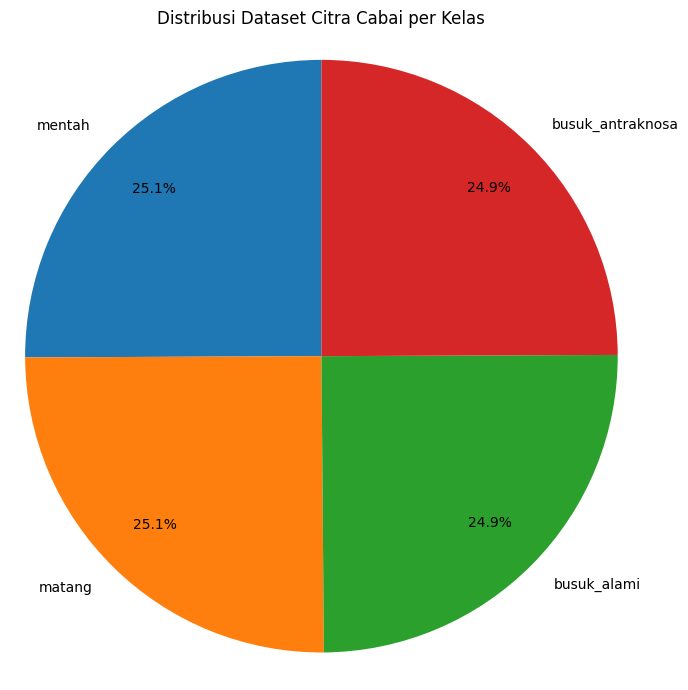

Visualisasi distribusi dataset disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/dataset_distribution_pie.png


In [ ]:
# ============================================================
# CELL 5 - VISUALISASI DISTRIBUSI DATASET
# Untuk Bab 4.4 Distribusi Dataset dan Pelabelan Kelas
# ============================================================

if len(raw_df) > 0:
    dataset_distribution = pd.read_csv(REPORT_DIR / "dataset_distribution.csv")

    plt.figure(figsize=(7, 7))
    plt.pie(
        dataset_distribution["jumlah_citra"],
        labels=dataset_distribution["class_name"],
        autopct="%1.1f%%",
        startangle=90,
        pctdistance=0.8,
        textprops={"fontsize": 10}
    )
    plt.title("Distribusi Dataset Citra Cabai per Kelas")
    plt.axis("equal")  # memastikan pie chart berbentuk lingkaran
    plt.tight_layout()

    out_path = REPORT_DIR / "dataset_distribution_pie.png"
    plt.savefig(out_path, dpi=160, bbox_inches="tight")
    plt.show()

    print("Visualisasi distribusi dataset disimpan ke:", out_path)
else:
    print("Dataset kosong. Visualisasi tidak dibuat.")

---

# CELL 6 — Visualisasi contoh citra per kelas

Output:

```text
sample_dataset.png
```

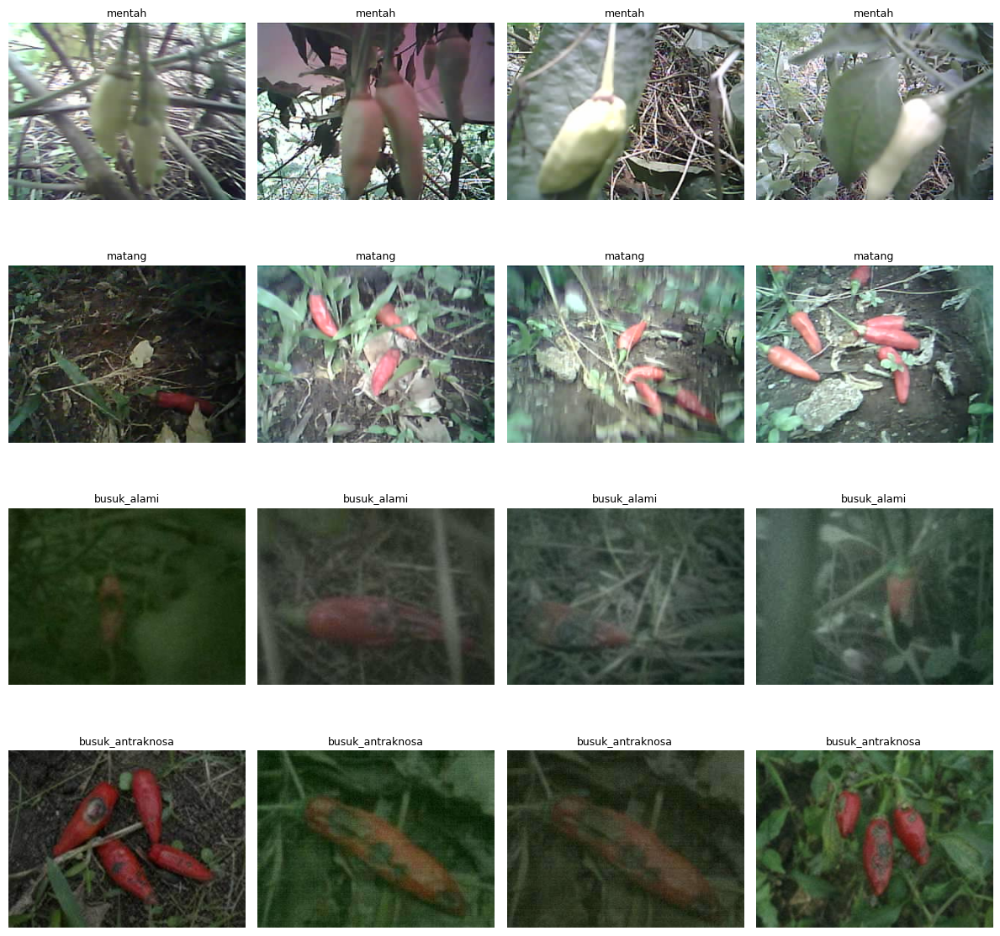

Gambar contoh dataset disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/sample_dataset.png


In [ ]:
# ============================================================
# CELL 6 - VISUALISASI CONTOH CITRA PER KELAS
# Untuk Bab 4.4 Hasil Akuisisi Citra Cabai
# ============================================================

def plot_sample_images(df: pd.DataFrame, samples_per_class=4):
    if df.empty:
        print("DataFrame kosong. Tidak ada citra untuk ditampilkan.")
        return

    n_classes = len(CLASS_NAMES)
    fig, axes = plt.subplots(
        n_classes,
        samples_per_class,
        figsize=(samples_per_class * 3, n_classes * 3)
    )

    if n_classes == 1:
        axes = np.expand_dims(axes, axis=0)

    for row_idx, class_name in enumerate(CLASS_NAMES):
        class_df = df[df["class_name"] == class_name]

        if len(class_df) > 0:
            sample_paths = class_df["path"].sample(
                min(samples_per_class, len(class_df)),
                random_state=SEED
            ).tolist()
        else:
            sample_paths = []

        for col_idx in range(samples_per_class):
            ax = axes[row_idx, col_idx]
            ax.axis("off")

            if col_idx < len(sample_paths):
                img = read_image_for_plot(Path(sample_paths[col_idx]))
                ax.imshow(img)
                ax.set_title(class_name, fontsize=9)
            else:
                ax.set_title(f"{class_name} kosong", fontsize=9)

    plt.tight_layout()
    out_path = REPORT_DIR / "sample_dataset.png"
    plt.savefig(out_path, dpi=160, bbox_inches="tight")
    plt.show()

    print("Gambar contoh dataset disimpan ke:", out_path)

plot_sample_images(raw_df, samples_per_class=4)

---

# CELL 7 — Pembersihan file gambar rusak

Output:

```text
dataset_valid_files.csv
dataset_rejected_files.csv
```

## Seleksi kualitas dan fungsi folder `_rejected`

- `raw` tetap menyimpan seluruh citra asli.
- Citra berstatus **Layak Pakai** dimasukkan ke `valid_df`.
- Citra berstatus **Dibuang** hanya disalin ke `_rejected`.
- `_rejected` adalah arsip dokumentasi dan tidak dibaca oleh model.
- Folder `split` dibuat ulang hanya dari `valid_df`.

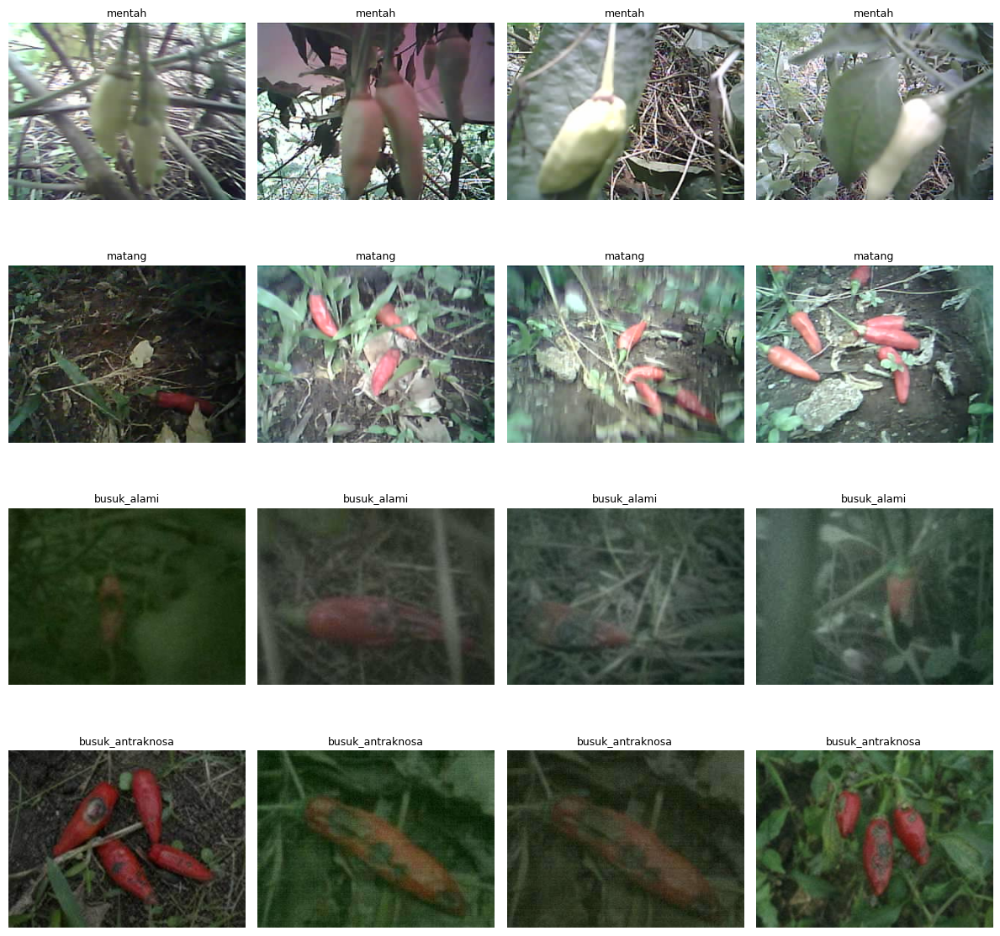

Gambar contoh dataset disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/sample_dataset.png
Jumlah raw     : 750
Jumlah layak   : 672
Jumlah ditolak : 78
[PERINGATAN] Target skripsi adalah 674 layak dan 76 ditolak. Periksa kembali threshold dan keputusan status_final pada manifest.
Folder _rejected berhasil dibuat ulang: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/_rejected
Jumlah salinan pada _rejected: 78


,Kelas,Jumlah Citra Raw,Jumlah Citra Layak Pakai,Citra Dibuang,Alasan Pembuangan
0,Mentah,188,181,7,duplikat
1,Matang,188,184,4,duplikat/gelap
2,Busuk alami,187,133,54,blur/duplikat/gelap
3,Busuk antraknosa,187,174,13,blur/duplikat
4,Total,750,672,78,-



File penting:
- Manifest review : /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/manifest/dataset_quality_review.csv
- Data layak      : /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/dataset_valid_files.csv
- Data ditolak    : /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/dataset_rejected_files.csv
- Folder ditolak  : /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/_rejected
- Tabel Bab IV    : /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/tabel_kelayakan_citra_bab4.xlsx


In [ ]:
# ============================================================
# CELL 6 - VISUALISASI, SELEKSI KUALITAS, DAN FOLDER _rejected
# Untuk Bab 4.4 dan Bab 4.5
#
# ALUR:
# raw (seluruh citra asli)
#   ├── citra layak    -> valid_df -> split/train, val, test
#   └── citra ditolak -> salinan ke dataset/_rejected
#
# PENTING:
# - File pada raw TIDAK dipindahkan atau dihapus.
# - _rejected hanya arsip salinan dan tidak dipakai model.
# ============================================================

from pathlib import Path
import ast
import shutil
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display

# ------------------------------------------------------------
# A. VISUALISASI CONTOH CITRA
# ------------------------------------------------------------
def plot_sample_images(df: pd.DataFrame, samples_per_class: int = 4):
    if df.empty:
        print("DataFrame kosong. Tidak ada citra untuk ditampilkan.")
        return

    n_classes = len(CLASS_NAMES)
    fig, axes = plt.subplots(
        n_classes,
        samples_per_class,
        figsize=(samples_per_class * 3, n_classes * 3)
    )

    if n_classes == 1:
        axes = np.expand_dims(axes, axis=0)

    for row_idx, class_name in enumerate(CLASS_NAMES):
        class_df = df[df["class_name"] == class_name]

        if not class_df.empty:
            sample_paths = class_df["path"].sample(
                n=min(samples_per_class, len(class_df)),
                random_state=SEED
            ).tolist()
        else:
            sample_paths = []

        for col_idx in range(samples_per_class):
            ax = axes[row_idx, col_idx]
            ax.axis("off")

            if col_idx < len(sample_paths):
                img = read_image_for_plot(Path(sample_paths[col_idx]))
                ax.imshow(img)
                ax.set_title(class_name, fontsize=9)
            else:
                ax.set_title(f"{class_name} kosong", fontsize=9)

    plt.tight_layout()
    out_path = REPORT_DIR / "sample_dataset.png"
    plt.savefig(out_path, dpi=160, bbox_inches="tight")
    plt.show()
    print("Gambar contoh dataset disimpan ke:", out_path)


plot_sample_images(raw_df, samples_per_class=4)

# ------------------------------------------------------------
# B. KONFIGURASI SELEKSI KUALITAS
# ------------------------------------------------------------
DARK_THRESHOLD = 35.0
BLUR_THRESHOLD = 15.0

# Apabila True dan file manifest lama tersedia, keputusan status_final
# dari manifest akan digunakan kembali.
USE_EXISTING_REVIEW_MANIFEST = True

MANIFEST_PATH = MANIFEST_DIR / "dataset_quality_review.csv"


def image_hash_simple(img: Image.Image, hash_size: int = 8) -> str:
    """
    Membuat average hash sederhana untuk mendeteksi gambar identik
    atau sangat mirip secara awal.
    """
    gray = img.convert("L").resize((hash_size, hash_size))
    arr = np.asarray(gray)
    average = float(arr.mean())
    bits = arr > average
    return "".join("1" if value else "0" for value in bits.flatten())


def inspect_image_quality(img_path: Path) -> dict:
    """
    Memeriksa:
    1. keterbacaan file;
    2. brightness;
    3. sharpness sederhana;
    4. hash untuk pemeriksaan duplikat.
    """
    try:
        with Image.open(img_path) as image:
            image = image.convert("RGB")
            gray = np.asarray(image.convert("L"), dtype=np.float32)

        brightness = float(gray.mean())

        dx = np.diff(gray, axis=1)
        dy = np.diff(gray, axis=0)
        sharpness = float(np.var(dx) + np.var(dy))

        reasons = []

        if brightness < DARK_THRESHOLD:
            reasons.append("gelap")

        if sharpness < BLUR_THRESHOLD:
            reasons.append("blur")

        return {
            "readable": True,
            "brightness": round(brightness, 4),
            "sharpness": round(sharpness, 4),
            "image_hash": image_hash_simple(image),
            "reasons": reasons,
        }

    except Exception as error:
        return {
            "readable": False,
            "brightness": np.nan,
            "sharpness": np.nan,
            "image_hash": None,
            "reasons": [f"file rusak/tidak terbaca: {error}"],
        }


def normalize_status(value: object) -> str:
    text = str(value).strip().lower()

    accepted_values = {
        "layak",
        "layak pakai",
        "diterima",
        "accepted",
        "valid",
    }

    rejected_values = {
        "dibuang",
        "ditolak",
        "rejected",
        "tidak layak",
        "tidak layak pakai",
        "invalid",
    }

    if text in accepted_values:
        return "Layak Pakai"

    if text in rejected_values:
        return "Dibuang"

    return ""


def parse_reason_list(value: object) -> list:
    if isinstance(value, list):
        return value

    if pd.isna(value):
        return []

    text = str(value).strip()

    if text in {"", "-", "[]"}:
        return []

    try:
        parsed = ast.literal_eval(text)
        if isinstance(parsed, list):
            return [str(item) for item in parsed]
    except (ValueError, SyntaxError):
        pass

    return [part.strip() for part in text.split("/") if part.strip()]


def build_quality_dataframe(raw_dataframe: pd.DataFrame) -> pd.DataFrame:
    if raw_dataframe.empty:
        raise ValueError(
            "raw_df kosong. Pastikan dataset/raw berisi seluruh citra asli."
        )

    rows = []

    for _, row in raw_dataframe.iterrows():
        image_path = Path(row["path"])
        result = inspect_image_quality(image_path)

        rows.append({
            "path": str(image_path),
            "relative_path": str(image_path.relative_to(RAW_DIR)),
            "file_name": row["file_name"],
            "class_name": row["class_name"],
            "brightness": result["brightness"],
            "sharpness": result["sharpness"],
            "image_hash": result["image_hash"],
            "is_duplicate": False,
            "alasan_otomatis": result["reasons"],
        })

    quality = pd.DataFrame(rows)

    # Duplikat diperiksa pada seluruh dataset, bukan hanya satu kelas.
    duplicate_mask = (
        quality["image_hash"].notna()
        & quality.duplicated(subset=["image_hash"], keep="first")
    )

    quality.loc[duplicate_mask, "is_duplicate"] = True

    quality.loc[duplicate_mask, "alasan_otomatis"] = quality.loc[
        duplicate_mask,
        "alasan_otomatis"
    ].apply(
        lambda reasons: list(reasons) + ["duplikat"]
    )

    quality["status_otomatis"] = quality["alasan_otomatis"].apply(
        lambda reasons: "Layak Pakai" if len(reasons) == 0 else "Dibuang"
    )

    quality["alasan_otomatis_text"] = quality["alasan_otomatis"].apply(
        lambda reasons: "-" if len(reasons) == 0 else "/".join(reasons)
    )

    # Default keputusan final mengikuti pemeriksaan otomatis.
    quality["status_final"] = quality["status_otomatis"]
    quality["alasan_final"] = quality["alasan_otomatis_text"]
    quality["reviewer"] = ""
    quality["review_date"] = ""

    return quality


def apply_existing_manifest_review(
    current_quality_df: pd.DataFrame,
    manifest_path: Path
) -> pd.DataFrame:
    """
    Menggunakan kembali status_final yang pernah diperiksa secara manual.
    Pencocokan dilakukan menggunakan relative_path.
    """
    if not USE_EXISTING_REVIEW_MANIFEST or not manifest_path.exists():
        return current_quality_df

    old_manifest = pd.read_csv(manifest_path)

    required_columns = {"relative_path", "status_final"}
    if not required_columns.issubset(old_manifest.columns):
        print(
            "[PERINGATAN] Manifest lama tidak mempunyai relative_path "
            "dan status_final. Keputusan otomatis digunakan."
        )
        return current_quality_df

    review_columns = [
        column for column in [
            "relative_path",
            "status_final",
            "alasan_final",
            "reviewer",
            "review_date",
        ]
        if column in old_manifest.columns
    ]

    reviewed = old_manifest[review_columns].copy()
    reviewed = reviewed.rename(columns={
        "status_final": "status_final_review",
        "alasan_final": "alasan_final_review",
        "reviewer": "reviewer_review",
        "review_date": "review_date_review",
    })

    merged = current_quality_df.merge(
        reviewed,
        on="relative_path",
        how="left"
    )

    if "status_final_review" in merged.columns:
        normalized_review = merged["status_final_review"].apply(normalize_status)
        use_review_mask = normalized_review.ne("")

        merged.loc[use_review_mask, "status_final"] = normalized_review[
            use_review_mask
        ]

    if "alasan_final_review" in merged.columns:
        use_reason_mask = (
            merged["alasan_final_review"].notna()
            & merged["alasan_final_review"].astype(str).str.strip().ne("")
        )
        merged.loc[use_reason_mask, "alasan_final"] = merged.loc[
            use_reason_mask,
            "alasan_final_review"
        ]

    if "reviewer_review" in merged.columns:
        use_mask = merged["reviewer_review"].notna()
        merged.loc[use_mask, "reviewer"] = merged.loc[
            use_mask,
            "reviewer_review"
        ]

    if "review_date_review" in merged.columns:
        use_mask = merged["review_date_review"].notna()
        merged.loc[use_mask, "review_date"] = merged.loc[
            use_mask,
            "review_date_review"
        ]

    drop_columns = [
        column for column in merged.columns
        if column.endswith("_review")
    ]

    return merged.drop(columns=drop_columns)


def validate_quality_decisions(quality_dataframe: pd.DataFrame) -> None:
    normalized = quality_dataframe["status_final"].apply(normalize_status)

    invalid_rows = normalized.eq("")

    if invalid_rows.any():
        invalid_files = quality_dataframe.loc[
            invalid_rows,
            ["relative_path", "status_final"]
        ]

        display(invalid_files)

        raise ValueError(
            "Masih ada status_final yang tidak dikenali. "
            "Gunakan 'Layak Pakai' atau 'Dibuang'."
        )

    quality_dataframe["status_final"] = normalized

    raw_count = len(quality_dataframe)
    valid_count = int(
        (quality_dataframe["status_final"] == "Layak Pakai").sum()
    )
    rejected_count = int(
        (quality_dataframe["status_final"] == "Dibuang").sum()
    )

    if raw_count != valid_count + rejected_count:
        raise AssertionError(
            "Jumlah layak dan ditolak tidak sama dengan jumlah raw."
        )

    print("Jumlah raw     :", raw_count)
    print("Jumlah layak   :", valid_count)
    print("Jumlah ditolak :", rejected_count)

    if raw_count != 750:
        print(
            "[PERINGATAN] Skripsi menyebut 750 citra raw, "
            f"tetapi folder raw saat ini berisi {raw_count} citra."
        )

    if valid_count != 674 or rejected_count != 76:
        print(
            "[PERINGATAN] Target skripsi adalah 674 layak dan 76 ditolak. "
            "Periksa kembali threshold dan keputusan status_final pada manifest."
        )


def rebuild_rejected_directory(
    quality_dataframe: pd.DataFrame
) -> pd.DataFrame:
    """
    Menghapus hasil _rejected lama dan membuat ulang berdasarkan status_final.
    File sumber hanya DISALIN. Seluruh citra asli tetap berada di raw.
    """
    if REJECTED_DIR.exists():
        shutil.rmtree(REJECTED_DIR)

    for class_name in CLASS_NAMES:
        (REJECTED_DIR / class_name).mkdir(
            parents=True,
            exist_ok=True
        )

    rejected = quality_dataframe[
        quality_dataframe["status_final"] == "Dibuang"
    ].copy()

    copied_rows = []

    for _, row in rejected.iterrows():
        source_path = Path(row["path"])

        if not source_path.exists():
            raise FileNotFoundError(
                f"File sumber tidak ditemukan: {source_path}"
            )

        destination_path = (
            REJECTED_DIR
            / row["class_name"]
            / source_path.name
        )

        # Menangani kemungkinan nama file sama.
        if destination_path.exists():
            destination_path = (
                destination_path.parent
                / f"{source_path.stem}_{abs(hash(str(source_path))) % 10**8}"
                  f"{source_path.suffix.lower()}"
            )

        shutil.copy2(source_path, destination_path)

        copied_rows.append({
            "source_path": str(source_path),
            "rejected_path": str(destination_path),
            "relative_path": row["relative_path"],
            "file_name": row["file_name"],
            "class_name": row["class_name"],
            "status_final": row["status_final"],
            "alasan_final": row["alasan_final"],
        })

    rejected_copy_df = pd.DataFrame(copied_rows)

    rejected_copy_df.to_csv(
        REPORT_DIR / "dataset_rejected_files.csv",
        index=False
    )

    print("Folder _rejected berhasil dibuat ulang:", REJECTED_DIR)
    print("Jumlah salinan pada _rejected:", len(rejected_copy_df))

    return rejected_copy_df


def build_quality_summary(
    quality_dataframe: pd.DataFrame
) -> pd.DataFrame:
    label_map = {
        "mentah": "Mentah",
        "matang": "Matang",
        "busuk_alami": "Busuk alami",
        "busuk_antraknosa": "Busuk antraknosa",
    }

    summary_rows = []

    for class_name in CLASS_NAMES:
        class_df = quality_dataframe[
            quality_dataframe["class_name"] == class_name
        ]

        valid_count = int(
            (class_df["status_final"] == "Layak Pakai").sum()
        )
        rejected_count = int(
            (class_df["status_final"] == "Dibuang").sum()
        )

        reasons = sorted({
            reason
            for value in class_df.loc[
                class_df["status_final"] == "Dibuang",
                "alasan_final",
            ]
            for reason in parse_reason_list(value)
        })

        summary_rows.append({
            "Kelas": label_map.get(class_name, class_name),
            "Jumlah Citra Raw": len(class_df),
            "Jumlah Citra Layak Pakai": valid_count,
            "Citra Dibuang": rejected_count,
            "Alasan Pembuangan": "-" if not reasons else "/".join(reasons),
        })

    summary = pd.DataFrame(summary_rows)

    total_row = pd.DataFrame([{
        "Kelas": "Total",
        "Jumlah Citra Raw": int(summary["Jumlah Citra Raw"].sum()),
        "Jumlah Citra Layak Pakai": int(
            summary["Jumlah Citra Layak Pakai"].sum()
        ),
        "Citra Dibuang": int(summary["Citra Dibuang"].sum()),
        "Alasan Pembuangan": "-",
    }])

    return pd.concat([summary, total_row], ignore_index=True)


# ------------------------------------------------------------
# C. JALANKAN SELEKSI KUALITAS
# ------------------------------------------------------------
quality_df = build_quality_dataframe(raw_df)
quality_df = apply_existing_manifest_review(
    quality_df,
    MANIFEST_PATH
)

validate_quality_decisions(quality_df)

# Manifest selalu disimpan ulang agar semua file mempunyai jejak audit.
quality_df.to_csv(MANIFEST_PATH, index=False)
quality_df.to_csv(
    REPORT_DIR / "dataset_quality_detail.csv",
    index=False
)

# Data yang boleh digunakan model.
valid_df = quality_df[
    quality_df["status_final"] == "Layak Pakai"
].copy()

valid_df.to_csv(
    REPORT_DIR / "dataset_valid_files.csv",
    index=False
)

# Arsip salinan data ditolak.
rejected_copy_df = rebuild_rejected_directory(quality_df)

# Tabel ringkas untuk Bab IV.
tabel_kelayakan_citra = build_quality_summary(quality_df)

display(tabel_kelayakan_citra)

tabel_kelayakan_citra.to_csv(
    REPORT_DIR / "tabel_kelayakan_citra_bab4.csv",
    index=False
)

tabel_kelayakan_citra.to_excel(
    REPORT_DIR / "tabel_kelayakan_citra_bab4.xlsx",
    index=False
)

print("\nFile penting:")
print("- Manifest review :", MANIFEST_PATH)
print("- Data layak      :", REPORT_DIR / "dataset_valid_files.csv")
print("- Data ditolak    :", REPORT_DIR / "dataset_rejected_files.csv")
print("- Folder ditolak  :", REJECTED_DIR)
print("- Tabel Bab IV    :", REPORT_DIR / "tabel_kelayakan_citra_bab4.xlsx")

## Manifest final, group split, dan validasi label

Cell berikut membuat `dataset_master_manifest.csv`.

Pada penggunaan pertama:

1. Jalankan notebook sampai cell manifest.
2. Buka file `dataset/manifest/dataset_master_manifest.csv`.
3. Isi `group_id_final` menggunakan identitas buah atau sesi yang sebenarnya.
4. Gunakan ID yang sama untuk seluruh foto dari buah/sesi yang sama.
5. Jalankan kembali cell manifest dan seluruh cell setelahnya.

Kelas `busuk_antraknosa` diperlakukan sebagai **indikasi busuk antraknosa berdasarkan gejala visual**, bukan diagnosis laboratorium. Mode dua pelabel tersedia apabila data penilaian dua reviewer benar-benar dimiliki.

In [ ]:
# ============================================================
# CELL 7A - MASTER MANIFEST, GROUP ID, DAN VALIDASI LABEL
# VERSI LENGKAP DAN DIPERBAIKI
# ============================================================

from pathlib import Path
from itertools import combinations
import hashlib

import numpy as np
import pandas as pd

from PIL import Image
from IPython.display import display

from sklearn.metrics import cohen_kappa_score


# ============================================================
# A. KONFIGURASI CELL
# ============================================================

# True:
# group_id_final yang kosong akan diisi menggunakan
# group_id_suggestion.
AUTO_FILL_GROUP_ID_FROM_SUGGESTION = True

# False:
# notebook tetap dapat berjalan walaupun hasil grouping
# belum diperiksa secara manual.
#
# Ubah menjadi True setelah group_id_final diperiksa untuk
# menghasilkan dataset final skripsi.
REQUIRE_MANUAL_GROUP_REVIEW = False

# Mode label:
# 1. visual_indication:
#    label berdasarkan gejala visual dan folder kelas.
#
# 2. two_reviewer:
#    membutuhkan dua reviewer dan label_final.
if "LABEL_VALIDATION_MODE" not in globals():
    LABEL_VALIDATION_MODE = "visual_indication"

# Threshold dHash untuk kandidat citra sangat mirip.
if "NEAR_DUPLICATE_HAMMING_THRESHOLD" not in globals():
    NEAR_DUPLICATE_HAMMING_THRESHOLD = 5


# ============================================================
# B. VALIDASI VARIABEL DARI CELL SEBELUMNYA
# ============================================================

required_global_variables = [
    "valid_df",
    "CLASS_NAMES",
    "REPORT_DIR",
]

missing_global_variables = [
    variable_name
    for variable_name in required_global_variables
    if variable_name not in globals()
]

if missing_global_variables:
    raise RuntimeError(
        "Variabel berikut belum tersedia: "
        f"{missing_global_variables}. "
        "Jalankan cell konfigurasi dan seleksi kualitas "
        "terlebih dahulu."
    )

REPORT_DIR = Path(REPORT_DIR)
REPORT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

if "MANIFEST_DIR" not in globals():
    MANIFEST_DIR = REPORT_DIR / "manifest"

MANIFEST_DIR = Path(MANIFEST_DIR)
MANIFEST_DIR.mkdir(
    parents=True,
    exist_ok=True
)

if "MASTER_MANIFEST_PATH" not in globals():
    MASTER_MANIFEST_PATH = (
        MANIFEST_DIR
        / "dataset_master_manifest.csv"
    )

if "LABEL_VALIDATION_PATH" not in globals():
    LABEL_VALIDATION_PATH = (
        MANIFEST_DIR
        / "dataset_label_validation.csv"
    )

MASTER_MANIFEST_PATH = Path(
    MASTER_MANIFEST_PATH
)

LABEL_VALIDATION_PATH = Path(
    LABEL_VALIDATION_PATH
)

MASTER_MANIFEST_PATH.parent.mkdir(
    parents=True,
    exist_ok=True
)

LABEL_VALIDATION_PATH.parent.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# C. DEFINISI LABEL PENELITIAN
# ============================================================

LABEL_DISPLAY_NAMES = {
    "mentah": "Mentah",
    "matang": "Matang",
    "busuk_alami": "Busuk alami",
    "busuk_antraknosa": (
        "Indikasi busuk antraknosa "
        "berdasarkan gejala visual"
    ),
}

ALLOWED_LABELS = set(
    CLASS_NAMES
)


# ============================================================
# D. FUNGSI HASH CITRA
# ============================================================

def sha256_path(
    file_path: Path
) -> str:
    """
    Menghasilkan SHA-256 untuk mendeteksi file
    yang identik secara biner.
    """
    digest = hashlib.sha256()

    with open(
        file_path,
        "rb"
    ) as file:
        for chunk in iter(
            lambda: file.read(
                1024 * 1024
            ),
            b""
        ):
            digest.update(
                chunk
            )

    return digest.hexdigest()


def difference_hash(
    file_path: Path,
    hash_size: int = 8
) -> str:
    """
    Menghasilkan difference hash atau dHash
    untuk mendeteksi kandidat citra yang mirip.
    """
    if hasattr(
        Image,
        "Resampling"
    ):
        resampling_method = (
            Image.Resampling.LANCZOS
        )
    else:
        resampling_method = (
            Image.LANCZOS
        )

    with Image.open(
        file_path
    ) as image:
        gray_image = (
            image
            .convert("L")
            .resize(
                (
                    hash_size + 1,
                    hash_size,
                ),
                resampling_method
            )
        )

    image_array = np.asarray(
        gray_image,
        dtype=np.int16
    )

    differences = (
        image_array[:, 1:]
        >
        image_array[:, :-1]
    )

    return "".join(
        "1" if value else "0"
        for value in differences.flatten()
    )


def hamming_distance(
    hash_a: str,
    hash_b: str
) -> int:
    """
    Menghitung jumlah bit berbeda antara
    dua nilai hash.
    """
    if not hash_a or not hash_b:
        return 9999

    if len(hash_a) != len(hash_b):
        return 9999

    return sum(
        value_a != value_b
        for value_a, value_b in zip(
            hash_a,
            hash_b
        )
    )


# ============================================================
# E. MEMBENTUK KANDIDAT KELOMPOK DUPLIKAT
# ============================================================

def build_near_duplicate_groups(
    dataframe: pd.DataFrame
) -> pd.DataFrame:
    """
    Membentuk connected component berdasarkan dHash
    di dalam kelas yang sama.

    Hasil duplicate_group_auto hanya merupakan kandidat.
    Keputusan akhir tetap dapat diperbaiki melalui manifest.
    """
    result = (
        dataframe
        .copy()
        .reset_index(drop=True)
    )

    parent = list(
        range(len(result))
    )

    def find(
        index: int
    ) -> int:
        while parent[index] != index:
            parent[index] = parent[
                parent[index]
            ]

            index = parent[index]

        return index

    def union(
        left: int,
        right: int
    ) -> None:
        root_left = find(left)
        root_right = find(right)

        if root_left != root_right:
            parent[root_right] = (
                root_left
            )

    for class_name in CLASS_NAMES:
        class_indices = (
            result.index[
                result[
                    "class_name_original"
                ]
                == class_name
            ]
            .tolist()
        )

        for (
            left_position,
            right_position
        ) in combinations(
            class_indices,
            2
        ):
            left_hash = result.at[
                left_position,
                "dhash"
            ]

            right_hash = result.at[
                right_position,
                "dhash"
            ]

            distance = hamming_distance(
                left_hash,
                right_hash
            )

            if (
                distance
                <=
                NEAR_DUPLICATE_HAMMING_THRESHOLD
            ):
                union(
                    left_position,
                    right_position
                )

    component_members = {}

    for index in range(
        len(result)
    ):
        root = find(index)

        component_members.setdefault(
            root,
            []
        ).append(index)

    duplicate_group_values = [
        ""
    ] * len(result)

    group_counter = 1

    for members in (
        component_members.values()
    ):
        if len(members) <= 1:
            continue

        class_name = result.at[
            members[0],
            "class_name_original"
        ]

        group_name = (
            f"DUP_{class_name}_"
            f"{group_counter:04d}"
        )

        for index in members:
            duplicate_group_values[
                index
            ] = group_name

        group_counter += 1

    result[
        "duplicate_group_auto"
    ] = duplicate_group_values

    return result


# ============================================================
# F. FUNGSI NORMALISASI NILAI BOOLEAN
# ============================================================

def normalized_yes(
    value: object
) -> bool:
    return (
        str(value)
        .strip()
        .lower()
        in {
            "ya",
            "yes",
            "y",
            "true",
            "1",
            "sudah",
        }
    )


# ============================================================
# G. MEMBANGUN MASTER MANIFEST
# ============================================================

required_valid_df_columns = {
    "path",
    "relative_path",
    "file_name",
    "class_name",
    "status_final",
    "alasan_final",
}

missing_valid_df_columns = (
    required_valid_df_columns
    - set(valid_df.columns)
)

if missing_valid_df_columns:
    raise ValueError(
        "Kolom valid_df belum lengkap: "
        f"{sorted(missing_valid_df_columns)}"
    )

master_df = valid_df[
    [
        "path",
        "relative_path",
        "file_name",
        "class_name",
        "status_final",
        "alasan_final",
    ]
].copy()

master_df = master_df.rename(
    columns={
        "class_name":
        "class_name_original"
    }
)

print(
    "Menghitung SHA-256..."
)

master_df["sha256"] = (
    master_df["path"]
    .apply(
        lambda value:
        sha256_path(
            Path(value)
        )
    )
)

print(
    "Menghitung dHash..."
)

master_df["dhash"] = (
    master_df["path"]
    .apply(
        lambda value:
        difference_hash(
            Path(value)
        )
    )
)

print(
    "Membentuk kandidat kelompok "
    "citra mirip..."
)

master_df = (
    build_near_duplicate_groups(
        master_df
    )
)


# ============================================================
# H. KOLOM REVIEW MANUAL
# ============================================================

review_columns = [
    "specimen_id",
    "session_id",
    "duplicate_group",
    "group_id_final",
    "group_basis",
    "group_reviewed",
    "label_reviewer_1",
    "label_reviewer_2",
    "label_final",
    "label_basis",
    "label_reviewer_1_name",
    "label_reviewer_1_qualification",
    "label_reviewer_2_name",
    "label_reviewer_2_qualification",
    "label_review_date",
    "label_notes",
]

for column in review_columns:
    master_df[column] = ""


# ============================================================
# I. MEMUAT REVIEW DARI MANIFEST SEBELUMNYA
# ============================================================

if MASTER_MANIFEST_PATH.exists():
    previous_manifest = pd.read_csv(
        MASTER_MANIFEST_PATH,
        dtype=str
    ).fillna("")

    if (
        "relative_path"
        not in previous_manifest.columns
    ):
        raise ValueError(
            "Manifest lama tidak mempunyai "
            "kolom relative_path."
        )

    previous_manifest = (
        previous_manifest
        .drop_duplicates(
            subset=["relative_path"],
            keep="last"
        )
    )

    available_review_columns = [
        column
        for column in review_columns
        if column
        in previous_manifest.columns
    ]

    old_review = previous_manifest[
        ["relative_path"]
        + available_review_columns
    ].copy()

    master_df = (
        master_df
        .drop(
            columns=
            available_review_columns,
            errors="ignore"
        )
        .merge(
            old_review,
            on="relative_path",
            how="left",
            validate="one_to_one"
        )
    )

    for column in review_columns:
        if column not in master_df.columns:
            master_df[column] = ""

        master_df[column] = (
            master_df[column]
            .fillna("")
            .astype(str)
        )

    print(
        "Review lama berhasil dimuat dari:",
        MASTER_MANIFEST_PATH
    )


# ============================================================
# J. MENENTUKAN DUPLICATE GROUP FINAL
# ============================================================

manual_duplicate_mask = (
    master_df["duplicate_group"]
    .astype(str)
    .str.strip()
    .ne("")
)

master_df["duplicate_group"] = (
    np.where(
        manual_duplicate_mask,
        master_df[
            "duplicate_group"
        ],
        master_df[
            "duplicate_group_auto"
        ]
    )
)


# ============================================================
# K. MEMBUAT GROUP ID SUGGESTION
# ============================================================

master_df[
    "group_id_suggestion"
] = ""

has_specimen = (
    master_df["specimen_id"]
    .astype(str)
    .str.strip()
    .ne("")
)

has_session = (
    master_df["session_id"]
    .astype(str)
    .str.strip()
    .ne("")
)

has_duplicate_group = (
    master_df[
        "duplicate_group"
    ]
    .astype(str)
    .str.strip()
    .ne("")
)

# Prioritas 1: identitas buah.
master_df.loc[
    has_specimen,
    "group_id_suggestion"
] = (
    "SPECIMEN::"
    + master_df.loc[
        has_specimen,
        "specimen_id"
    ]
    .astype(str)
    .str.strip()
)

# Prioritas 2: sesi pemotretan.
master_df.loc[
    ~has_specimen
    & has_session,
    "group_id_suggestion"
] = (
    "SESSION::"
    + master_df.loc[
        ~has_specimen
        & has_session,
        "session_id"
    ]
    .astype(str)
    .str.strip()
)

# Prioritas 3: kandidat duplikat.
master_df.loc[
    ~has_specimen
    & ~has_session
    & has_duplicate_group,
    "group_id_suggestion"
] = (
    "DUPLICATE::"
    + master_df.loc[
        ~has_specimen
        & ~has_session
        & has_duplicate_group,
        "duplicate_group"
    ]
    .astype(str)
    .str.strip()
)

# Prioritas 4: citra dianggap unik.
remaining_group_mask = (
    master_df[
        "group_id_suggestion"
    ]
    .astype(str)
    .str.strip()
    .eq("")
)

master_df.loc[
    remaining_group_mask,
    "group_id_suggestion"
] = (
    "UNIQUE_IMAGE::"
    + master_df.loc[
        remaining_group_mask,
        "relative_path"
    ]
    .astype(str)
)


# ============================================================
# L. VALIDASI LABEL
# ============================================================

if (
    LABEL_VALIDATION_MODE
    == "visual_indication"
):
    blank_label_mask = (
        master_df["label_final"]
        .astype(str)
        .str.strip()
        .eq("")
    )

    master_df.loc[
        blank_label_mask,
        "label_final"
    ] = master_df.loc[
        blank_label_mask,
        "class_name_original"
    ]

    blank_basis_mask = (
        master_df["label_basis"]
        .astype(str)
        .str.strip()
        .eq("")
    )

    master_df.loc[
        blank_basis_mask,
        "label_basis"
    ] = (
        "Pelabelan operasional berdasarkan "
        "gejala visual dan kelas sesi "
        "pengambilan. Tidak dilakukan "
        "diagnosis laboratorium."
    )

elif (
    LABEL_VALIDATION_MODE
    == "two_reviewer"
):
    required_reviewer_columns = [
        "label_reviewer_1",
        "label_reviewer_2",
        "label_final",
    ]

    incomplete_reviewer_mask = (
        pd.Series(
            False,
            index=master_df.index
        )
    )

    for column in (
        required_reviewer_columns
    ):
        incomplete_reviewer_mask |= (
            master_df[column]
            .astype(str)
            .str.strip()
            .eq("")
        )

    if incomplete_reviewer_mask.any():
        master_df.to_csv(
            MASTER_MANIFEST_PATH,
            index=False
        )

        display(
            master_df.loc[
                incomplete_reviewer_mask,
                [
                    "relative_path",
                    "label_reviewer_1",
                    "label_reviewer_2",
                    "label_final",
                ]
            ].head(30)
        )

        raise RuntimeError(
            "Mode two_reviewer aktif, "
            "tetapi data reviewer belum "
            "lengkap. Lengkapi manifest "
            "kemudian jalankan ulang."
        )

else:
    raise ValueError(
        "LABEL_VALIDATION_MODE harus "
        "'visual_indication' atau "
        "'two_reviewer'."
    )


# ============================================================
# M. MEMERIKSA LABEL FINAL
# ============================================================

invalid_final_label_mask = (
    ~master_df["label_final"]
    .isin(ALLOWED_LABELS)
)

if invalid_final_label_mask.any():
    display(
        master_df.loc[
            invalid_final_label_mask,
            [
                "relative_path",
                "class_name_original",
                "label_final",
            ]
        ]
    )

    raise ValueError(
        "Ditemukan label_final yang "
        "tidak termasuk CLASS_NAMES."
    )


# ============================================================
# N. MENGHITUNG COHEN'S KAPPA
# ============================================================

kappa_value = np.nan
reviewer_complete_count = 0
reviewer_disagreement_count = 0

reviewer_complete_mask = (
    master_df[
        "label_reviewer_1"
    ].isin(ALLOWED_LABELS)
    &
    master_df[
        "label_reviewer_2"
    ].isin(ALLOWED_LABELS)
)

reviewer_complete_count = int(
    reviewer_complete_mask.sum()
)

if reviewer_complete_count > 0:
    reviewer_1 = master_df.loc[
        reviewer_complete_mask,
        "label_reviewer_1"
    ]

    reviewer_2 = master_df.loc[
        reviewer_complete_mask,
        "label_reviewer_2"
    ]

    kappa_value = float(
        cohen_kappa_score(
            reviewer_1,
            reviewer_2,
            labels=CLASS_NAMES
        )
    )

    reviewer_disagreement_count = int(
        (
            reviewer_1
            != reviewer_2
        ).sum()
    )


# ============================================================
# O. RINGKASAN VALIDASI LABEL
# ============================================================

label_validation_summary_df = (
    pd.DataFrame([
        {
            "mode_validasi":
            LABEL_VALIDATION_MODE,

            "jumlah_citra_layak":
            len(master_df),

            "jumlah_label_final":
            int(
                master_df[
                    "label_final"
                ]
                .isin(ALLOWED_LABELS)
                .sum()
            ),

            "jumlah_dinilai_dua_reviewer":
            reviewer_complete_count,

            "jumlah_perbedaan_reviewer":
            reviewer_disagreement_count,

            "cohen_kappa":
            kappa_value,

            "diagnosis_laboratorium":
            False,

            "istilah_antraknosa_untuk_skripsi":
            (
                "Indikasi busuk antraknosa "
                "berdasarkan gejala visual"
            ),
        }
    ])
)


# ============================================================
# P. DEFINISI OPERASIONAL KELAS
# ============================================================

label_definition_df = pd.DataFrame([
    {
        "kode_kelas":
        "mentah",

        "nama_dalam_skripsi":
        "Mentah",

        "definisi_operasional":
        (
            "Citra buah yang memenuhi "
            "kriteria visual kelas mentah "
            "pada penelitian."
        ),

        "catatan":
        (
            "Kriteria warna, tekstur, dan "
            "bentuk harus diselaraskan "
            "dengan sumber ilmiah pada "
            "Bab III."
        ),
    },
    {
        "kode_kelas":
        "matang",

        "nama_dalam_skripsi":
        "Matang",

        "definisi_operasional":
        (
            "Citra buah yang memenuhi "
            "kriteria visual kelas matang "
            "pada penelitian."
        ),

        "catatan":
        (
            "Kriteria warna, tekstur, dan "
            "bentuk harus diselaraskan "
            "dengan sumber ilmiah pada "
            "Bab III."
        ),
    },
    {
        "kode_kelas":
        "busuk_alami",

        "nama_dalam_skripsi":
        "Busuk alami",

        "definisi_operasional":
        (
            "Citra buah dengan gejala "
            "pembusukan yang dikategorikan "
            "sebagai non-antraknosa "
            "berdasarkan kriteria visual."
        ),

        "catatan":
        (
            "Bukan penetapan penyebab "
            "biologis tanpa pemeriksaan "
            "laboratorium."
        ),
    },
    {
        "kode_kelas":
        "busuk_antraknosa",

        "nama_dalam_skripsi":
        (
            "Indikasi busuk antraknosa "
            "berdasarkan gejala visual"
        ),

        "definisi_operasional":
        (
            "Citra buah dengan gejala visual "
            "yang memenuhi kriteria indikasi "
            "antraknosa pada penelitian."
        ),

        "catatan":
        (
            "Bukan diagnosis patogen karena "
            "tidak dilakukan pemeriksaan "
            "laboratorium."
        ),
    },
])


# ============================================================
# Q. FINALISASI GROUP ID
# ============================================================

blank_group_mask = (
    master_df["group_id_final"]
    .astype(str)
    .str.strip()
    .eq("")
)

print(
    "Jumlah group_id_final kosong:",
    int(blank_group_mask.sum())
)

if blank_group_mask.any():
    # Menyimpan daftar untuk pemeriksaan.
    group_review_file = (
        REPORT_DIR
        / "group_id_belum_diisi.xlsx"
    )

    master_df.loc[
        blank_group_mask
    ].to_excel(
        group_review_file,
        index=False
    )

    display(
        master_df.loc[
            blank_group_mask,
            [
                "relative_path",
                "class_name_original",
                "specimen_id",
                "session_id",
                "duplicate_group",
                "group_id_suggestion",
                "group_id_final",
            ]
        ].head(30)
    )

    print(
        "Daftar group kosong disimpan:",
        group_review_file
    )

    if (
        AUTO_FILL_GROUP_ID_FROM_SUGGESTION
    ):
        master_df.loc[
            blank_group_mask,
            "group_id_final"
        ] = master_df.loc[
            blank_group_mask,
            "group_id_suggestion"
        ]

        master_df.loc[
            blank_group_mask,
            "group_basis"
        ] = (
            "PROVISIONAL_AUTO_SUGGESTION"
        )

        master_df.loc[
            blank_group_mask,
            "group_reviewed"
        ] = "belum"

        print(
            "group_id_final kosong telah "
            "diisi menggunakan suggestion."
        )

    else:
        master_df.to_csv(
            MASTER_MANIFEST_PATH,
            index=False
        )

        raise RuntimeError(
            "group_id_final masih kosong. "
            "Lengkapi manifest lalu "
            "jalankan kembali cell."
        )


# ============================================================
# R. MEMASTIKAN TIDAK ADA GROUP KOSONG
# ============================================================

remaining_blank_group_mask = (
    master_df["group_id_final"]
    .astype(str)
    .str.strip()
    .eq("")
)

if remaining_blank_group_mask.any():
    raise RuntimeError(
        "Masih terdapat group_id_final "
        "yang kosong."
    )


# ============================================================
# S. MELENGKAPI BASIS GROUP LAMA
# ============================================================

existing_group_without_basis = (
    master_df["group_id_final"]
    .astype(str)
    .str.strip()
    .ne("")
    &
    master_df["group_basis"]
    .astype(str)
    .str.strip()
    .eq("")
)

master_df.loc[
    existing_group_without_basis,
    "group_basis"
] = "MANUAL_OR_PREVIOUS_MANIFEST"


# ============================================================
# T. VALIDASI REVIEW MANUAL
# ============================================================

group_reviewed_mask = (
    master_df["group_reviewed"]
    .apply(normalized_yes)
)

unreviewed_group_mask = (
    ~group_reviewed_mask
)

if (
    REQUIRE_MANUAL_GROUP_REVIEW
    and unreviewed_group_mask.any()
):
    unreviewed_path = (
        REPORT_DIR
        / "group_id_belum_direview.xlsx"
    )

    master_df.loc[
        unreviewed_group_mask
    ].to_excel(
        unreviewed_path,
        index=False
    )

    master_df.to_csv(
        MASTER_MANIFEST_PATH,
        index=False
    )

    print(
        "Jumlah group belum ditinjau:",
        int(
            unreviewed_group_mask.sum()
        )
    )

    raise RuntimeError(
        "REQUIRE_MANUAL_GROUP_REVIEW=True, "
        "tetapi masih terdapat group yang "
        "belum ditinjau. Periksa manifest, "
        "isi group_reviewed='ya', kemudian "
        "jalankan ulang."
    )


# ============================================================
# U. MEMBUAT SPLIT GROUP KEY
# ============================================================

# Prefix label digunakan agar nama group yang sama
# pada kelas berbeda tidak dianggap satu kelompok.
master_df["split_group_key"] = (
    master_df["label_final"]
    .astype(str)
    +
    "::"
    +
    master_df["group_id_final"]
    .astype(str)
)


# ============================================================
# V. MENYIMPAN MASTER MANIFEST FINAL
# ============================================================

master_df.to_csv(
    MASTER_MANIFEST_PATH,
    index=False
)

master_df.to_csv(
    LABEL_VALIDATION_PATH,
    index=False
)

label_validation_summary_df.to_csv(
    REPORT_DIR
    / "label_validation_summary.csv",
    index=False
)

label_definition_df.to_csv(
    REPORT_DIR
    / "label_operational_definition.csv",
    index=False
)

with pd.ExcelWriter(
    REPORT_DIR
    / "dataset_master_manifest.xlsx"
) as writer:
    master_df.to_excel(
        writer,
        sheet_name="Master_Manifest",
        index=False
    )

    label_validation_summary_df.to_excel(
        writer,
        sheet_name="Validasi_Label",
        index=False
    )

    label_definition_df.to_excel(
        writer,
        sheet_name="Definisi_Kelas",
        index=False
    )


# ============================================================
# W. MEMBENTUK DATASET FINAL TERVALIDASI
# ============================================================

columns_to_remove_from_valid_df = [
    "class_name_original",
    "label_final",
    "specimen_id",
    "session_id",
    "duplicate_group",
    "group_id_final",
    "group_basis",
    "group_reviewed",
    "split_group_key",
    "sha256",
    "dhash",
    "label_basis",
]

valid_df = valid_df.drop(
    columns=[
        column
        for column
        in columns_to_remove_from_valid_df
        if column in valid_df.columns
    ]
)

manifest_merge_columns = [
    "relative_path",
    "class_name_original",
    "label_final",
    "specimen_id",
    "session_id",
    "duplicate_group",
    "group_id_final",
    "group_basis",
    "group_reviewed",
    "split_group_key",
    "sha256",
    "dhash",
    "label_basis",
]

valid_df = valid_df.merge(
    master_df[
        manifest_merge_columns
    ],
    on="relative_path",
    how="left",
    validate="one_to_one"
)

valid_df["class_name"] = (
    valid_df["label_final"]
)

dataset_final_path = (
    REPORT_DIR
    / "dataset_final_validated.csv"
)

valid_df.to_csv(
    dataset_final_path,
    index=False
)


# ============================================================
# X. VALIDASI AKHIR
# ============================================================

if len(valid_df) != len(master_df):
    raise AssertionError(
        "Jumlah valid_df tidak sama dengan "
        "master manifest."
    )

if valid_df[
    "label_final"
].isna().any():
    raise AssertionError(
        "Terdapat label_final kosong setelah merge."
    )

if valid_df[
    "split_group_key"
].isna().any():
    raise AssertionError(
        "Terdapat split_group_key kosong "
        "setelah merge."
    )

group_summary_df = pd.DataFrame([{
    "jumlah_citra_final":
    len(valid_df),

    "jumlah_group_final":
    int(
        valid_df[
            "split_group_key"
        ].nunique()
    ),

    "jumlah_group_auto_provisional":
    int(
        (
            valid_df["group_basis"]
            ==
            "PROVISIONAL_AUTO_SUGGESTION"
        ).sum()
    ),

    "jumlah_group_direview":
    int(
        valid_df[
            "group_reviewed"
        ]
        .apply(normalized_yes)
        .sum()
    ),

    "manual_review_required":
    REQUIRE_MANUAL_GROUP_REVIEW,
}])

group_summary_df.to_csv(
    REPORT_DIR
    / "group_validation_summary.csv",
    index=False
)


# ============================================================
# Y. MENAMPILKAN HASIL
# ============================================================

print("\nCELL 7A SELESAI")
print(
    "Master manifest:",
    MASTER_MANIFEST_PATH
)

print(
    "Dataset final tervalidasi:",
    dataset_final_path
)

print(
    "Jumlah citra final:",
    len(valid_df)
)

print(
    "Jumlah group final:",
    valid_df[
        "split_group_key"
    ].nunique()
)

print(
    "Jumlah group provisional:",
    int(
        (
            valid_df["group_basis"]
            ==
            "PROVISIONAL_AUTO_SUGGESTION"
        ).sum()
    )
)

print(
    "Mode validasi label:",
    LABEL_VALIDATION_MODE
)

print(
    "Manual group review diwajibkan:",
    REQUIRE_MANUAL_GROUP_REVIEW
)

display(
    label_validation_summary_df
)

display(
    label_definition_df
)

display(
    group_summary_df
)

display(
    master_df[
        [
            "relative_path",
            "class_name_original",
            "label_final",
            "group_id_suggestion",
            "group_id_final",
            "group_basis",
            "group_reviewed",
        ]
    ].head(20)
)

Menghitung SHA-256...
Menghitung dHash...
Membentuk kandidat kelompok citra mirip...
Jumlah group_id_final kosong: 672


,relative_path,class_name_original,specimen_id,session_id,duplicate_group,group_id_suggestion,group_id_final
0,busuk_antraknosa/cabai_20260610_132739.jpg,busuk_antraknosa,,,DUP_busuk_antraknosa_0001,DUPLICATE::DUP_busuk_antraknosa_0001,
1,busuk_antraknosa/cabai_20260610_132754.jpg,busuk_antraknosa,,,DUP_busuk_antraknosa_0002,DUPLICATE::DUP_busuk_antraknosa_0002,
2,busuk_antraknosa/cabai_20260610_132812.jpg,busuk_antraknosa,,,,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,
3,busuk_antraknosa/cabai_20260610_132830.jpg,busuk_antraknosa,,,DUP_busuk_antraknosa_0003,DUPLICATE::DUP_busuk_antraknosa_0003,
4,busuk_antraknosa/cabai_20260610_132845.jpg,busuk_antraknosa,,,,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,
5,busuk_antraknosa/cabai_20260610_132901.jpg,busuk_antraknosa,,,,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,
6,busuk_antraknosa/cabai_20260610_132919.jpg,busuk_antraknosa,,,DUP_busuk_antraknosa_0004,DUPLICATE::DUP_busuk_antraknosa_0004,
7,busuk_antraknosa/cabai_20260610_132937.jpg,busuk_antraknosa,,,,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,
8,busuk_antraknosa/cabai_20260610_132954.jpg,busuk_antraknosa,,,,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,
9,busuk_antraknosa/cabai_20260610_133025.jpg,busuk_antraknosa,,,DUP_busuk_antraknosa_0005,DUPLICATE::DUP_busuk_antraknosa_0005,


Daftar group kosong disimpan: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/group_id_belum_diisi.xlsx
group_id_final kosong telah diisi menggunakan suggestion.

CELL 7A SELESAI
Master manifest: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/manifest/dataset_master_manifest.csv
Dataset final tervalidasi: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/dataset_final_validated.csv
Jumlah citra final: 672
Jumlah group final: 616
Jumlah group provisional: 672
Mode validasi label: visual_indication
Manual group review diwajibkan: False


,mode_validasi,jumlah_citra_layak,jumlah_label_final,jumlah_dinilai_dua_reviewer,jumlah_perbedaan_reviewer,cohen_kappa,diagnosis_laboratorium,istilah_antraknosa_untuk_skripsi
0,visual_indication,672,672,0,0,NaN,False,Indikasi busuk antraknosa berdasarkan gejala v...


,kode_kelas,nama_dalam_skripsi,definisi_operasional,catatan
0,mentah,Mentah,Citra buah yang memenuhi kriteria visual kelas...,"Kriteria warna, tekstur, dan bentuk harus dise..."
1,matang,Matang,Citra buah yang memenuhi kriteria visual kelas...,"Kriteria warna, tekstur, dan bentuk harus dise..."
2,busuk_alami,Busuk alami,Citra buah dengan gejala pembusukan yang dikat...,Bukan penetapan penyebab biologis tanpa pemeri...
3,busuk_antraknosa,Indikasi busuk antraknosa berdasarkan gejala v...,Citra buah dengan gejala visual yang memenuhi ...,Bukan diagnosis patogen karena tidak dilakukan...


,jumlah_citra_final,jumlah_group_final,jumlah_group_auto_provisional,jumlah_group_direview,manual_review_required
0,672,616,672,0,False


,relative_path,class_name_original,label_final,group_id_suggestion,group_id_final,group_basis,group_reviewed
0,busuk_antraknosa/cabai_20260610_132739.jpg,busuk_antraknosa,busuk_antraknosa,DUPLICATE::DUP_busuk_antraknosa_0001,DUPLICATE::DUP_busuk_antraknosa_0001,PROVISIONAL_AUTO_SUGGESTION,belum
1,busuk_antraknosa/cabai_20260610_132754.jpg,busuk_antraknosa,busuk_antraknosa,DUPLICATE::DUP_busuk_antraknosa_0002,DUPLICATE::DUP_busuk_antraknosa_0002,PROVISIONAL_AUTO_SUGGESTION,belum
2,busuk_antraknosa/cabai_20260610_132812.jpg,busuk_antraknosa,busuk_antraknosa,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,PROVISIONAL_AUTO_SUGGESTION,belum
3,busuk_antraknosa/cabai_20260610_132830.jpg,busuk_antraknosa,busuk_antraknosa,DUPLICATE::DUP_busuk_antraknosa_0003,DUPLICATE::DUP_busuk_antraknosa_0003,PROVISIONAL_AUTO_SUGGESTION,belum
4,busuk_antraknosa/cabai_20260610_132845.jpg,busuk_antraknosa,busuk_antraknosa,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,PROVISIONAL_AUTO_SUGGESTION,belum
5,busuk_antraknosa/cabai_20260610_132901.jpg,busuk_antraknosa,busuk_antraknosa,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,PROVISIONAL_AUTO_SUGGESTION,belum
6,busuk_antraknosa/cabai_20260610_132919.jpg,busuk_antraknosa,busuk_antraknosa,DUPLICATE::DUP_busuk_antraknosa_0004,DUPLICATE::DUP_busuk_antraknosa_0004,PROVISIONAL_AUTO_SUGGESTION,belum
7,busuk_antraknosa/cabai_20260610_132937.jpg,busuk_antraknosa,busuk_antraknosa,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,PROVISIONAL_AUTO_SUGGESTION,belum
8,busuk_antraknosa/cabai_20260610_132954.jpg,busuk_antraknosa,busuk_antraknosa,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,UNIQUE_IMAGE::busuk_antraknosa/cabai_20260610_...,PROVISIONAL_AUTO_SUGGESTION,belum
9,busuk_antraknosa/cabai_20260610_133025.jpg,busuk_antraknosa,busuk_antraknosa,DUPLICATE::DUP_busuk_antraknosa_0005,DUPLICATE::DUP_busuk_antraknosa_0005,PROVISIONAL_AUTO_SUGGESTION,belum


---

# CELL 8 — Split dataset train, validation, test

Output:

```text
split_files.csv
split_distribution.csv
```

In [ ]:
# ============================================================
# CELL 8 - GROUP-AWARE STRATIFIED SPLIT
#
# Seluruh citra dengan split_group_key yang sama ditempatkan
# pada subset yang sama. Target lama dipertahankan sebagai
# sasaran, tetapi integritas grup lebih diprioritaskan.
# ============================================================

EXPECTED_SPLIT_COUNTS = {
    "mentah": {
        "train": 128,
        "val": 17,
        "test": 38,
    },
    "matang": {
        "train": 129,
        "val": 17,
        "test": 38,
    },
    "busuk_alami": {
        "train": 83,
        "val": 13,
        "test": 37,
    },
    "busuk_antraknosa": {
        "train": 122,
        "val": 15,
        "test": 37,
    },
}


def reset_split_directory() -> None:
    if SPLIT_DIR.exists():
        shutil.rmtree(SPLIT_DIR)

    for subset in [
        "train",
        "val",
        "test",
    ]:
        for class_name in CLASS_NAMES:
            (
                SPLIT_DIR
                / subset
                / class_name
            ).mkdir(
                parents=True,
                exist_ok=True
            )


def select_groups_near_target(
    group_size_pairs: list,
    target_count: int,
    seed: int,
    reserve_at_least_one_group: bool = True
):
    """
    Dynamic programming untuk memilih kelompok dengan jumlah
    citra paling dekat target tanpa memecah satu kelompok.
    """
    if not group_size_pairs:
        return set(), 0

    rng = np.random.default_rng(seed)
    order = rng.permutation(
        len(group_size_pairs)
    )

    ordered_pairs = [
        group_size_pairs[index]
        for index in order
    ]

    total_count = sum(
        size
        for _, size in ordered_pairs
    )

    maximum_allowed = total_count

    if (
        reserve_at_least_one_group
        and len(ordered_pairs) > 1
    ):
        minimum_group_size = min(
            size
            for _, size in ordered_pairs
        )
        maximum_allowed = (
            total_count
            - minimum_group_size
        )

    dp = {
        0: tuple()
    }

    for group_key, group_size in ordered_pairs:
        current_items = list(
            dp.items()
        )

        for current_sum, selection in current_items:
            new_sum = (
                current_sum
                + group_size
            )

            if new_sum > maximum_allowed:
                continue

            if new_sum not in dp:
                dp[new_sum] = (
                    selection
                    + (group_key,)
                )

    candidate_sums = list(
        dp.keys()
    )

    best_sum = min(
        candidate_sums,
        key=lambda value: (
            abs(value - target_count),
            value > target_count,
            -value,
        )
    )

    return set(dp[best_sum]), best_sum


def copy_split_row(
    row: pd.Series
) -> Path:
    source_path = Path(
        row["path"]
    )

    destination_dir = (
        SPLIT_DIR
        / row["subset"]
        / row["class_name"]
    )

    destination_dir.mkdir(
        parents=True,
        exist_ok=True
    )

    destination_path = (
        destination_dir
        / source_path.name
    )

    if destination_path.exists():
        destination_path = (
            destination_dir
            / (
                f"{source_path.stem}_"
                f"{abs(hash(str(source_path))) % 10**8}"
                f"{source_path.suffix.lower()}"
            )
        )

    shutil.copy2(
        source_path,
        destination_path
    )

    return destination_path


def create_group_aware_split(
    dataframe: pd.DataFrame
):
    required_columns = {
        "path",
        "class_name",
        "split_group_key",
        "group_id_final",
    }

    if not required_columns.issubset(
        dataframe.columns
    ):
        raise ValueError(
            "Kolom group split belum lengkap. "
            "Jalankan CELL 7A terlebih dahulu."
        )

    if (
        dataframe["split_group_key"]
        .astype(str)
        .str.strip()
        .eq("")
        .any()
    ):
        raise ValueError(
            "Masih ada split_group_key kosong."
        )

    assignment_parts = []
    target_comparison_rows = []

    for class_index, class_name in enumerate(
        CLASS_NAMES
    ):
        class_df = dataframe[
            dataframe["class_name"]
            == class_name
        ].copy()

        if class_df.empty:
            raise ValueError(
                f"Kelas {class_name} kosong."
            )

        group_size_df = (
            class_df
            .groupby("split_group_key")
            .size()
            .reset_index(name="group_size")
        )

        group_pairs = list(
            zip(
                group_size_df[
                    "split_group_key"
                ],
                group_size_df[
                    "group_size"
                ].astype(int),
            )
        )

        target_test = (
            EXPECTED_SPLIT_COUNTS[
                class_name
            ]["test"]
        )

        test_groups, actual_test = (
            select_groups_near_target(
                group_pairs,
                target_test,
                seed=SEED + class_index * 100,
                reserve_at_least_one_group=True
            )
        )

        remaining_pairs = [
            pair
            for pair in group_pairs
            if pair[0] not in test_groups
        ]

        target_val = (
            EXPECTED_SPLIT_COUNTS[
                class_name
            ]["val"]
        )

        val_groups, actual_val = (
            select_groups_near_target(
                remaining_pairs,
                target_val,
                seed=SEED + class_index * 100 + 1,
                reserve_at_least_one_group=True
            )
        )

        train_groups = {
            group_key
            for group_key, _ in remaining_pairs
            if group_key not in val_groups
        }

        class_df["subset"] = ""

        class_df.loc[
            class_df[
                "split_group_key"
            ].isin(test_groups),
            "subset"
        ] = "test"

        class_df.loc[
            class_df[
                "split_group_key"
            ].isin(val_groups),
            "subset"
        ] = "val"

        class_df.loc[
            class_df[
                "split_group_key"
            ].isin(train_groups),
            "subset"
        ] = "train"

        if (
            class_df["subset"]
            .eq("")
            .any()
        ):
            raise AssertionError(
                f"Ada data {class_name} yang belum mendapat subset."
            )

        actual_train = int(
            (
                class_df["subset"]
                == "train"
            ).sum()
        )

        target_train = (
            EXPECTED_SPLIT_COUNTS[
                class_name
            ]["train"]
        )

        target_comparison_rows.append({
            "class_name": class_name,
            "target_train": target_train,
            "actual_train": actual_train,
            "deviation_train": (
                actual_train
                - target_train
            ),
            "target_val": target_val,
            "actual_val": actual_val,
            "deviation_val": (
                actual_val
                - target_val
            ),
            "target_test": target_test,
            "actual_test": actual_test,
            "deviation_test": (
                actual_test
                - target_test
            ),
            "jumlah_group": len(
                group_pairs
            ),
        })

        assignment_parts.append(
            class_df
        )

    split_dataframe = pd.concat(
        assignment_parts,
        ignore_index=True
    )

    group_spread_df = (
        split_dataframe
        .groupby("split_group_key")
        .agg(
            jumlah_file=("path", "size"),
            jumlah_subset=(
                "subset",
                "nunique"
            ),
            subsets=(
                "subset",
                lambda values: ", ".join(
                    sorted(set(values))
                )
            ),
        )
        .reset_index()
    )

    group_overlap_df = group_spread_df[
        group_spread_df[
            "jumlah_subset"
        ] > 1
    ].copy()

    if not group_overlap_df.empty:
        display(group_overlap_df)

        raise AssertionError(
            "Group leakage ditemukan."
        )

    reset_split_directory()

    copied_paths = []

    for _, row in split_dataframe.iterrows():
        copied_paths.append(
            str(
                copy_split_row(row)
            )
        )

    split_dataframe[
        "copied_path"
    ] = copied_paths

    distribution = (
        split_dataframe
        .groupby(
            [
                "class_name",
                "subset",
            ]
        )
        .size()
        .unstack(fill_value=0)
        .reindex(CLASS_NAMES)
    )

    for column in [
        "train",
        "val",
        "test",
    ]:
        if column not in distribution.columns:
            distribution[column] = 0

    distribution = distribution[
        [
            "train",
            "val",
            "test",
        ]
    ]

    distribution["total"] = (
        distribution.sum(axis=1)
    )

    target_comparison_df = pd.DataFrame(
        target_comparison_rows
    )

    return (
        split_dataframe,
        distribution,
        target_comparison_df,
        group_spread_df,
    )


if "valid_df" not in globals():
    raise RuntimeError(
        "valid_df belum tersedia."
    )

(
    split_df,
    split_distribution,
    split_target_comparison_df,
    split_group_summary_df,
) = create_group_aware_split(
    valid_df
)

split_df.to_csv(
    REPORT_DIR / "split_files.csv",
    index=False
)

split_distribution.to_csv(
    REPORT_DIR / "split_distribution.csv"
)

split_target_comparison_df.to_csv(
    REPORT_DIR / "split_target_comparison.csv",
    index=False
)

split_group_summary_df.to_csv(
    REPORT_DIR / "split_group_summary.csv",
    index=False
)

display(split_distribution)
display(split_target_comparison_df)

total_train = int(
    split_distribution["train"].sum()
)

total_val = int(
    split_distribution["val"].sum()
)

total_test = int(
    split_distribution["test"].sum()
)

total_all = int(
    split_distribution["total"].sum()
)

print("Train      :", total_train)
print("Validation :", total_val)
print("Test       :", total_test)
print("Total      :", total_all)

assert total_all == len(valid_df)

if REQUIRE_EXACT_SPLIT_COUNTS:
    assert total_train == 462
    assert total_val == 62
    assert total_test == 150
else:
    print(
        "Distribusi aktual mengikuti integritas group. "
        "Gunakan angka aktual pada Bab IV."
    )


subset,train,val,test,total
class_name,,,,
mentah,126,17,38,181
matang,129,17,38,184
busuk_alami,83,13,37,133
busuk_antraknosa,122,15,37,174


,class_name,target_train,actual_train,deviation_train,target_val,actual_val,deviation_val,target_test,actual_test,deviation_test,jumlah_group
0,mentah,128,126,-2,17,17,0,38,38,0,173
1,matang,129,129,0,17,17,0,38,38,0,177
2,busuk_alami,83,83,0,13,13,0,37,37,0,127
3,busuk_antraknosa,122,122,0,15,15,0,37,37,0,139


Train      : 460
Validation : 62
Test       : 150
Total      : 672
Distribusi aktual mengikuti integritas group. Gunakan angka aktual pada Bab IV.


### Audit kebocoran data antar-subset

Cell berikut memeriksa duplikat identik, citra sangat mirip, dan `specimen_id` yang tersebar pada train, validation, dan test.

In [ ]:
# ============================================================
# CELL 8B - PERBAIKAN DAN PEMBUATAN ULANG FILE FISIK SPLIT
#
# Jalankan setelah CELL 8 menghasilkan split_df,
# lalu jalankan kembali CELL 10.
# ============================================================

from pathlib import Path
import hashlib
import shutil

import pandas as pd
from PIL import Image
from IPython.display import display


# ------------------------------------------------------------
# 1. Konfigurasi
# ------------------------------------------------------------

KERAS_SUPPORTED_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".gif",
}

# GANTI hardcode ini:
# EXPECTED_SUBSET_COUNTS = {
#     "train": 462,
#     "val": 62,
#     "test": 150,
# }

# DENGAN ini — ambil angka aktual dari hasil CELL 8,
# bukan target lama yang tidak lagi valid karena
# group-aware split memprioritaskan integritas grup.
if "split_distribution" not in globals():
    raise RuntimeError(
        "split_distribution belum tersedia. "
        "Jalankan CELL 8 terlebih dahulu."
    )

EXPECTED_SUBSET_COUNTS = {
    "train": int(split_distribution["train"].sum()),
    "val": int(split_distribution["val"].sum()),
    "test": int(split_distribution["test"].sum()),
}

print("EXPECTED_SUBSET_COUNTS (mengikuti hasil group-aware split):")
print(EXPECTED_SUBSET_COUNTS)


# ------------------------------------------------------------
# 2. Memastikan variabel tersedia
# ------------------------------------------------------------

required_variables = [
    "split_df",
    "SPLIT_DIR",
    "CLASS_NAMES",
    "REPORT_DIR",
]

missing_variables = [
    variable_name
    for variable_name in required_variables
    if variable_name not in globals()
]

if missing_variables:
    raise RuntimeError(
        "Variabel berikut belum tersedia: "
        f"{missing_variables}. "
        "Jalankan CELL 8 terlebih dahulu."
    )

SPLIT_DIR = Path(SPLIT_DIR)
REPORT_DIR = Path(REPORT_DIR)

REPORT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ------------------------------------------------------------
# 3. Validasi struktur split_df
# ------------------------------------------------------------

required_split_columns = {
    "path",
    "relative_path",
    "class_name",
    "subset",
}

missing_split_columns = (
    required_split_columns
    - set(split_df.columns)
)

if missing_split_columns:
    raise ValueError(
        "Kolom split_df belum lengkap: "
        f"{sorted(missing_split_columns)}"
    )


# ------------------------------------------------------------
# 4. Normalisasi path
# ------------------------------------------------------------

split_df = split_df.copy()

split_df["path"] = (
    split_df["path"]
    .astype(str)
    .apply(
        lambda value: str(
            Path(value).resolve()
        )
    )
)

split_df["relative_path"] = (
    split_df["relative_path"]
    .astype(str)
)


# ------------------------------------------------------------
# 5. Memeriksa jumlah baris hasil split
# ------------------------------------------------------------

split_row_counts = (
    split_df["subset"]
    .value_counts()
    .reindex(
        ["train", "val", "test"],
        fill_value=0
    )
)

print("Jumlah baris pada split_df:")
display(
    split_row_counts
    .rename("jumlah")
    .to_frame()
)

for subset_name, expected_count in (
    EXPECTED_SUBSET_COUNTS.items()
):
    actual_count = int(
        split_row_counts.get(
            subset_name,
            0
        )
    )

    if actual_count != expected_count:
        raise AssertionError(
            f"Jumlah baris subset {subset_name} "
            f"adalah {actual_count}, "
            f"seharusnya {expected_count}. "
            "Masalah berada pada proses pembagian data, "
            "bukan proses copy."
        )


# ------------------------------------------------------------
# 6. Memeriksa duplikat sumber
#
# Satu source path tidak boleh muncul lebih dari satu kali
# dalam train, validation, atau test.
# ------------------------------------------------------------

duplicate_source_mask = (
    split_df.duplicated(
        subset=["path"],
        keep=False
    )
)

duplicate_source_df = (
    split_df.loc[
        duplicate_source_mask,
        [
            "path",
            "relative_path",
            "class_name",
            "subset",
        ]
    ]
    .sort_values("path")
)

if not duplicate_source_df.empty:
    duplicate_report_path = (
        REPORT_DIR
        / "duplicate_source_in_split.csv"
    )

    duplicate_source_df.to_csv(
        duplicate_report_path,
        index=False
    )

    print(
        "Ditemukan source path yang muncul "
        "lebih dari satu kali:"
    )

    display(
        duplicate_source_df
    )

    raise ValueError(
        "split_df mempunyai source path duplikat. "
        "Periksa valid_df atau master manifest. "
        f"Laporan: {duplicate_report_path}"
    )

print(
    "Tidak ditemukan source path duplikat."
)


# ------------------------------------------------------------
# 7. Memeriksa keberadaan seluruh file sumber
# ------------------------------------------------------------

split_df["source_exists"] = (
    split_df["path"]
    .apply(
        lambda value: Path(value).is_file()
    )
)

missing_source_df = split_df.loc[
    ~split_df["source_exists"],
    [
        "path",
        "relative_path",
        "class_name",
        "subset",
    ]
].copy()

if not missing_source_df.empty:
    missing_report_path = (
        REPORT_DIR
        / "missing_source_files_split.csv"
    )

    missing_source_df.to_csv(
        missing_report_path,
        index=False
    )

    display(
        missing_source_df
    )

    raise FileNotFoundError(
        "Terdapat file sumber yang tidak ditemukan. "
        f"Laporan: {missing_report_path}"
    )

print(
    "Seluruh file sumber ditemukan."
)


# ------------------------------------------------------------
# 8. Membuat nama file tujuan yang selalu unik
# ------------------------------------------------------------

def create_unique_destination(
    row: pd.Series
) -> tuple[Path, bool]:
    """
    Menghasilkan nama file tujuan unik menggunakan
    SHA-256 dari relative_path.

    Returns
    -------
    destination_path:
        Path file tujuan.

    requires_conversion:
        True jika ekstensi sumber tidak didukung Keras
        dan perlu dikonversi ke PNG.
    """

    source_path = Path(
        row["path"]
    )

    source_extension = (
        source_path.suffix.lower()
    )

    unique_token = hashlib.sha256(
        str(
            row["relative_path"]
        ).encode("utf-8")
    ).hexdigest()[:16]

    requires_conversion = (
        source_extension
        not in KERAS_SUPPORTED_EXTENSIONS
    )

    if requires_conversion:
        destination_extension = ".png"
    else:
        destination_extension = (
            source_extension
        )

    destination_name = (
        f"{source_path.stem}"
        f"__{unique_token}"
        f"{destination_extension}"
    )

    destination_path = (
        SPLIT_DIR
        / str(row["subset"])
        / str(row["class_name"])
        / destination_name
    )

    return (
        destination_path,
        requires_conversion,
    )


# ------------------------------------------------------------
# 9. Menghapus dan membuat ulang folder split
# ------------------------------------------------------------

if SPLIT_DIR.exists():
    shutil.rmtree(
        SPLIT_DIR
    )

for subset_name in [
    "train",
    "val",
    "test",
]:
    for class_name in CLASS_NAMES:
        (
            SPLIT_DIR
            / subset_name
            / class_name
        ).mkdir(
            parents=True,
            exist_ok=True
        )

print(
    "Folder split lama dihapus dan "
    "struktur baru dibuat."
)


# ------------------------------------------------------------
# 10. Menyalin atau mengonversi file
# ------------------------------------------------------------

copy_rows = []

for row_index, row in split_df.iterrows():
    source_path = Path(
        row["path"]
    )

    (
        destination_path,
        requires_conversion,
    ) = create_unique_destination(
        row
    )

    destination_path.parent.mkdir(
        parents=True,
        exist_ok=True
    )

    if destination_path.exists():
        raise FileExistsError(
            "Nama file tujuan masih bertabrakan: "
            f"{destination_path}"
        )

    if requires_conversion:
        # Format tidak didukung Keras, misalnya JFIF/WEBP.
        # Simpan sebagai PNG agar dapat dibaca dataset loader.
        with Image.open(
            source_path
        ) as image:
            image = image.convert(
                "RGB"
            )

            image.save(
                destination_path,
                format="PNG"
            )

        copy_method = (
            "convert_to_png"
        )

    else:
        shutil.copy2(
            source_path,
            destination_path
        )

        copy_method = "copy"

    if not destination_path.exists():
        raise IOError(
            "File gagal dibuat: "
            f"{destination_path}"
        )

    copy_rows.append({
        "source_path":
        str(source_path),

        "relative_path":
        row["relative_path"],

        "class_name":
        row["class_name"],

        "subset":
        row["subset"],

        "source_extension":
        source_path.suffix.lower(),

        "destination_path":
        str(destination_path),

        "destination_extension":
        destination_path.suffix.lower(),

        "copy_method":
        copy_method,

        "destination_exists":
        destination_path.exists(),
    })


copy_audit_df = pd.DataFrame(
    copy_rows
)

copy_audit_path = (
    REPORT_DIR
    / "split_physical_copy_audit.csv"
)

copy_audit_df.to_csv(
    copy_audit_path,
    index=False
)

print(
    "Proses copy selesai."
)

print(
    "File yang dikonversi ke PNG:",
    int(
        (
            copy_audit_df[
                "copy_method"
            ]
            == "convert_to_png"
        ).sum()
    )
)


# ------------------------------------------------------------
# 11. Memperbarui copied_path pada split_df
# ------------------------------------------------------------

destination_map = (
    copy_audit_df.set_index(
        "source_path"
    )["destination_path"]
    .to_dict()
)

split_df["copied_path"] = (
    split_df["path"]
    .map(destination_map)
)

if split_df[
    "copied_path"
].isna().any():
    raise AssertionError(
        "Terdapat copied_path yang kosong."
    )

split_df.to_csv(
    REPORT_DIR
    / "split_files.csv",
    index=False
)


# ------------------------------------------------------------
# 12. Menghitung file fisik yang dikenali Keras
# ------------------------------------------------------------

def list_keras_recognized_files(
    directory: Path
) -> list[Path]:
    return sorted([
        file_path
        for file_path in directory.rglob("*")
        if (
            file_path.is_file()
            and file_path.suffix.lower()
            in KERAS_SUPPORTED_EXTENSIONS
        )
    ])


physical_summary_rows = []

for subset_name, expected_count in (
    EXPECTED_SUBSET_COUNTS.items()
):
    subset_directory = (
        SPLIT_DIR
        / subset_name
    )

    recognized_files = (
        list_keras_recognized_files(
            subset_directory
        )
    )

    actual_count = len(
        recognized_files
    )

    physical_summary_rows.append({
        "subset":
        subset_name,

        "expected_count":
        expected_count,

        "physical_keras_files":
        actual_count,

        "sesuai":
        actual_count
        == expected_count,
    })


physical_summary_df = pd.DataFrame(
    physical_summary_rows
)

display(
    physical_summary_df
)

physical_summary_df.to_csv(
    REPORT_DIR
    / "split_physical_count_summary.csv",
    index=False
)


# ------------------------------------------------------------
# 13. Assertion final
# ------------------------------------------------------------

for _, summary_row in (
    physical_summary_df.iterrows()
):
    subset_name = str(
        summary_row["subset"]
    )

    expected_count = int(
        summary_row["expected_count"]
    )

    actual_count = int(
        summary_row[
            "physical_keras_files"
        ]
    )

    if actual_count != expected_count:
        raise AssertionError(
            f"Jumlah file fisik subset {subset_name} "
            f"adalah {actual_count}, "
            f"seharusnya {expected_count}."
        )


# print("\nPEMBUATAN ULANG SPLIT BERHASIL")
# print("Train      : 462")
# print("Validation : 62")
# print("Test       : 150")
# print("Total      : 674")
# print(
#     "Audit copy:",
#     copy_audit_path
# )

print("\nPEMBUATAN ULANG SPLIT BERHASIL")
print("Train      :", EXPECTED_SUBSET_COUNTS["train"])
print("Validation :", EXPECTED_SUBSET_COUNTS["val"])
print("Test       :", EXPECTED_SUBSET_COUNTS["test"])
print("Total      :", sum(EXPECTED_SUBSET_COUNTS.values()))

EXPECTED_SUBSET_COUNTS (mengikuti hasil group-aware split):
{'train': 460, 'val': 62, 'test': 150}
Jumlah baris pada split_df:


,jumlah
subset,
train,460
val,62
test,150


Tidak ditemukan source path duplikat.
Seluruh file sumber ditemukan.
Folder split lama dihapus dan struktur baru dibuat.
Proses copy selesai.
File yang dikonversi ke PNG: 0


,subset,expected_count,physical_keras_files,sesuai
0,train,460,460,True
1,val,62,62,True
2,test,150,150,True



PEMBUATAN ULANG SPLIT BERHASIL
Train      : 460
Validation : 62
Test       : 150
Total      : 672


---

# CELL 9 — Visualisasi pembagian dataset

Output:

```text
split_distribution_bar.png
```

,train,val,test,total
class_name,,,,
mentah,126,17,38,181
matang,129,17,38,184
busuk_alami,83,13,37,133
busuk_antraknosa,122,15,37,174


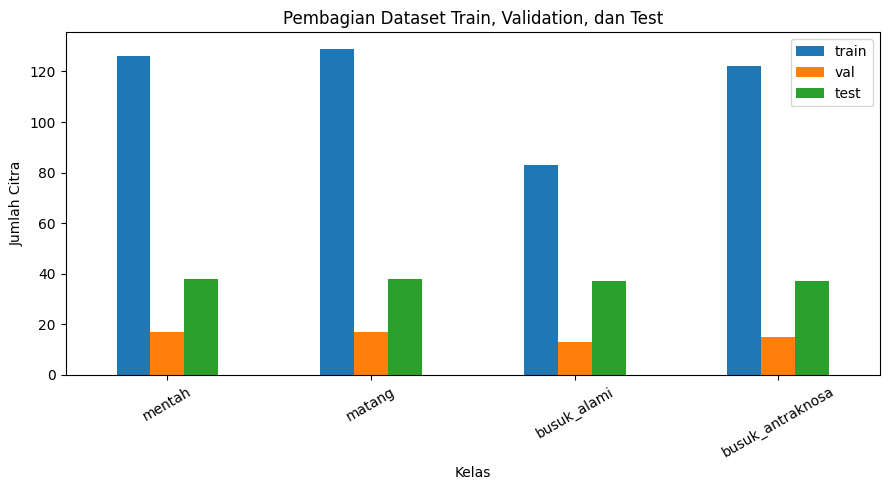

Visualisasi pembagian dataset disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/split_distribution_bar.png


In [ ]:
# ============================================================
# CELL 9 - VISUALISASI PEMBAGIAN DATASET
# Untuk Bab 4.5 Hasil Pembagian Data Training, Validation, Testing
# ============================================================

split_distribution = pd.read_csv(REPORT_DIR / "split_distribution.csv", index_col=0)

display(split_distribution)

plot_df = split_distribution[["train", "val", "test"]]

ax = plot_df.plot(kind="bar", figsize=(9, 5))
plt.xlabel("Kelas")
plt.ylabel("Jumlah Citra")
plt.title("Pembagian Dataset Train, Validation, dan Test")
plt.xticks(rotation=30)
plt.tight_layout()

out_path = REPORT_DIR / "split_distribution_bar.png"
plt.savefig(out_path, dpi=160, bbox_inches="tight")
plt.show()

print("Visualisasi pembagian dataset disimpan ke:", out_path)

---

# CELL 10 — Load dataset menggunakan tf.data

In [ ]:
# ============================================================
# CELL 10 - LOAD DATASET DAN PIPELINE RESIZE KONSISTEN
# Semua pembacaan citra memakai bilinear resize.
# ============================================================

def load_image_consistent(
    image_path: Path,
    add_batch_dimension: bool = False
) -> tf.Tensor:
    """
    Pipeline pembacaan citra tunggal yang dibuat konsisten dengan
    image_dataset_from_directory(interpolation='bilinear').

    Output masih berada pada rentang 0-255 karena normalisasi
    sudah berada di dalam model.
    """
    image_bytes = tf.io.read_file(str(image_path))

    image = tf.io.decode_image(
        image_bytes,
        channels=3,
        expand_animations=False
    )

    image.set_shape([None, None, 3])

    image = tf.image.resize(
        image,
        IMG_SIZE,
        method=tf.image.ResizeMethod.BILINEAR,
        antialias=False
    )

    image = tf.cast(image, tf.float32)

    if add_batch_dimension:
        image = tf.expand_dims(image, axis=0)

    return image


train_ds_base = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels="inferred",
    label_mode="categorical",
    class_names=CLASS_NAMES,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
    interpolation="bilinear"
)

val_ds_base = tf.keras.utils.image_dataset_from_directory(
    VAL_DIR,
    labels="inferred",
    label_mode="categorical",
    class_names=CLASS_NAMES,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    interpolation="bilinear"
)

test_ds_base = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    labels="inferred",
    label_mode="categorical",
    class_names=CLASS_NAMES,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    interpolation="bilinear"
)

# Simpan urutan file sebelum dataset di-prefetch.
train_file_paths = [
    str(Path(path))
    for path in train_ds_base.file_paths
]

val_file_paths = [
    str(Path(path))
    for path in val_ds_base.file_paths
]

test_file_paths = [
    str(Path(path))
    for path in test_ds_base.file_paths
]

AUTOTUNE = tf.data.AUTOTUNE

dataset_options = tf.data.Options()
dataset_options.experimental_deterministic = True

train_ds = (
    train_ds_base
    .with_options(dataset_options)
    .prefetch(AUTOTUNE)
)

val_ds = (
    val_ds_base
    .with_options(dataset_options)
    .prefetch(AUTOTUNE)
)

test_ds = (
    test_ds_base
    .with_options(dataset_options)
    .prefetch(AUTOTUNE)
)


# ------------------------------------------------------------
# Validasi jumlah file terhadap folder fisik hasil split.
#
# Tidak lagi membandingkan ke angka target lama (462/62/150),
# karena CELL 8 memakai group-aware split yang memprioritaskan
# integritas grup (mencegah data leakage) di atas kecocokan
# angka target persis. Validasi di sini memastikan
# image_dataset_from_directory membaca SELURUH file yang
# benar-benar ada di folder, tanpa ada yang terlewat/ganda.
# ------------------------------------------------------------

def count_keras_files(directory: Path) -> int:
    keras_supported_extensions = {
        ".jpg",
        ".jpeg",
        ".png",
        ".bmp",
        ".gif",
    }

    return sum(
        1
        for file_path in directory.rglob("*")
        if (
            file_path.is_file()
            and file_path.suffix.lower()
            in keras_supported_extensions
        )
    )


expected_train_count = count_keras_files(TRAIN_DIR)
expected_val_count = count_keras_files(VAL_DIR)
expected_test_count = count_keras_files(TEST_DIR)

assert len(train_file_paths) == expected_train_count, (
    f"Train: {len(train_file_paths)} file terbaca, "
    f"{expected_train_count} file ada di folder."
)
assert len(val_file_paths) == expected_val_count, (
    f"Val: {len(val_file_paths)} file terbaca, "
    f"{expected_val_count} file ada di folder."
)
assert len(test_file_paths) == expected_test_count, (
    f"Test: {len(test_file_paths)} file terbaca, "
    f"{expected_test_count} file ada di folder."
)

print("Dataset siap digunakan.")
print("Class names :", CLASS_NAMES)
print("Train       :", len(train_file_paths))
print("Validation  :", len(val_file_paths))
print("Test        :", len(test_file_paths))
print("Total       :", (
    len(train_file_paths)
    + len(val_file_paths)
    + len(test_file_paths)
))

Found 460 files belonging to 4 classes.
Found 62 files belonging to 4 classes.
Found 150 files belonging to 4 classes.
Dataset siap digunakan.
Class names : ['mentah', 'matang', 'busuk_alami', 'busuk_antraknosa']
Train       : 460
Validation  : 62
Test        : 150
Total       : 672


---

# CELL 11 — Augmentasi dan preview preprocessing

Output:

```text
preprocessing_preview.png
```

Tabel 4.x Tahapan Preprocessing dan Augmentasi Citra Cabai


,Tahapan,Parameter,Tujuan,Output
0,Input citra RGB,"Format JPG/JPEG/PNG, 3 channel warna",Membaca citra cabai sebagai data masukan awal ...,Citra RGB dari dataset cabai.
1,Resize citra,224 × 224 piksel,Menyamakan ukuran seluruh citra agar sesuai de...,Citra berukuran 224 × 224 × 3.
2,Konversi citra ke tensor,tf.data image dataset,Mengubah citra menjadi data numerik agar dapat...,Tensor citra dengan bentuk batch × height × wi...
3,Normalisasi MobileNetV2,preprocess_input MobileNetV2,Menyesuaikan nilai piksel citra dengan format ...,Tensor citra ternormalisasi yang siap masuk ke...
4,Augmentasi flip horizontal,RandomFlip('horizontal'),Menambah variasi arah objek cabai agar model t...,Citra hasil pencerminan horizontal secara acak.
5,Augmentasi rotasi,RandomRotation(0.08),Menambah variasi sudut pengambilan citra agar ...,Citra hasil rotasi acak.
6,Augmentasi zoom,RandomZoom(0.10),Menambah variasi skala objek cabai agar model ...,Citra hasil pembesaran atau pengecilan acak.
7,Augmentasi kontras,RandomContrast(0.10),Menambah variasi pencahayaan agar model lebih ...,Citra dengan variasi kontras secara acak.


Tabel preprocessing disimpan ke:
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/tabel_preprocessing_augmentasi_bab4.csv
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/tabel_preprocessing_augmentasi_bab4.xlsx


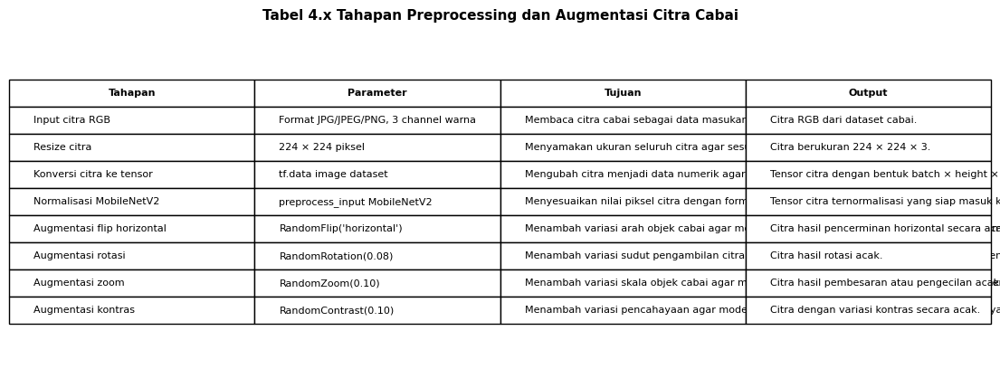

Gambar tabel preprocessing disimpan ke:
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/tabel_preprocessing_augmentasi_bab4.png
Layer augmentasi siap digunakan:


Model: "augmentasi_citra"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_flip (RandomFlip)        │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation                 │ ?                      │   0 (unbuilt) │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom (RandomZoom)        │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast                 │ ?                      │   0 (unbuilt) │
│ (RandomContrast)                │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

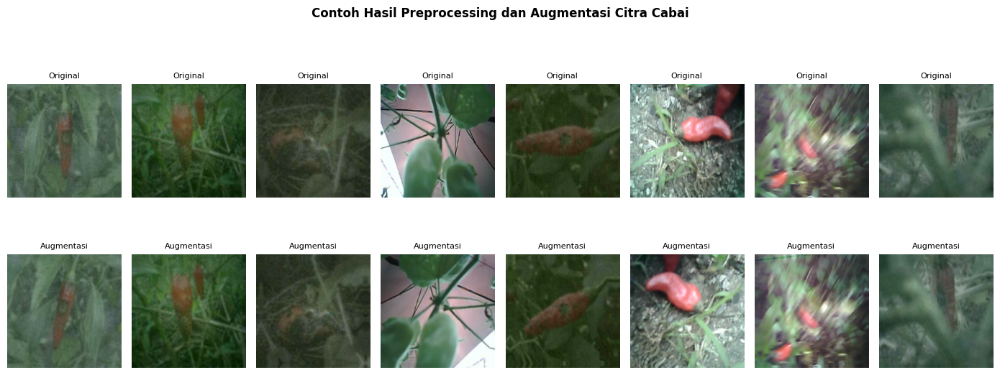

Preview preprocessing disimpan ke:
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/preprocessing_preview.png
Ringkasan nilai piksel sebelum dan sesudah normalisasi:


,Kondisi,Nilai minimum,Nilai maksimum,Rata-rata nilai piksel
0,Sebelum normalisasi,40.035652,152.892792,89.270264
1,Sesudah normalisasi MobileNetV2,-0.685995,0.199159,-0.299841


Ringkasan normalisasi disimpan ke:
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/pixel_normalization_summary_bab4.csv
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/pixel_normalization_summary_bab4.xlsx


In [ ]:
# ============================================================
# CELL 11 - TABEL PREPROCESSING, AUGMENTASI, DAN PREVIEW CITRA
# Untuk Bab 4.5.1 Hasil Resize, Normalisasi, dan Augmentasi Citra
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras import layers
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from IPython.display import display

# ============================================================
# BAGIAN A - TABEL TAHAPAN PREPROCESSING DAN AUGMENTASI
# ============================================================

tabel_preprocessing = pd.DataFrame([
    {
        "Tahapan": "Input citra RGB",
        "Parameter": "Format JPG/JPEG/PNG, 3 channel warna",
        "Tujuan": "Membaca citra cabai sebagai data masukan awal sebelum diproses oleh model.",
        "Output": "Citra RGB dari dataset cabai."
    },
    {
        "Tahapan": "Resize citra",
        "Parameter": f"{IMG_SIZE[0]} × {IMG_SIZE[1]} piksel",
        "Tujuan": "Menyamakan ukuran seluruh citra agar sesuai dengan ukuran input model MobileNetV2.",
        "Output": f"Citra berukuran {IMG_SIZE[0]} × {IMG_SIZE[1]} × 3."
    },
    {
        "Tahapan": "Konversi citra ke tensor",
        "Parameter": "tf.data image dataset",
        "Tujuan": "Mengubah citra menjadi data numerik agar dapat diproses oleh TensorFlow.",
        "Output": "Tensor citra dengan bentuk batch × height × width × channel."
    },
    {
        "Tahapan": "Normalisasi MobileNetV2",
        "Parameter": "preprocess_input MobileNetV2",
        "Tujuan": "Menyesuaikan nilai piksel citra dengan format masukan yang dibutuhkan MobileNetV2.",
        "Output": "Tensor citra ternormalisasi yang siap masuk ke model."
    },
    {
        "Tahapan": "Augmentasi flip horizontal",
        "Parameter": "RandomFlip('horizontal')",
        "Tujuan": "Menambah variasi arah objek cabai agar model tidak hanya bergantung pada satu posisi gambar.",
        "Output": "Citra hasil pencerminan horizontal secara acak."
    },
    {
        "Tahapan": "Augmentasi rotasi",
        "Parameter": "RandomRotation(0.08)",
        "Tujuan": "Menambah variasi sudut pengambilan citra agar model lebih tahan terhadap perubahan orientasi objek.",
        "Output": "Citra hasil rotasi acak."
    },
    {
        "Tahapan": "Augmentasi zoom",
        "Parameter": "RandomZoom(0.10)",
        "Tujuan": "Menambah variasi skala objek cabai agar model lebih adaptif terhadap jarak kamera yang berbeda.",
        "Output": "Citra hasil pembesaran atau pengecilan acak."
    },
    {
        "Tahapan": "Augmentasi kontras",
        "Parameter": "RandomContrast(0.10)",
        "Tujuan": "Menambah variasi pencahayaan agar model lebih adaptif terhadap perbedaan kondisi cahaya pada citra ESP32-CAM.",
        "Output": "Citra dengan variasi kontras secara acak."
    }
])

print("Tabel 4.x Tahapan Preprocessing dan Augmentasi Citra Cabai")
display(tabel_preprocessing)

# Simpan tabel ke CSV dan Excel agar mudah ditempel ke Word
tabel_csv_path = REPORT_DIR / "tabel_preprocessing_augmentasi_bab4.csv"
tabel_excel_path = REPORT_DIR / "tabel_preprocessing_augmentasi_bab4.xlsx"

tabel_preprocessing.to_csv(tabel_csv_path, index=False)
tabel_preprocessing.to_excel(tabel_excel_path, index=False)

print("Tabel preprocessing disimpan ke:")
print(tabel_csv_path)
print(tabel_excel_path)


# ============================================================
# BAGIAN B - SIMPAN TABEL DALAM BENTUK GAMBAR PNG
# Opsional, agar tabel bisa langsung dimasukkan ke dokumen Bab 4
# ============================================================

fig, ax = plt.subplots(figsize=(14, 4.8))
ax.axis("off")

table = ax.table(
    cellText=tabel_preprocessing.values,
    colLabels=tabel_preprocessing.columns,
    cellLoc="left",
    colLoc="center",
    loc="center"
)

table.auto_set_font_size(False)
table.set_fontsize(8)
table.scale(1, 1.8)

# Rapikan header tabel
for (row, col), cell in table.get_celld().items():
    if row == 0:
        cell.set_text_props(weight="bold", ha="center")
    else:
        cell.set_text_props(ha="left", va="center")

plt.title(
    "Tabel 4.x Tahapan Preprocessing dan Augmentasi Citra Cabai",
    fontsize=11,
    fontweight="bold",
    pad=12
)

tabel_png_path = REPORT_DIR / "tabel_preprocessing_augmentasi_bab4.png"
plt.savefig(tabel_png_path, dpi=200, bbox_inches="tight")
plt.show()

print("Gambar tabel preprocessing disimpan ke:")
print(tabel_png_path)


# ============================================================
# BAGIAN C - AUGMENTASI CITRA
# ============================================================

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal", seed=SEED),
    layers.RandomRotation(0.08, seed=SEED),
    layers.RandomZoom(0.10, seed=SEED),
    layers.RandomContrast(0.10, seed=SEED),
], name="augmentasi_citra")

print("Layer augmentasi siap digunakan:")
data_augmentation.summary()


# ============================================================
# BAGIAN D - PREVIEW ORIGINAL VS AUGMENTASI
# ============================================================

image_batch, label_batch = next(iter(train_ds))

max_show = min(8, len(image_batch))

plt.figure(figsize=(14, 6))

for i in range(max_show):
    original = image_batch[i]

    # Terapkan augmentasi hanya untuk preview
    augmented = data_augmentation(
        tf.expand_dims(original, axis=0),
        training=True
    )[0]

    # Baris 1: citra original
    plt.subplot(2, max_show, i + 1)
    plt.imshow(original.numpy().astype("uint8"))
    plt.title("Original", fontsize=8)
    plt.axis("off")

    # Baris 2: citra hasil augmentasi
    plt.subplot(2, max_show, i + 1 + max_show)
    aug_np = tf.clip_by_value(augmented, 0, 255).numpy().astype("uint8")
    plt.imshow(aug_np)
    plt.title("Augmentasi", fontsize=8)
    plt.axis("off")

plt.suptitle(
    "Contoh Hasil Preprocessing dan Augmentasi Citra Cabai",
    fontsize=12,
    fontweight="bold"
)

plt.tight_layout()

preview_path = REPORT_DIR / "preprocessing_preview.png"
plt.savefig(preview_path, dpi=160, bbox_inches="tight")
plt.show()

print("Preview preprocessing disimpan ke:")
print(preview_path)


# ============================================================
# BAGIAN E - CEK NILAI PIXEL SEBELUM DAN SESUDAH NORMALISASI
# Untuk memperkuat pembahasan Bab 4.5.1
# ============================================================

sample_original = image_batch[0]
sample_preprocessed = preprocess_input(tf.identity(sample_original))

pixel_summary = pd.DataFrame([
    {
        "Kondisi": "Sebelum normalisasi",
        "Nilai minimum": float(tf.reduce_min(sample_original).numpy()),
        "Nilai maksimum": float(tf.reduce_max(sample_original).numpy()),
        "Rata-rata nilai piksel": float(tf.reduce_mean(sample_original).numpy())
    },
    {
        "Kondisi": "Sesudah normalisasi MobileNetV2",
        "Nilai minimum": float(tf.reduce_min(sample_preprocessed).numpy()),
        "Nilai maksimum": float(tf.reduce_max(sample_preprocessed).numpy()),
        "Rata-rata nilai piksel": float(tf.reduce_mean(sample_preprocessed).numpy())
    }
])

print("Ringkasan nilai piksel sebelum dan sesudah normalisasi:")
display(pixel_summary)

pixel_summary_csv = REPORT_DIR / "pixel_normalization_summary_bab4.csv"
pixel_summary_excel = REPORT_DIR / "pixel_normalization_summary_bab4.xlsx"

pixel_summary.to_csv(pixel_summary_csv, index=False)
pixel_summary.to_excel(pixel_summary_excel, index=False)

print("Ringkasan normalisasi disimpan ke:")
print(pixel_summary_csv)
print(pixel_summary_excel)

---

# CELL 12 — Membangun model MobileNetV2

Output:

```text
model_summary.txt
```

In [ ]:
# ============================================================
# CELL 12 - MEMBANGUN MODEL MOBILENETV2
# Untuk Bab 4.6.1 Implementasi Arsitektur MobileNet
# ============================================================

import pandas as pd
import io
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam

NUM_CLASSES = len(CLASS_NAMES)

base_model = MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights="imagenet"
)

base_model.trainable = False

inputs = layers.Input(shape=IMG_SIZE + (3,), name="input_citra_224x224x3")

x = data_augmentation(inputs)
x = layers.Lambda(preprocess_input, name="mobilenetv2_preprocess")(x)

x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
x = layers.Dense(DENSE_UNITS, activation="relu", name="dense_128")(x)
x = layers.Dropout(DROPOUT_RATE, name="dropout_0_5")(x)

outputs = layers.Dense(NUM_CLASSES, activation="softmax", name="output_softmax")(x)

model = Model(inputs, outputs, name="MobileNetV2_Kualitas_Cabai")

model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Menampilkan summary model
model.summary()

# ============================================================
# MENYIMPAN MODEL SUMMARY KE TXT
# ============================================================

summary_path = REPORT_DIR / "model_summary.txt"

with open(summary_path, "w", encoding="utf-8") as f:
    model.summary(print_fn=lambda line: f.write(line + "\n"))

print("Model summary disimpan ke:", summary_path)


# ============================================================
# MENYIMPAN ARSITEKTUR MODEL KE XLSX
# ============================================================

xlsx_path = REPORT_DIR / "model_architecture.xlsx"


def get_output_shape(layer):
    """
    Mengambil output shape layer secara aman.
    """
    try:
        return str(layer.output.shape)
    except Exception:
        try:
            return str(layer.output_shape)
        except Exception:
            return "-"


def get_activation(layer):
    """
    Mengambil nama fungsi aktivasi jika tersedia.
    """
    try:
        return layer.activation.__name__
    except Exception:
        return "-"


def count_layer_params(layer):
    """
    Mengambil jumlah parameter layer secara aman.
    """
    try:
        return layer.count_params()
    except Exception:
        return 0


# ------------------------------------------------------------
# 1. Sheet Summary_Text
# ------------------------------------------------------------

summary_stream = io.StringIO()
model.summary(print_fn=lambda line: summary_stream.write(line + "\n"))

summary_lines = summary_stream.getvalue().split("\n")

df_summary_text = pd.DataFrame({
    "Model Summary": summary_lines
})


# ------------------------------------------------------------
# 2. Sheet Arsitektur_Layer Utama
# ------------------------------------------------------------

main_layers_data = []

for i, layer in enumerate(model.layers, start=1):
    main_layers_data.append({
        "No": i,
        "Layer Name": layer.name,
        "Layer Type": layer.__class__.__name__,
        "Output Shape": get_output_shape(layer),
        "Jumlah Parameter": count_layer_params(layer),
        "Trainable": layer.trainable,
        "Activation": get_activation(layer)
    })

df_main_layers = pd.DataFrame(main_layers_data)


# ------------------------------------------------------------
# 3. Sheet Detail MobileNetV2
# ------------------------------------------------------------

mobilenet_layers_data = []

for i, layer in enumerate(base_model.layers, start=1):
    mobilenet_layers_data.append({
        "No": i,
        "Layer Name": layer.name,
        "Layer Type": layer.__class__.__name__,
        "Output Shape": get_output_shape(layer),
        "Jumlah Parameter": count_layer_params(layer),
        "Trainable": layer.trainable,
        "Activation": get_activation(layer)
    })

df_mobilenet_layers = pd.DataFrame(mobilenet_layers_data)


# ------------------------------------------------------------
# 4. Sheet Konfigurasi_Model
# ------------------------------------------------------------

df_config = pd.DataFrame({
    "Komponen": [
        "Nama Model",
        "Arsitektur Dasar",
        "Input Size",
        "Jumlah Kelas",
        "Class Names",
        "Pretrained Weights",
        "Include Top",
        "Base Model Trainable",
        "Dense Units",
        "Dropout Rate",
        "Optimizer",
        "Learning Rate",
        "Loss Function",
        "Metrics"
    ],
    "Nilai": [
        model.name,
        "MobileNetV2",
        str(IMG_SIZE + (3,)),
        NUM_CLASSES,
        ", ".join(CLASS_NAMES),
        "ImageNet",
        "False",
        str(base_model.trainable),
        DENSE_UNITS,
        DROPOUT_RATE,
        "Adam",
        LEARNING_RATE,
        "Categorical Crossentropy",
        "Accuracy"
    ]
})


# ------------------------------------------------------------
# 5. Simpan Semua Sheet ke Excel
# ------------------------------------------------------------

with pd.ExcelWriter(xlsx_path, engine="openpyxl") as writer:
    df_summary_text.to_excel(writer, sheet_name="Summary_Text", index=False)
    df_main_layers.to_excel(writer, sheet_name="Arsitektur_Model", index=False)
    df_mobilenet_layers.to_excel(writer, sheet_name="Detail_MobileNetV2", index=False)
    df_config.to_excel(writer, sheet_name="Konfigurasi_Model", index=False)

print("Arsitektur model Excel disimpan ke:", xlsx_path)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "MobileNetV2_Kualitas_Cabai"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_citra_224x224x3           │ (None, 224, 224, 3)    │             0 │
│ (InputLayer)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ augmentasi_citra (Sequential)   │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_preprocess (Lambda) │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling          │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_0_5 (Dropout)           │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_softmax (Dense)          │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,468 (9.24 MB)

 Trainable params: 164,484 (642.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Model summary disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/model_summary.txt


Arsitektur model Excel disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/model_architecture.xlsx


---

# CELL 13 — Diagram arsitektur model

Output:

```text
mobilenetv2_architecture.png
```

In [ ]:
# ============================================================
# CELL 13 - DIAGRAM ARSITEKTUR MODEL
# Untuk Bab 4.6.1
# ============================================================

plot_path = REPORT_DIR / "mobilenetv2_architecture.png"

try:
    tf.keras.utils.plot_model(
        model,
        to_file=str(plot_path),
        show_shapes=True,
        show_layer_names=True,
        expand_nested=False,
        dpi=120
    )
    print("Diagram model disimpan ke:", plot_path)
except Exception as e:
    print("Diagram model gagal dibuat:", e)
    print("Gunakan model_summary.txt sebagai bukti arsitektur model.")

Diagram model disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/mobilenetv2_architecture.png


---

# CELL 14 — Training model MobileNetV2

Output:

```text
best_mobilenetv2_cabai.keras
last_mobilenetv2_cabai.keras
training_history.csv
```

In [ ]:
# ============================================================
# CELL 14A - CALLBACK LEARNING TIME DAN MEMORY PER EPOCH
# Untuk mencatat waktu training dan penggunaan memory setiap epoch
# ============================================================

import time
import psutil
import numpy as np
import pandas as pd
import tensorflow as tf

class EpochTimeMemoryLogger(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.logs_per_epoch = []
        self.epoch_start_time = None

    def get_gpu_memory_mb(self):
        """
        Mengambil informasi penggunaan GPU jika tersedia.
        Jika runtime tidak memakai GPU, nilainya akan NaN.
        """
        try:
            gpu_info = tf.config.experimental.get_memory_info("GPU:0")
            return {
                "gpu_memory_current_mb": round(gpu_info["current"] / (1024 ** 2), 2),
                "gpu_memory_peak_mb": round(gpu_info["peak"] / (1024 ** 2), 2)
            }
        except Exception:
            return {
                "gpu_memory_current_mb": np.nan,
                "gpu_memory_peak_mb": np.nan
            }

    def on_epoch_begin(self, epoch, logs=None):
        self.epoch_start_time = time.time()

    def on_epoch_end(self, epoch, logs=None):
        epoch_end_time = time.time()
        duration_seconds = epoch_end_time - self.epoch_start_time

        ram = psutil.virtual_memory()
        gpu_memory = self.get_gpu_memory_mb()

        self.logs_per_epoch.append({
            "epoch": epoch + 1,
            "learning_time_seconds": round(duration_seconds, 4),
            "learning_time_minutes": round(duration_seconds / 60, 4),
            "ram_total_mb": round(ram.total / (1024 ** 2), 2),
            "ram_used_mb": round(ram.used / (1024 ** 2), 2),
            "ram_available_mb": round(ram.available / (1024 ** 2), 2),
            "ram_percent_used": ram.percent,
            "gpu_memory_current_mb": gpu_memory["gpu_memory_current_mb"],
            "gpu_memory_peak_mb": gpu_memory["gpu_memory_peak_mb"]
        })

epoch_resource_logger = EpochTimeMemoryLogger()

print("Callback pencatat learning time dan memory siap digunakan.")

Callback pencatat learning time dan memory siap digunakan.


In [ ]:
# ============================================================
# CELL 14B - TRAINING MODEL MOBILENETV2 VERSI AMAN
# Untuk Bab 4.6.3 Hasil Pelatihan Model
# ============================================================

best_model_path = MODEL_DIR / "best_mobilenetv2_cabai.keras"
last_model_path = MODEL_DIR / "last_mobilenetv2_cabai.keras"

# Pastikan callback logger sudah ada
if "epoch_resource_logger" not in globals():
    epoch_resource_logger = EpochTimeMemoryLogger()

callbacks = [
    ModelCheckpoint(
        filepath=str(best_model_path),
        monitor="val_loss",
        save_best_only=True,
        mode="min",
        verbose=1
    ),
    EarlyStopping(
        monitor="val_loss",
        patience=8,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.2,
        patience=4,
        min_lr=1e-7,
        verbose=1
    ),
    epoch_resource_logger
]

# Compile ulang model sebelum training
# Gunakan mode graph untuk training normal. Ubah ke True hanya jika runtime Colab mengalami error khusus.
RUN_EAGERLY = False

model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE),
    loss="categorical_crossentropy",
    metrics=["accuracy"],
    run_eagerly=False
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks
)

model.save(last_model_path)

history_df = pd.DataFrame(history.history)
history_df["epoch"] = np.arange(1, len(history_df) + 1)

if "lr" in history_df.columns and "learning_rate" not in history_df.columns:
    history_df = history_df.rename(columns={"lr": "learning_rate"})

preferred_cols = [
    "epoch",
    "accuracy",
    "loss",
    "val_accuracy",
    "val_loss",
    "learning_rate"
]

available_cols = [col for col in preferred_cols if col in history_df.columns]
other_cols = [col for col in history_df.columns if col not in available_cols]
history_df = history_df[available_cols + other_cols]

history_df.to_csv(REPORT_DIR / "training_history.csv", index=False)

print("Best model:", best_model_path)
print("Last model:", last_model_path)
print("Training history CSV:", REPORT_DIR / "training_history.csv")

display(history_df.tail())

Epoch 1/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2975 - loss: 1.8012
Epoch 1: val_loss improved from None to 0.83601, saving model to /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/models/best_mobilenetv2_cabai.keras

Epoch 1: finished saving model to /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/models/best_mobilenetv2_cabai.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 45s 3s/step - accuracy: 0.3522 - loss: 1.6083 - val_accuracy: 0.7419 - val_loss: 0.8360 - learning_rate: 1.0000e-04
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5921 - loss: 1.0139
Epoch 2: val_loss improved from 0.83601 to 0.51127, saving model to /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/models/best_mobilenetv2_cabai.keras

Epoch 2: finished saving model to /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/models/best_mobilenetv2_cabai.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.6217 - loss: 0.9361 - val_accuracy: 0.9032 - val_lo

,epoch,accuracy,loss,val_accuracy,val_loss,learning_rate
45,46,0.991304,0.044992,0.983871,0.050134,0.00010
46,47,0.995652,0.039024,0.983871,0.047085,0.00010
47,48,0.995652,0.039892,0.983871,0.044486,0.00010
48,49,0.982609,0.052114,1.000000,0.042796,0.00002
49,50,0.980435,0.052030,1.000000,0.042619,0.00002


In [ ]:
# ============================================================
# CELL 14C - EXPORT RIWAYAT EPOCH, LEARNING TIME, DAN MEMORY KE XLSX
# Untuk Bab 4.6.3 Hasil Pelatihan Model
# File berisi 2 sheet:
# 1. Riwayat Epoch
# 2. Learning Time Memory
# ============================================================

from openpyxl.styles import Font, Alignment, PatternFill, Border, Side
from openpyxl.utils import get_column_letter

# ============================================================
# SHEET 1 - RIWAYAT EPOCH
# Berisi accuracy, loss, val_accuracy, val_loss, learning_rate
# ============================================================

if "history_df" not in globals():
    history_df = pd.read_csv(REPORT_DIR / "training_history.csv")

history_epoch_df = history_df.copy()

if "lr" in history_epoch_df.columns and "learning_rate" not in history_epoch_df.columns:
    history_epoch_df = history_epoch_df.rename(columns={"lr": "learning_rate"})

preferred_cols = [
    "epoch",
    "accuracy",
    "loss",
    "val_accuracy",
    "val_loss",
    "learning_rate"
]

available_cols = [col for col in preferred_cols if col in history_epoch_df.columns]
other_cols = [col for col in history_epoch_df.columns if col not in available_cols]

history_epoch_df = history_epoch_df[available_cols + other_cols]

# Bulatkan angka agar rapi di Excel
for col in history_epoch_df.columns:
    if col != "epoch":
        history_epoch_df[col] = pd.to_numeric(history_epoch_df[col], errors="coerce")
        history_epoch_df[col] = history_epoch_df[col].round(6)


# ============================================================
# SHEET 2 - LEARNING TIME DAN MEMORY USE
# Berisi waktu learning dan penggunaan RAM/GPU per epoch
# ============================================================

if "epoch_resource_logger" in globals() and len(epoch_resource_logger.logs_per_epoch) > 0:
    resource_df = pd.DataFrame(epoch_resource_logger.logs_per_epoch)
else:
    print("PERINGATAN: Data learning time dan memory belum tersedia.")
    print("Kemungkinan Cell 14B belum dijalankan ulang setelah callback ditambahkan.")
    resource_df = pd.DataFrame({
        "epoch": history_epoch_df["epoch"],
        "learning_time_seconds": np.nan,
        "learning_time_minutes": np.nan,
        "ram_total_mb": np.nan,
        "ram_used_mb": np.nan,
        "ram_available_mb": np.nan,
        "ram_percent_used": np.nan,
        "gpu_memory_current_mb": np.nan,
        "gpu_memory_peak_mb": np.nan
    })

# Tambahkan ringkasan kecil dalam bentuk kolom tambahan
total_learning_time = resource_df["learning_time_seconds"].sum(skipna=True)
avg_learning_time = resource_df["learning_time_seconds"].mean(skipna=True)

print("Total learning time:", round(total_learning_time, 4), "detik")
print("Rata-rata learning time per epoch:", round(avg_learning_time, 4), "detik")


# ============================================================
# SIMPAN KE 1 FILE XLSX DENGAN 2 SHEET
# ============================================================

training_log_xlsx_path = REPORT_DIR / "training_epoch_time_memory_log.xlsx"

with pd.ExcelWriter(training_log_xlsx_path, engine="openpyxl") as writer:
    history_epoch_df.to_excel(
        writer,
        sheet_name="Riwayat Epoch",
        index=False
    )

    resource_df.to_excel(
        writer,
        sheet_name="Learning Time Memory",
        index=False
    )

    header_fill = PatternFill(
        start_color="D9EAF7",
        end_color="D9EAF7",
        fill_type="solid"
    )

    thin_border = Border(
        left=Side(style="thin"),
        right=Side(style="thin"),
        top=Side(style="thin"),
        bottom=Side(style="thin")
    )

    for sheet_name in writer.sheets:
        ws = writer.sheets[sheet_name]

        # Freeze header
        ws.freeze_panes = "A2"

        # Style header
        for cell in ws[1]:
            cell.font = Font(bold=True)
            cell.alignment = Alignment(
                horizontal="center",
                vertical="center",
                wrap_text=True
            )
            cell.fill = header_fill
            cell.border = thin_border

        # Style seluruh isi tabel
        for row in ws.iter_rows():
            for cell in row:
                cell.border = thin_border
                cell.alignment = Alignment(
                    vertical="center",
                    wrap_text=True
                )

        # Auto width kolom
        for col_idx, column_cells in enumerate(ws.columns, start=1):
            max_length = 0
            col_letter = get_column_letter(col_idx)

            for cell in column_cells:
                if cell.value is not None:
                    max_length = max(max_length, len(str(cell.value)))

            ws.column_dimensions[col_letter].width = min(max_length + 4, 45)

print("File XLSX berhasil dibuat:")
print(training_log_xlsx_path)

print("\nSheet 1 - Riwayat Epoch:")
display(history_epoch_df.head())

print("\nSheet 2 - Learning Time Memory:")
display(resource_df.head())

Total learning time: 1926.0243 detik
Rata-rata learning time per epoch: 38.5205 detik
File XLSX berhasil dibuat:
/content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/training_epoch_time_memory_log.xlsx

Sheet 1 - Riwayat Epoch:


,epoch,accuracy,loss,val_accuracy,val_loss,learning_rate
0,1,0.352174,1.608310,0.741935,0.836009,0.0001
1,2,0.621739,0.936103,0.903226,0.511275,0.0001
2,3,0.676087,0.730469,0.887097,0.383023,0.0001
3,4,0.789130,0.556182,0.919355,0.306067,0.0001
4,5,0.852174,0.436405,0.919355,0.264618,0.0001



Sheet 2 - Learning Time Memory:


,epoch,learning_time_seconds,learning_time_minutes,ram_total_mb,ram_used_mb,ram_available_mb,ram_percent_used,gpu_memory_current_mb,gpu_memory_peak_mb
0,1,45.0905,0.7515,12975.53,2043.01,10640.61,18.0,NaN,NaN
1,2,35.9243,0.5987,12975.53,2256.89,10426.38,19.6,NaN,NaN
2,3,40.1638,0.6694,12975.53,2309.32,10373.80,20.1,NaN,NaN
3,4,44.9769,0.7496,12975.53,2345.68,10337.43,20.3,NaN,NaN
4,5,33.0037,0.5501,12975.53,2274.60,10408.33,19.8,NaN,NaN


---

# CELL 15 — Grafik training accuracy dan loss

Output:

```text
training_curve.png
best_epoch_summary.csv
```

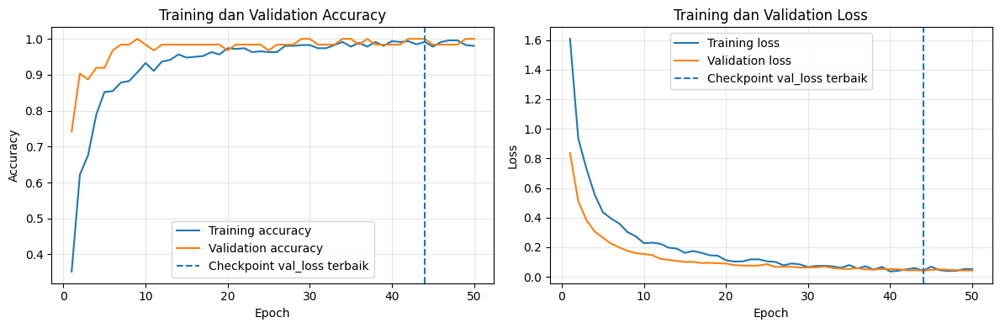

Grafik training disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/training_curve.png


,kriteria_checkpoint,epoch_checkpoint,training_accuracy_checkpoint,validation_accuracy_checkpoint,training_loss_checkpoint,validation_loss_checkpoint,epoch_validation_accuracy_tertinggi,validation_accuracy_tertinggi
0,minimum validation loss,44,0.991304,1.0,0.041057,0.041366,9,1.0


In [ ]:
# ============================================================
# CELL 15 - GRAFIK TRAINING DAN EPOCH TERBAIK BERDASARKAN VAL_LOSS
# ============================================================

history_df = pd.read_csv(
    REPORT_DIR / "training_history.csv"
)

best_val_loss_index = history_df["val_loss"].idxmin()
best_val_accuracy_index = history_df["val_accuracy"].idxmax()

best_val_loss_row = history_df.loc[
    best_val_loss_index
].copy()

best_val_accuracy_row = history_df.loc[
    best_val_accuracy_index
].copy()

fig, axes = plt.subplots(
    1,
    2,
    figsize=(12, 4)
)

axes[0].plot(
    history_df["epoch"],
    history_df["accuracy"],
    label="Training accuracy"
)
axes[0].plot(
    history_df["epoch"],
    history_df["val_accuracy"],
    label="Validation accuracy"
)
axes[0].axvline(
    best_val_loss_row["epoch"],
    linestyle="--",
    label="Checkpoint val_loss terbaik"
)
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Accuracy")
axes[0].set_title("Training dan Validation Accuracy")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(
    history_df["epoch"],
    history_df["loss"],
    label="Training loss"
)
axes[1].plot(
    history_df["epoch"],
    history_df["val_loss"],
    label="Validation loss"
)
axes[1].axvline(
    best_val_loss_row["epoch"],
    linestyle="--",
    label="Checkpoint val_loss terbaik"
)
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].set_title("Training dan Validation Loss")
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()

curve_path = REPORT_DIR / "training_curve.png"

plt.savefig(
    curve_path,
    dpi=180,
    bbox_inches="tight"
)
plt.show()

best_epoch_summary_df = pd.DataFrame([{
    "kriteria_checkpoint": "minimum validation loss",
    "epoch_checkpoint": int(
        best_val_loss_row["epoch"]
    ),
    "training_accuracy_checkpoint": float(
        best_val_loss_row["accuracy"]
    ),
    "validation_accuracy_checkpoint": float(
        best_val_loss_row["val_accuracy"]
    ),
    "training_loss_checkpoint": float(
        best_val_loss_row["loss"]
    ),
    "validation_loss_checkpoint": float(
        best_val_loss_row["val_loss"]
    ),
    "epoch_validation_accuracy_tertinggi": int(
        best_val_accuracy_row["epoch"]
    ),
    "validation_accuracy_tertinggi": float(
        best_val_accuracy_row["val_accuracy"]
    ),
}])

best_epoch_summary_df.to_csv(
    REPORT_DIR / "best_epoch_summary.csv",
    index=False
)

print("Grafik training disimpan ke:", curve_path)
display(best_epoch_summary_df)


---

# CELL 16 — Analisis otomatis overfitting dan underfitting

Output:

```text
overfitting_analysis.csv
overfitting_analysis.txt
```

In [ ]:
# ============================================================
# CELL 16 - ANALISIS GENERALISASI SECARA DESKRIPTIF
# Tidak memakai batas 10% yang arbitrer.
# ============================================================

history_df = pd.read_csv(
    REPORT_DIR / "training_history.csv"
)

best_index = history_df["val_loss"].idxmin()
best_row = history_df.loc[best_index]
final_row = history_df.iloc[-1]

best_epoch = int(best_row["epoch"])
final_epoch = int(final_row["epoch"])

accuracy_gap_best = float(
    best_row["accuracy"]
    - best_row["val_accuracy"]
)

loss_gap_best = float(
    best_row["val_loss"]
    - best_row["loss"]
)

epochs_after_best = max(
    0,
    final_epoch - best_epoch
)

training_loss_after_best_change = float(
    final_row["loss"]
    - best_row["loss"]
)

validation_loss_after_best_change = float(
    final_row["val_loss"]
    - best_row["val_loss"]
)

if (
    epochs_after_best > 0
    and training_loss_after_best_change < 0
    and validation_loss_after_best_change > 0
):
    interpretation = (
        "Setelah epoch dengan validation loss terendah, "
        "training loss masih menurun tetapi validation loss meningkat. "
        "Pola ini menunjukkan gejala overfitting setelah checkpoint terbaik. "
        "Model yang dipakai tetap checkpoint dengan validation loss terendah."
    )
elif best_epoch == final_epoch:
    interpretation = (
        "Validation loss terendah diperoleh pada epoch terakhir. "
        "Tidak terlihat fase setelah checkpoint terbaik pada riwayat ini. "
        "Generalisasi tetap dinilai bersama hasil test set."
    )
else:
    interpretation = (
        "Perubahan training dan validation setelah checkpoint terbaik "
        "tidak membentuk pola overfitting yang tegas. "
        "Kesimpulan generalisasi tidak ditentukan hanya dari satu gap, "
        "tetapi dibaca bersama kurva dan hasil test set."
    )

analysis_df = pd.DataFrame([{
    "epoch_checkpoint_val_loss": best_epoch,
    "training_accuracy_checkpoint": float(
        best_row["accuracy"]
    ),
    "validation_accuracy_checkpoint": float(
        best_row["val_accuracy"]
    ),
    "training_loss_checkpoint": float(
        best_row["loss"]
    ),
    "validation_loss_checkpoint": float(
        best_row["val_loss"]
    ),
    "accuracy_gap_checkpoint": accuracy_gap_best,
    "loss_gap_checkpoint": loss_gap_best,
    "final_epoch": final_epoch,
    "final_training_accuracy": float(
        final_row["accuracy"]
    ),
    "final_validation_accuracy": float(
        final_row["val_accuracy"]
    ),
    "final_training_loss": float(
        final_row["loss"]
    ),
    "final_validation_loss": float(
        final_row["val_loss"]
    ),
    "epochs_after_checkpoint": epochs_after_best,
    "training_loss_change_after_checkpoint": (
        training_loss_after_best_change
    ),
    "validation_loss_change_after_checkpoint": (
        validation_loss_after_best_change
    ),
    "interpretasi_deskriptif": interpretation,
}])

analysis_df.to_csv(
    REPORT_DIR / "overfitting_analysis.csv",
    index=False
)

with open(
    REPORT_DIR / "overfitting_analysis.txt",
    "w",
    encoding="utf-8"
) as file:
    file.write(interpretation)

display(analysis_df)
print(interpretation)


,epoch_checkpoint_val_loss,training_accuracy_checkpoint,validation_accuracy_checkpoint,training_loss_checkpoint,validation_loss_checkpoint,accuracy_gap_checkpoint,loss_gap_checkpoint,final_epoch,final_training_accuracy,final_validation_accuracy,final_training_loss,final_validation_loss,epochs_after_checkpoint,training_loss_change_after_checkpoint,validation_loss_change_after_checkpoint,interpretasi_deskriptif
0,44,0.991304,1.0,0.041057,0.041366,-0.008696,0.000309,50,0.980435,1.0,0.05203,0.042619,6,0.010973,0.001253,Perubahan training dan validation setelah chec...


Perubahan training dan validation setelah checkpoint terbaik tidak membentuk pola overfitting yang tegas. Kesimpulan generalisasi tidak ditentukan hanya dari satu gap, tetapi dibaca bersama kurva dan hasil test set.


---

# CELL 17 — Evaluasi model pada test set

Output:

```text
classification_report.csv
test_summary_metrics.csv
test_summary_metrics.json
```

In [ ]:
# ============================================================
# CELL 17 - EVALUASI TEST SET DENGAN PIPELINE KONSISTEN
# ============================================================

from sklearn.metrics import classification_report

NUM_CLASSES = len(CLASS_NAMES)


def save_json(data, path: Path) -> None:
    path.parent.mkdir(parents=True, exist_ok=True)

    with open(path, "w", encoding="utf-8") as file:
        json.dump(
            data,
            file,
            indent=2,
            ensure_ascii=False
        )


print("Membaca model terbaik:", best_model_path)

best_model = tf.keras.models.load_model(
    str(best_model_path),
    custom_objects={
        "preprocess_input": preprocess_input
    },
    safe_mode=False,
    compile=False
)

best_model.compile(
    optimizer=Adam(
        learning_rate=LEARNING_RATE
    ),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# ------------------------------------------------------------
# A. Evaluasi melalui test_ds
# ------------------------------------------------------------
dataset_test_loss, dataset_test_accuracy = (
    best_model.evaluate(
        test_ds,
        verbose=1
    )
)

# ------------------------------------------------------------
# B. Evaluasi per file menggunakan loader yang sama
# ------------------------------------------------------------
evaluation_rows = []

for image_path_text in test_file_paths:
    image_path = Path(image_path_text)
    actual_label = image_path.parent.name

    if actual_label not in CLASS_NAMES:
        raise ValueError(
            f"Nama folder kelas tidak dikenali: {actual_label}"
        )

    actual_index = CLASS_NAMES.index(
        actual_label
    )

    image_batch = load_image_consistent(
        image_path,
        add_batch_dimension=True
    )

    probabilities = best_model(
        image_batch,
        training=False
    ).numpy()[0]

    predicted_index = int(
        np.argmax(probabilities)
    )

    actual_probability = float(
        probabilities[actual_index]
    )

    row = {
        "image_path": str(image_path),
        "actual_index": actual_index,
        "actual_label": actual_label,
        "predicted_index": predicted_index,
        "predicted_label": CLASS_NAMES[
            predicted_index
        ],
        "confidence": float(
            probabilities[predicted_index]
        ),
        "actual_class_probability": actual_probability,
        "cross_entropy": float(
            -np.log(
                max(actual_probability, 1e-12)
            )
        ),
        "is_correct": (
            predicted_index == actual_index
        ),
    }

    for class_index, class_name in enumerate(
        CLASS_NAMES
    ):
        row[f"prob_{class_name}"] = float(
            probabilities[class_index]
        )

    evaluation_rows.append(row)

evaluation_predictions_df = pd.DataFrame(
    evaluation_rows
)

evaluation_predictions_df.to_csv(
    REPORT_DIR / "test_predictions_with_paths.csv",
    index=False
)

y_true = evaluation_predictions_df[
    "actual_index"
].to_numpy(dtype=int)

y_pred = evaluation_predictions_df[
    "predicted_index"
].to_numpy(dtype=int)

probability_columns = [
    f"prob_{class_name}"
    for class_name in CLASS_NAMES
]

y_prob = evaluation_predictions_df[
    probability_columns
].to_numpy(dtype=float)

per_file_accuracy = float(
    evaluation_predictions_df[
        "is_correct"
    ].mean()
)

per_file_loss = float(
    evaluation_predictions_df[
        "cross_entropy"
    ].mean()
)

accuracy_difference = abs(
    float(dataset_test_accuracy)
    - per_file_accuracy
)

loss_difference = abs(
    float(dataset_test_loss)
    - per_file_loss
)

evaluation_consistency_df = pd.DataFrame([{
    "dataset_test_accuracy": float(
        dataset_test_accuracy
    ),
    "per_file_accuracy": per_file_accuracy,
    "accuracy_absolute_difference": (
        accuracy_difference
    ),
    "dataset_test_loss": float(
        dataset_test_loss
    ),
    "per_file_loss": per_file_loss,
    "loss_absolute_difference": loss_difference,
    "jumlah_test": len(
        evaluation_predictions_df
    ),
    "status_accuracy": (
        "SESUAI"
        if accuracy_difference <= 1e-6
        else "TIDAK_SESUAI"
    ),
    "status_loss": (
        "SESUAI"
        if loss_difference <= 1e-5
        else "PERIKSA_PEMBULATAN"
    ),
}])

evaluation_consistency_df.to_csv(
    REPORT_DIR / "evaluation_consistency.csv",
    index=False
)

display(evaluation_consistency_df)

assert accuracy_difference <= 1e-6, (
    "Accuracy test_ds dan evaluasi per file berbeda. "
    "Periksa kembali pipeline resize serta urutan file."
)

assert loss_difference <= 1e-4, (
    "Loss test_ds dan evaluasi per file berbeda melebihi toleransi."
)

# ------------------------------------------------------------
# C. Classification report
# ------------------------------------------------------------
report_dict = classification_report(
    y_true,
    y_pred,
    labels=list(range(NUM_CLASSES)),
    target_names=CLASS_NAMES,
    output_dict=True,
    zero_division=0
)

report_df = pd.DataFrame(
    report_dict
).transpose()

report_df.to_csv(
    REPORT_DIR / "classification_report.csv"
)

# ------------------------------------------------------------
# D. Wilson confidence interval untuk accuracy
# ------------------------------------------------------------
def wilson_interval(
    correct_count: int,
    sample_count: int,
    z_value: float = 1.959963984540054
):
    proportion = correct_count / sample_count
    denominator = 1 + (z_value ** 2 / sample_count)

    center = (
        proportion
        + z_value ** 2 / (2 * sample_count)
    ) / denominator

    half_width = (
        z_value
        * np.sqrt(
            proportion * (1 - proportion) / sample_count
            + z_value ** 2 / (4 * sample_count ** 2)
        )
        / denominator
    )

    return center - half_width, center + half_width


correct_count = int(
    evaluation_predictions_df[
        "is_correct"
    ].sum()
)

accuracy_ci_low, accuracy_ci_high = (
    wilson_interval(
        correct_count,
        len(evaluation_predictions_df)
    )
)

summary_metrics = {
    "test_loss": per_file_loss,
    "test_accuracy": per_file_accuracy,
    "correct_predictions": correct_count,
    "test_samples": len(
        evaluation_predictions_df
    ),
    "accuracy_ci95_low": float(
        accuracy_ci_low
    ),
    "accuracy_ci95_high": float(
        accuracy_ci_high
    ),
    "macro_precision": float(
        report_dict["macro avg"]["precision"]
    ),
    "macro_recall": float(
        report_dict["macro avg"]["recall"]
    ),
    "macro_f1_score": float(
        report_dict["macro avg"]["f1-score"]
    ),
    "weighted_precision": float(
        report_dict["weighted avg"]["precision"]
    ),
    "weighted_recall": float(
        report_dict["weighted avg"]["recall"]
    ),
    "weighted_f1_score": float(
        report_dict["weighted avg"]["f1-score"]
    ),
}

summary_df = pd.DataFrame([
    summary_metrics
])

summary_df.to_csv(
    REPORT_DIR / "test_summary_metrics.csv",
    index=False
)

save_json(
    summary_metrics,
    REPORT_DIR / "test_summary_metrics.json"
)

display(report_df)
display(summary_df)

print(
    "Evaluasi test set konsisten. "
    "Gunakan angka dari test_summary_metrics.csv untuk Bab IV."
)


Membaca model terbaik: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/models/best_mobilenetv2_cabai.keras
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9800 - loss: 0.0793


,dataset_test_accuracy,per_file_accuracy,accuracy_absolute_difference,dataset_test_loss,per_file_loss,loss_absolute_difference,jumlah_test,status_accuracy,status_loss
0,0.98,0.98,1.907349e-08,0.079341,0.079341,5.451507e-08,150,SESUAI,SESUAI


,precision,recall,f1-score,support
mentah,1.000000,1.000000,1.000000,38.00
matang,1.000000,0.973684,0.986667,38.00
busuk_alami,0.972973,0.972973,0.972973,37.00
busuk_antraknosa,0.947368,0.972973,0.960000,37.00
accuracy,0.980000,0.980000,0.980000,0.98
macro avg,0.980085,0.979908,0.979910,150.00
weighted avg,0.980351,0.980000,0.980089,150.00


,test_loss,test_accuracy,correct_predictions,test_samples,accuracy_ci95_low,accuracy_ci95_high,macro_precision,macro_recall,macro_f1_score,weighted_precision,weighted_recall,weighted_f1_score
0,0.079341,0.98,147,150,0.942853,0.993175,0.980085,0.979908,0.97991,0.980351,0.98,0.980089


Evaluasi test set konsisten. Gunakan angka dari test_summary_metrics.csv untuk Bab IV.


---

# CELL 18 — Confusion matrix

Output:

```text
confusion_matrix.csv
confusion_matrix.png
```

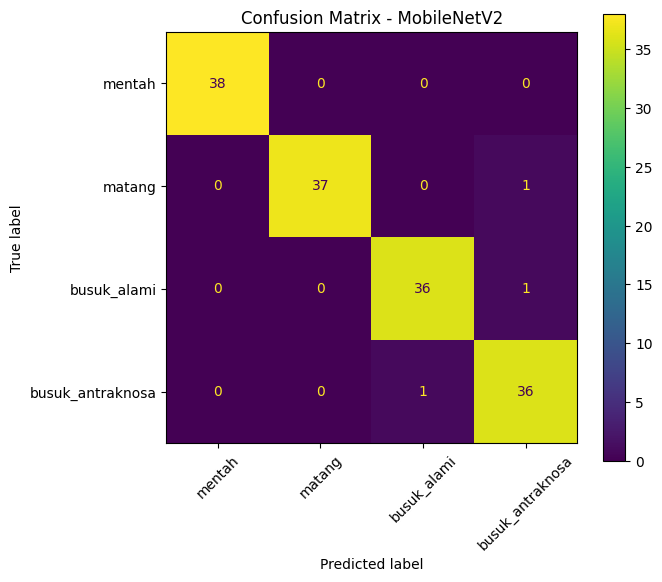

Confusion matrix disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/confusion_matrix.png


,mentah,matang,busuk_alami,busuk_antraknosa
mentah,38,0,0,0
matang,0,37,0,1
busuk_alami,0,0,36,1
busuk_antraknosa,0,0,1,36


In [ ]:
# ============================================================
# CELL 18 - CONFUSION MATRIX
# Untuk Bab 4.6.4 Hasil Evaluasi Model
# ============================================================

cm = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))

cm_df = pd.DataFrame(
    cm,
    index=CLASS_NAMES,
    columns=CLASS_NAMES
)

cm_df.to_csv(REPORT_DIR / "confusion_matrix.csv")

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=CLASS_NAMES
)

fig, ax = plt.subplots(figsize=(7, 6))
disp.plot(ax=ax, xticks_rotation=45, values_format="d")
plt.title("Confusion Matrix - MobileNetV2")
plt.tight_layout()

cm_path = REPORT_DIR / "confusion_matrix.png"
plt.savefig(cm_path, dpi=160, bbox_inches="tight")
plt.show()

print("Confusion matrix disimpan ke:", cm_path)
display(cm_df)

---

# CELL 19 — Analisis data salah klasifikasi

Output:

```text
misclassified_samples.csv
misclassified_samples_preview.png
```

Jumlah salah klasifikasi: 3


,image_path,actual_label,predicted_label,confidence,actual_class_probability,cross_entropy
0,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,matang,busuk_antraknosa,0.801574,0.179655,1.716720
1,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_alami,busuk_antraknosa,0.746610,0.206876,1.575638
2,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_antraknosa,busuk_alami,0.768805,0.230644,1.466881


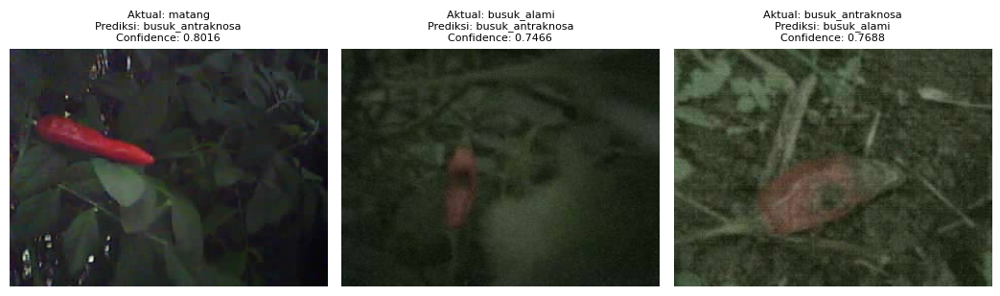

Preview salah klasifikasi: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/misclassified_samples_preview.png


In [ ]:
# ============================================================
# CELL 19 - ANALISIS SALAH KLASIFIKASI YANG TERSINKRON
# ============================================================

errors_df = (
    evaluation_predictions_df[
        ~evaluation_predictions_df["is_correct"]
    ]
    .copy()
    .reset_index(drop=True)
)

errors_df["probabilities"] = errors_df.apply(
    lambda row: json.dumps(
        {
            class_name: float(
                row[f"prob_{class_name}"]
            )
            for class_name in CLASS_NAMES
        },
        ensure_ascii=False
    ),
    axis=1
)

errors_csv_path = (
    REPORT_DIR
    / "misclassified_samples.csv"
)

errors_df.to_csv(
    errors_csv_path,
    index=False
)

print(
    "Jumlah salah klasifikasi:",
    len(errors_df)
)

display(
    errors_df[
        [
            "image_path",
            "actual_label",
            "predicted_label",
            "confidence",
            "actual_class_probability",
            "cross_entropy",
        ]
    ].head(20)
)


def plot_misclassified_samples(
    dataframe: pd.DataFrame,
    max_images: int = 8
):
    if dataframe.empty:
        print(
            "Tidak ada citra salah klasifikasi."
        )
        return

    sample_df = dataframe.head(
        max_images
    )

    columns = 4
    rows = int(
        np.ceil(
            len(sample_df) / columns
        )
    )

    plt.figure(
        figsize=(14, 3.5 * rows)
    )

    for plot_index, (_, row) in enumerate(
        sample_df.iterrows(),
        start=1
    ):
        image_path = Path(
            row["image_path"]
        )

        image = read_image_for_plot(
            image_path
        )

        plt.subplot(
            rows,
            columns,
            plot_index
        )

        plt.imshow(image)
        plt.axis("off")
        plt.title(
            f"Aktual: {row['actual_label']}\n"
            f"Prediksi: {row['predicted_label']}\n"
            f"Confidence: {row['confidence']:.4f}",
            fontsize=8
        )

    plt.tight_layout()

    output_path = (
        REPORT_DIR
        / "misclassified_samples_preview.png"
    )

    plt.savefig(
        output_path,
        dpi=180,
        bbox_inches="tight"
    )

    plt.show()

    print(
        "Preview salah klasifikasi:",
        output_path
    )


plot_misclassified_samples(
    errors_df,
    max_images=8
)


---

# CELL 20 — Fine-tuning opsional

Cell ini tidak wajib. Jalankan hanya kalau hasil model frozen masih kurang bagus.

In [ ]:
# ============================================================
# CELL 20 - FINE-TUNING OPSIONAL
# Jalankan hanya jika model frozen belum optimal.
# ============================================================

RUN_FINE_TUNING = False

if RUN_FINE_TUNING:
    base_model.trainable = True

    fine_tune_at = len(base_model.layers) - 30

    for layer in base_model.layers[:fine_tune_at]:
        layer.trainable = False

    model.compile(
        optimizer=Adam(learning_rate=1e-5),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )

    fine_model_path = MODEL_DIR / "best_mobilenetv2_cabai_finetuned.keras"

    fine_callbacks = [
        ModelCheckpoint(
            filepath=str(fine_model_path),
            monitor="val_accuracy",
            save_best_only=True,
            mode="max",
            verbose=1
        ),
        EarlyStopping(
            monitor="val_loss",
            patience=6,
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.2,
            patience=3,
            min_lr=1e-7,
            verbose=1
        )
    ]

    fine_history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=20,
        callbacks=fine_callbacks
    )

    fine_history_df = pd.DataFrame(fine_history.history)
    fine_history_df["epoch"] = np.arange(1, len(fine_history_df) + 1)
    fine_history_df.to_csv(REPORT_DIR / "fine_tuning_history.csv", index=False)

    model.save(MODEL_DIR / "last_mobilenetv2_cabai_finetuned.keras")

    print("Fine-tuned model disimpan ke:", fine_model_path)
else:
    print("Fine-tuning tidak dijalankan.")

Fine-tuning tidak dijalankan.


---

# CELL 21 — Simpan model final dan export TFLite

Output:

```text
mobilenetv2_cabai_final.keras
mobilenetv2_cabai_final.tflite
```

In [ ]:
# ============================================================
# CELL 21 - SIMPAN MODEL FINAL DAN EXPORT TFLITE
# Untuk Bab 4.6 / Lampiran Implementasi Model
# Versi aman dari error Lambda(preprocess_input)
# ============================================================

import json
import tensorflow as tf

from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# ------------------------------------------------------------
# 1. Pastikan konfigurasi dasar tersedia
# ------------------------------------------------------------
NUM_CLASSES = len(CLASS_NAMES)

print("Jumlah kelas:", NUM_CLASSES)
print("Class names:", CLASS_NAMES)
print("Best model path:", best_model_path)

# ------------------------------------------------------------
# 2. Load model terbaik yang masih memiliki Lambda(preprocess_input)
# ------------------------------------------------------------
trained_model = tf.keras.models.load_model(
    str(best_model_path),
    custom_objects={"preprocess_input": preprocess_input},
    safe_mode=False,
    compile=False
)

trained_model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Model terbaik berhasil dibaca dengan custom_objects.")

# ------------------------------------------------------------
# 3. Tampilkan daftar layer agar jelas
# ------------------------------------------------------------
print("\nDaftar layer pada model lama:")
for layer in trained_model.layers:
    try:
        jumlah_bobot = len(layer.get_weights())
    except:
        jumlah_bobot = 0

    print(f"- {layer.name} | {type(layer).__name__} | jumlah bobot: {jumlah_bobot}")

# ------------------------------------------------------------
# 4. Cari layer MobileNetV2 asli
# Jangan ambil mobilenetv2_preprocess karena itu hanya Lambda.
# MobileNetV2 asli punya banyak bobot, biasanya sekitar 260.
# ------------------------------------------------------------
mobilenet_layer = None

for layer in trained_model.layers:
    layer_name = layer.name.lower()
    jumlah_bobot = len(layer.get_weights())

    if "mobilenet" in layer_name and "preprocess" not in layer_name and jumlah_bobot > 100:
        mobilenet_layer = layer
        break

if mobilenet_layer is None:
    raise ValueError(
        "Layer MobileNetV2 asli tidak ditemukan. "
        "Lihat daftar layer di atas dan cek nama layer yang memiliki banyak bobot."
    )

print("\nLayer MobileNetV2 asli ditemukan:")
print(mobilenet_layer.name)
print("Jumlah bobot layer MobileNetV2:", len(mobilenet_layer.get_weights()))

# ------------------------------------------------------------
# 5. Buat MobileNetV2 baru yang bersih tanpa Lambda(preprocess_input)
# ------------------------------------------------------------
clean_base_model = MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights=None
)

clean_base_model.set_weights(mobilenet_layer.get_weights())
clean_base_model.trainable = False

print("Bobot MobileNetV2 berhasil disalin ke model baru.")

# ------------------------------------------------------------
# 6. Buat model final bersih
# Lambda(preprocess_input) diganti dengan Rescaling.
# MobileNetV2 membutuhkan input dari 0-255 menjadi -1 sampai 1.
# ------------------------------------------------------------
inputs = layers.Input(shape=IMG_SIZE + (3,), name="input_citra_224x224x3")

x = layers.Rescaling(
    scale=1./127.5,
    offset=-1,
    name="mobilenetv2_preprocess_rescaling"
)(inputs)

x = clean_base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x)

x = layers.Dense(
    DENSE_UNITS,
    activation="relu",
    name="dense_128"
)(x)

x = layers.Dropout(
    DROPOUT_RATE,
    name="dropout_0_5"
)(x)

outputs = layers.Dense(
    NUM_CLASSES,
    activation="softmax",
    name="output_softmax"
)(x)

final_model = Model(
    inputs=inputs,
    outputs=outputs,
    name="MobileNetV2_Kualitas_Cabai_Final"
)

# ------------------------------------------------------------
# 7. Salin bobot layer klasifikasi dari model lama
# ------------------------------------------------------------
final_model.get_layer("dense_128").set_weights(
    trained_model.get_layer("dense_128").get_weights()
)

final_model.get_layer("output_softmax").set_weights(
    trained_model.get_layer("output_softmax").get_weights()
)

final_model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Model final bersih berhasil dibuat.")

# ------------------------------------------------------------
# 8. Evaluasi ulang model final pada test set
# ------------------------------------------------------------
final_test_loss, final_test_accuracy = final_model.evaluate(test_ds, verbose=1)

print("Final model test loss:", final_test_loss)
print("Final model test accuracy:", final_test_accuracy)

# ------------------------------------------------------------
# 9. Simpan model final Keras yang aman untuk backend/dashboard
# ------------------------------------------------------------
keras_final_path = MODEL_DIR / "mobilenetv2_cabai_final.keras"

final_model.save(keras_final_path)

print("\nModel final Keras disimpan ke:")
print(keras_final_path)

# ------------------------------------------------------------
# 10. Simpan label kelas
# ------------------------------------------------------------
labels_path = MODEL_DIR / "class_names.json"

with open(labels_path, "w", encoding="utf-8") as f:
    json.dump(CLASS_NAMES, f, indent=2, ensure_ascii=False)

print("\nFile label kelas disimpan ke:")
print(labels_path)

# ------------------------------------------------------------
# 11. Export ke TFLite
# ------------------------------------------------------------
tflite_path = MODEL_DIR / "mobilenetv2_cabai_final.tflite"

try:
    converter = tf.lite.TFLiteConverter.from_keras_model(final_model)
    converter.optimizations = [tf.lite.Optimize.DEFAULT]

    tflite_model = converter.convert()

    with open(tflite_path, "wb") as f:
        f.write(tflite_model)

    print("\nModel TFLite disimpan ke:")
    print(tflite_path)

except Exception as e:
    print("\nExport TFLite gagal.")
    print("Error:", e)

# ------------------------------------------------------------
# 12. Ringkasan output
# ------------------------------------------------------------
print("1. Model final Keras :", keras_final_path)
print("2. Label kelas       :", labels_path)
print("3. Model TFLite      :", tflite_path)

Jumlah kelas: 4
Class names: ['mentah', 'matang', 'busuk_alami', 'busuk_antraknosa']
Best model path: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/models/best_mobilenetv2_cabai.keras
Model terbaik berhasil dibaca dengan custom_objects.

Daftar layer pada model lama:
- input_citra_224x224x3 | InputLayer | jumlah bobot: 0
- augmentasi_citra | Sequential | jumlah bobot: 0
- mobilenetv2_preprocess | Lambda | jumlah bobot: 0
- mobilenetv2_1.00_224 | Functional | jumlah bobot: 260
- global_average_pooling | GlobalAveragePooling2D | jumlah bobot: 0
- dense_128 | Dense | jumlah bobot: 2
- dropout_0_5 | Dropout | jumlah bobot: 0
- output_softmax | Dense | jumlah bobot: 2

Layer MobileNetV2 asli ditemukan:
mobilenetv2_1.00_224
Jumlah bobot layer MobileNetV2: 260
Bobot MobileNetV2 berhasil disalin ke model baru.
Model final bersih berhasil dibuat.
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.9800 - loss: 0.0793
Final model test loss: 0.07934059202671051
Final model test accur

## Efisiensi komputasi dan ukuran model

Cell berikut menghitung parameter, perkiraan FLOPs/MACs untuk satu citra, ukuran model Keras, ukuran model TFLite, dan rasio ukuran. Nilai FLOPs dapat mencakup operasi preprocessing ringan di dalam model final sehingga dilaporkan sebagai hasil profiling TensorFlow.

In [ ]:
# ============================================================
# CELL 21B - FLOPs, MACs, PARAMETER, DAN UKURAN MODEL
# ============================================================

from tensorflow.python.framework.convert_to_constants import (
    convert_variables_to_constants_v2
)


def path_size_bytes(path: Path):
    if not path.exists():
        return None

    if path.is_file():
        return int(
            path.stat().st_size
        )

    return int(sum(
        item.stat().st_size
        for item in path.rglob("*")
        if item.is_file()
    ))


def profile_model_flops(
    keras_model: tf.keras.Model
):
    try:
        input_spec = tf.TensorSpec(
            shape=(
                1,
                IMG_SIZE[0],
                IMG_SIZE[1],
                3,
            ),
            dtype=tf.float32
        )

        concrete_function = tf.function(
            lambda inputs: keras_model(
                inputs,
                training=False
            )
        ).get_concrete_function(
            input_spec
        )

        frozen_function = (
            convert_variables_to_constants_v2(
                concrete_function
            )
        )

        options = (
            tf.compat.v1.profiler
            .ProfileOptionBuilder
            .float_operation()
        )

        options["output"] = "none"

        profile = tf.compat.v1.profiler.profile(
            graph=frozen_function.graph,
            options=options
        )

        total_flops = int(
            profile.total_float_ops
        )

        # Satu MAC lazim didekati sebagai dua FLOP:
        # satu perkalian dan satu penjumlahan.
        approximate_macs = (
            total_flops / 2.0
        )

        return (
            total_flops,
            approximate_macs,
            None,
        )

    except Exception as error:
        return (
            None,
            None,
            str(error),
        )


if "final_model" not in globals():
    raise RuntimeError(
        "final_model belum tersedia. Jalankan CELL 21."
    )

total_flops, approximate_macs, profiler_error = (
    profile_model_flops(
        final_model
    )
)

keras_size_bytes = path_size_bytes(
    keras_final_path
)

tflite_size_bytes = path_size_bytes(
    tflite_path
)

total_params = int(
    final_model.count_params()
)

trainable_params = int(sum(
    np.prod(variable.shape)
    for variable in final_model.trainable_weights
))

non_trainable_params = (
    total_params
    - trainable_params
)

keras_size_mb = (
    keras_size_bytes / (1024 ** 2)
    if keras_size_bytes is not None
    else None
)

tflite_size_mb = (
    tflite_size_bytes / (1024 ** 2)
    if tflite_size_bytes is not None
    else None
)

size_reduction_percent = None

if (
    keras_size_bytes
    and tflite_size_bytes
):
    size_reduction_percent = (
        1
        - (
            tflite_size_bytes
            / keras_size_bytes
        )
    ) * 100

model_efficiency_df = pd.DataFrame([{
    "input_shape": (
        f"1 x {IMG_SIZE[0]} x "
        f"{IMG_SIZE[1]} x 3"
    ),
    "total_parameters": total_params,
    "trainable_parameters": trainable_params,
    "non_trainable_parameters": (
        non_trainable_params
    ),
    "flops_per_image_approx": total_flops,
    "macs_per_image_approx": (
        approximate_macs
    ),
    "keras_size_bytes": keras_size_bytes,
    "keras_size_mb": keras_size_mb,
    "tflite_size_bytes": tflite_size_bytes,
    "tflite_size_mb": tflite_size_mb,
    "size_reduction_percent": (
        size_reduction_percent
    ),
    "profiler_status": (
        "BERHASIL"
        if profiler_error is None
        else "GAGAL"
    ),
    "profiler_error": profiler_error,
    "catatan": (
        "MACs diperkirakan sebagai FLOPs/2. "
        "Profil TensorFlow dapat mencakup operasi "
        "preprocessing pada model final."
    ),
}])

model_efficiency_df.to_csv(
    REPORT_DIR
    / "model_efficiency_summary.csv",
    index=False
)

model_efficiency_df.to_excel(
    REPORT_DIR
    / "model_efficiency_summary.xlsx",
    index=False
)

display(model_efficiency_df)

print(
    "Ringkasan efisiensi model:",
    REPORT_DIR
    / "model_efficiency_summary.csv"
)


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.


,input_shape,total_parameters,trainable_parameters,non_trainable_parameters,flops_per_image_approx,macs_per_image_approx,keras_size_bytes,keras_size_mb,tflite_size_bytes,tflite_size_mb,size_reduction_percent,profiler_status,profiler_error,catatan
0,1 x 224 x 224 x 3,2422468,164484,2257984,613356120,306678060.0,10283703,9.807303,2674072,2.550194,73.996993,BERHASIL,None,MACs diperkirakan sebagai FLOPs/2. Profil Tens...


Ringkasan efisiensi model: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/model_efficiency_summary.csv


# Implementasi Proses Matematis MobileNetV2 untuk Bab IV

Bagian ini memverifikasi rumus pada Bab III menggunakan data dan bobot model aktual.

Skema yang digunakan:

1. Satu citra dari kelas `busuk_antraknosa` ditelusuri secara rinci.
2. Satu citra representatif dari setiap kelas ditelusuri pada GAP, Dense, logits, softmax, dan cross-entropy.
3. Setiap jenis operasi dihitung pada satu elemen representatif, bukan seluruh jutaan operasi MobileNetV2.
4. Hasil manual dibandingkan dengan TensorFlow menggunakan selisih absolut.
5. TP, FP, FN, TN, precision, recall, specificity, dan F1 dihitung manual untuk setiap kelas.
6. Grad-CAM digunakan sebagai analisis pendukung untuk melihat area citra yang memengaruhi prediksi.

Seluruh output disimpan ke `reports/bab4/mathematical_trace`.

In [ ]:
# ============================================================
# TRACE 1 - MODEL, OUTPUT TRACE, DAN CITRA REPRESENTATIF
# Pipeline citra disamakan dengan CELL 10 dan CELL 17.
# ============================================================

from sklearn.metrics import (
    confusion_matrix,
    precision_recall_fscore_support
)

TRACE_DIR = (
    REPORT_DIR
    / "mathematical_trace"
)

TRACE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

TRACE_TOLERANCE = 1e-5
TRACE_CLASS = "busuk_antraknosa"

if "final_model" not in globals():
    keras_final_path = (
        MODEL_DIR
        / "mobilenetv2_cabai_final.keras"
    )

    if not keras_final_path.exists():
        raise FileNotFoundError(
            f"Model final tidak ditemukan: {keras_final_path}"
        )

    final_model = tf.keras.models.load_model(
        str(keras_final_path),
        compile=False
    )


def find_mobilenet_backbone(
    keras_model: tf.keras.Model
) -> tf.keras.Model:
    for layer in keras_model.layers:
        if isinstance(
            layer,
            tf.keras.Model
        ):
            internal_names = {
                internal.name
                for internal in layer.layers
            }

            required_names = {
                "Conv1",
                "bn_Conv1",
                "Conv1_relu",
            }

            if required_names.issubset(
                internal_names
            ):
                return layer

    raise ValueError(
        "Nested MobileNetV2 tidak ditemukan."
    )


trace_backbone = (
    clean_base_model
    if "clean_base_model" in globals()
    else find_mobilenet_backbone(
        final_model
    )
)

# Fungsi kompatibilitas untuk TRACE 6 dan TRACE 8.
# Seluruh trace memakai pipeline resize bilinear yang sama.
def load_raw_image_batch(image_path: Path) -> np.ndarray:
    return load_image_consistent(
        image_path,
        add_batch_dimension=True
    ).numpy()

print("Model final :", final_model.name)
print("Backbone    :", trace_backbone.name)
print("Output trace:", TRACE_DIR)

# ------------------------------------------------------------
# A. Prediksi seluruh test set memakai final_model
# ------------------------------------------------------------
trace_rows = []

for _, evaluation_row in (
    evaluation_predictions_df.iterrows()
):
    image_path = Path(
        evaluation_row["image_path"]
    )

    raw_batch = load_image_consistent(
        image_path,
        add_batch_dimension=True
    )

    probabilities = final_model(
        raw_batch,
        training=False
    ).numpy()[0]

    predicted_index = int(
        np.argmax(probabilities)
    )

    trace_row = {
        "image_path": str(image_path),
        "actual_label": str(
            evaluation_row["actual_label"]
        ),
        "actual_index": int(
            evaluation_row["actual_index"]
        ),
        "predicted_index": predicted_index,
        "predicted_label": CLASS_NAMES[
            predicted_index
        ],
        "confidence": float(
            probabilities[predicted_index]
        ),
        "is_correct": (
            predicted_index
            == int(
                evaluation_row["actual_index"]
            )
        ),
    }

    for class_index, class_name in enumerate(
        CLASS_NAMES
    ):
        trace_row[f"prob_{class_name}"] = float(
            probabilities[class_index]
        )

    trace_rows.append(trace_row)


test_trace_predictions_df = pd.DataFrame(
    trace_rows
)

test_trace_predictions_df.to_csv(
    TRACE_DIR
    / "test_predictions_with_paths.csv",
    index=False
)

# ------------------------------------------------------------
# B. Pastikan best_model dan final_model identik saat inferensi
# ------------------------------------------------------------
merged_probability_df = (
    evaluation_predictions_df[
        ["image_path"] + [
            f"prob_{class_name}"
            for class_name in CLASS_NAMES
        ]
    ]
    .merge(
        test_trace_predictions_df[
            ["image_path"] + [
                f"prob_{class_name}"
                for class_name in CLASS_NAMES
            ]
        ],
        on="image_path",
        suffixes=(
            "_best_model",
            "_final_model"
        ),
        how="inner"
    )
)

probability_differences = []

for class_name in CLASS_NAMES:
    probability_differences.append(
        np.abs(
            merged_probability_df[
                f"prob_{class_name}_best_model"
            ]
            - merged_probability_df[
                f"prob_{class_name}_final_model"
            ]
        ).to_numpy()
    )

maximum_probability_difference = float(
    np.max(
        np.concatenate(
            probability_differences
        )
    )
)

prediction_match = bool(
    np.array_equal(
        evaluation_predictions_df[
            "predicted_index"
        ].to_numpy(dtype=int),
        test_trace_predictions_df[
            "predicted_index"
        ].to_numpy(dtype=int)
    )
)

model_export_consistency_df = pd.DataFrame([{
    "jumlah_test": len(
        test_trace_predictions_df
    ),
    "maximum_probability_difference": (
        maximum_probability_difference
    ),
    "predicted_class_match": (
        prediction_match
    ),
    "status": (
        "SESUAI"
        if (
            prediction_match
            and maximum_probability_difference
            <= TRACE_TOLERANCE
        )
        else "TIDAK_SESUAI"
    ),
}])

model_export_consistency_df.to_csv(
    TRACE_DIR
    / "best_vs_final_model_consistency.csv",
    index=False
)

display(model_export_consistency_df)

assert prediction_match, (
    "Prediksi best_model dan final_model berbeda."
)

assert (
    maximum_probability_difference
    <= TRACE_TOLERANCE
), (
    "Probabilitas best_model dan final_model berbeda."
)

# ------------------------------------------------------------
# C. Pilih satu citra representatif tiap kelas
# ------------------------------------------------------------
def choose_representative_per_class(
    prediction_df: pd.DataFrame
) -> pd.DataFrame:
    selected_rows = []

    for class_name in CLASS_NAMES:
        class_df = prediction_df[
            prediction_df["actual_label"]
            == class_name
        ].copy()

        correct_df = class_df[
            class_df["is_correct"]
        ].copy()

        candidates = (
            correct_df
            if not correct_df.empty
            else class_df
        )

        median_confidence = float(
            candidates[
                "confidence"
            ].median()
        )

        candidates[
            "distance_from_median"
        ] = (
            candidates["confidence"]
            - median_confidence
        ).abs()

        chosen = candidates.sort_values(
            [
                "distance_from_median",
                "image_path",
            ]
        ).iloc[0].copy()

        selected_rows.append(chosen)

    return pd.DataFrame(
        selected_rows
    ).reset_index(drop=True)


representative_df = (
    choose_representative_per_class(
        test_trace_predictions_df
    )
)

representative_df.to_csv(
    TRACE_DIR
    / "representative_images_per_class.csv",
    index=False
)

display(
    representative_df[
        [
            "image_path",
            "actual_label",
            "predicted_label",
            "confidence",
            "is_correct",
        ]
    ]
)

trace_candidates = representative_df[
    representative_df["actual_label"]
    == TRACE_CLASS
]

trace_row = (
    trace_candidates.iloc[0]
    if not trace_candidates.empty
    else representative_df.iloc[0]
)

TRACE_IMAGE_PATH = Path(
    trace_row["image_path"]
)

TRACE_ACTUAL_LABEL = str(
    trace_row["actual_label"]
)

TRACE_ACTUAL_INDEX = int(
    trace_row["actual_index"]
)

raw_trace_batch = load_image_consistent(
    TRACE_IMAGE_PATH,
    add_batch_dimension=True
).numpy()

normalized_trace_batch = (
    raw_trace_batch / 127.5
) - 1.0

print("Citra trace :", TRACE_IMAGE_PATH)
print("Label aktual:", TRACE_ACTUAL_LABEL)
print("Shape raw   :", raw_trace_batch.shape)
print(
    "Rentang raw :",
    raw_trace_batch.min(),
    raw_trace_batch.max()
)
print(
    "Rentang normalisasi:",
    normalized_trace_batch.min(),
    normalized_trace_batch.max()
)


Model final : MobileNetV2_Kualitas_Cabai_Final
Backbone    : mobilenetv2_1.00_224
Output trace: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/mathematical_trace


,jumlah_test,maximum_probability_difference,predicted_class_match,status
0,150,0.000003,True,SESUAI


,image_path,actual_label,predicted_label,confidence,is_correct
0,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,mentah,0.999902,True
1,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,matang,matang,0.998181,True
2,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_alami,busuk_alami,0.982565,True
3,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_antraknosa,busuk_antraknosa,0.962870,True


Citra trace : /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/dataset/split/test/busuk_antraknosa/cabai_20260610_133846__70a58836fb304024.jpg
Label aktual: busuk_antraknosa
Shape raw   : (1, 224, 224, 3)
Rentang raw : 3.5331483 117.87754
Rentang normalisasi: -0.972289 -0.07547027


In [ ]:
# ============================================================
# TRACE 2 - INVENTARIS SELURUH LAYER, OUTPUT SHAPE, DAN PARAMETER
# ============================================================

def shape_to_text(shape_value) -> str:
    try:
        return str(tuple(shape_value))
    except TypeError:
        return str(shape_value)


layer_rows = []

for index, layer in enumerate(trace_backbone.layers):
    try:
        output_shape = shape_to_text(layer.output.shape)
    except Exception:
        output_shape = "-"

    layer_rows.append({
        "urutan": index + 1,
        "nama_layer": layer.name,
        "jenis_layer": layer.__class__.__name__,
        "output_shape": output_shape,
        "jumlah_parameter": int(layer.count_params()),
        "trainable": bool(layer.trainable),
    })

# Tambahkan classification head.
for layer_name in [
    "global_average_pooling",
    "dense_128",
    "dropout_0_5",
    "output_softmax",
]:
    layer = final_model.get_layer(layer_name)

    layer_rows.append({
        "urutan": len(layer_rows) + 1,
        "nama_layer": layer.name,
        "jenis_layer": layer.__class__.__name__,
        "output_shape": shape_to_text(layer.output.shape),
        "jumlah_parameter": int(layer.count_params()),
        "trainable": bool(layer.trainable),
    })

layer_inventory_df = pd.DataFrame(layer_rows)

layer_inventory_df.to_csv(
    TRACE_DIR / "layer_inventory_full.csv",
    index=False
)

display(layer_inventory_df.head(20))
display(layer_inventory_df.tail(10))

# Verifikasi jumlah parameter classification head.
dense_layer = final_model.get_layer("dense_128")
output_layer = final_model.get_layer("output_softmax")

dense_kernel, dense_bias = dense_layer.get_weights()
output_kernel, output_bias = output_layer.get_weights()

manual_dense_parameters = (
    dense_kernel.shape[0] * dense_kernel.shape[1]
    + dense_bias.shape[0]
)

manual_output_parameters = (
    output_kernel.shape[0] * output_kernel.shape[1]
    + output_bias.shape[0]
)

parameter_verification_df = pd.DataFrame([
    {
        "bagian": "Dense 128",
        "rumus": (
            f"({dense_kernel.shape[0]} x "
            f"{dense_kernel.shape[1]}) + "
            f"{dense_bias.shape[0]}"
        ),
        "hasil_manual": manual_dense_parameters,
        "hasil_keras": dense_layer.count_params(),
        "selisih": abs(
            manual_dense_parameters
            - dense_layer.count_params()
        ),
    },
    {
        "bagian": "Output 4 kelas",
        "rumus": (
            f"({output_kernel.shape[0]} x "
            f"{output_kernel.shape[1]}) + "
            f"{output_bias.shape[0]}"
        ),
        "hasil_manual": manual_output_parameters,
        "hasil_keras": output_layer.count_params(),
        "selisih": abs(
            manual_output_parameters
            - output_layer.count_params()
        ),
    },
])

parameter_verification_df.to_csv(
    TRACE_DIR / "parameter_head_verification.csv",
    index=False
)

display(parameter_verification_df)

,urutan,nama_layer,jenis_layer,output_shape,jumlah_parameter,trainable
0,1,input_layer_2,InputLayer,"(None, 224, 224, 3)",0,False
1,2,Conv1,Conv2D,"(None, 112, 112, 32)",864,False
2,3,bn_Conv1,BatchNormalization,"(None, 112, 112, 32)",128,False
3,4,Conv1_relu,ReLU,"(None, 112, 112, 32)",0,False
4,5,expanded_conv_depthwise,DepthwiseConv2D,"(None, 112, 112, 32)",288,False
5,6,expanded_conv_depthwise_BN,BatchNormalization,"(None, 112, 112, 32)",128,False
6,7,expanded_conv_depthwise_relu,ReLU,"(None, 112, 112, 32)",0,False
7,8,expanded_conv_project,Conv2D,"(None, 112, 112, 16)",512,False
8,9,expanded_conv_project_BN,BatchNormalization,"(None, 112, 112, 16)",64,False
9,10,block_1_expand,Conv2D,"(None, 112, 112, 96)",1536,False


,urutan,nama_layer,jenis_layer,output_shape,jumlah_parameter,trainable
148,149,block_16_depthwise_relu,ReLU,"(None, 7, 7, 960)",0,False
149,150,block_16_project,Conv2D,"(None, 7, 7, 320)",307200,False
150,151,block_16_project_BN,BatchNormalization,"(None, 7, 7, 320)",1280,False
151,152,Conv_1,Conv2D,"(None, 7, 7, 1280)",409600,False
152,153,Conv_1_bn,BatchNormalization,"(None, 7, 7, 1280)",5120,False
153,154,out_relu,ReLU,"(None, 7, 7, 1280)",0,False
154,155,global_average_pooling,GlobalAveragePooling2D,"(None, 1280)",0,True
155,156,dense_128,Dense,"(None, 128)",163968,True
156,157,dropout_0_5,Dropout,"(None, 128)",0,True
157,158,output_softmax,Dense,"(None, 4)",516,True


,bagian,rumus,hasil_manual,hasil_keras,selisih
0,Dense 128,(1280 x 128) + 128,163968,163968,0
1,Output 4 kelas,(128 x 4) + 4,516,516,0


In [ ]:
# ============================================================
# TRACE 3 - NORMALISASI, CONV1, BATCH NORMALIZATION, DAN RELU6
# ============================================================

# ------------------------------------------------------------
# A. Contoh normalisasi satu piksel aktual
# ------------------------------------------------------------
import math
import numpy as np
import pandas as pd
import tensorflow as tf

pixel_row = min(100, IMG_SIZE[0] - 1)
pixel_col = min(80, IMG_SIZE[1] - 1)

raw_pixel = raw_trace_batch[
    0,
    pixel_row,
    pixel_col,
    :
].astype(np.float64)

manual_normalized_pixel = (
    raw_pixel / 127.5
) - 1.0

tensorflow_normalized_pixel = normalized_trace_batch[
    0,
    pixel_row,
    pixel_col,
    :
].astype(np.float64)

normalization_rows = []

for channel_index, channel_name in enumerate(["R", "G", "B"]):
    normalization_rows.append({
        "baris": pixel_row,
        "kolom": pixel_col,
        "kanal": channel_name,
        "nilai_asli": float(raw_pixel[channel_index]),
        "rumus": (
            f"({raw_pixel[channel_index]:.6f} / 127.5) - 1"
        ),
        "hasil_manual": float(
            manual_normalized_pixel[channel_index]
        ),
        "hasil_tensorflow": float(
            tensorflow_normalized_pixel[channel_index]
        ),
        "selisih_absolut": float(abs(
            manual_normalized_pixel[channel_index]
            - tensorflow_normalized_pixel[channel_index]
        )),
    })

normalization_df = pd.DataFrame(normalization_rows)

normalization_df.to_csv(
    TRACE_DIR / "manual_normalization_one_pixel.csv",
    index=False
)

display(normalization_df)

# ------------------------------------------------------------
# B. Output Conv1, BN, dan ReLU6
# ------------------------------------------------------------
required_initial_layers = [
    "Conv1",
    "bn_Conv1",
    "Conv1_relu",
]

for layer_name in required_initial_layers:
    if layer_name not in {
        layer.name for layer in trace_backbone.layers
    }:
        raise ValueError(
            f"Layer {layer_name} tidak ditemukan pada backbone."
        )

initial_trace_model = tf.keras.Model(
    inputs=trace_backbone.input,
    outputs=[
        trace_backbone.get_layer("Conv1").output,
        trace_backbone.get_layer("bn_Conv1").output,
        trace_backbone.get_layer("Conv1_relu").output,
    ],
    name="initial_trace_model",
)

conv1_output, bn1_output, relu1_output = [
    output.numpy()
    for output in initial_trace_model(
        normalized_trace_batch,
        training=False
    )
]

conv1_layer = trace_backbone.get_layer("Conv1")
conv1_kernel = conv1_layer.get_weights()[0]

conv_output_row = min(10, conv1_output.shape[1] - 1)
conv_output_col = min(10, conv1_output.shape[2] - 1)
conv_filter = 0

kernel_height, kernel_width = conv1_kernel.shape[:2]
stride_height, stride_width = conv1_layer.strides

input_height = normalized_trace_batch.shape[1]
input_width = normalized_trace_batch.shape[2]

output_height = int(
    math.ceil(input_height / stride_height)
)
output_width = int(
    math.ceil(input_width / stride_width)
)

padding_height = max(
    (output_height - 1) * stride_height
    + kernel_height
    - input_height,
    0,
)

padding_width = max(
    (output_width - 1) * stride_width
    + kernel_width
    - input_width,
    0,
)

pad_top = padding_height // 2
pad_bottom = padding_height - pad_top
pad_left = padding_width // 2
pad_right = padding_width - pad_left

padded_input = np.pad(
    normalized_trace_batch[0],
    (
        (pad_top, pad_bottom),
        (pad_left, pad_right),
        (0, 0),
    ),
    mode="constant",
    constant_values=0,
)

input_start_row = conv_output_row * stride_height
input_start_col = conv_output_col * stride_width

conv_patch = padded_input[
    input_start_row:input_start_row + kernel_height,
    input_start_col:input_start_col + kernel_width,
    :
]

selected_kernel = conv1_kernel[
    :,
    :,
    :,
    conv_filter,
]

conv_products = conv_patch * selected_kernel
manual_conv_value = float(np.sum(conv_products))

tensorflow_conv_value = float(
    conv1_output[
        0,
        conv_output_row,
        conv_output_col,
        conv_filter,
    ]
)

conv_contribution_rows = []

for kernel_row in range(kernel_height):
    for kernel_col in range(kernel_width):
        for channel_index, channel_name in enumerate(
            ["R", "G", "B"]
        ):
            input_value = float(
                conv_patch[
                    kernel_row,
                    kernel_col,
                    channel_index,
                ]
            )

            weight_value = float(
                selected_kernel[
                    kernel_row,
                    kernel_col,
                    channel_index,
                ]
            )

            conv_contribution_rows.append({
                "kernel_row": kernel_row,
                "kernel_col": kernel_col,
                "channel": channel_name,
                "input_value": input_value,
                "kernel_weight": weight_value,
                "product": input_value * weight_value,
            })

conv_contributions_df = pd.DataFrame(
    conv_contribution_rows
)

conv_contributions_df.to_csv(
    TRACE_DIR / "manual_conv1_27_products.csv",
    index=False
)

conv_verification_df = pd.DataFrame([{
    "output_row": conv_output_row,
    "output_col": conv_output_col,
    "filter": conv_filter,
    "manual_conv": manual_conv_value,
    "tensorflow_conv": tensorflow_conv_value,
    "selisih_absolut": abs(
        manual_conv_value - tensorflow_conv_value
    ),
    "toleransi": TRACE_TOLERANCE,
    "sesuai": abs(
        manual_conv_value - tensorflow_conv_value
    ) <= TRACE_TOLERANCE,
}])

conv_verification_df.to_csv(
    TRACE_DIR / "manual_conv1_verification.csv",
    index=False
)

display(conv_contributions_df)
display(conv_verification_df)

# ------------------------------------------------------------
# C. Batch Normalization manual
# ------------------------------------------------------------
bn_layer = trace_backbone.get_layer("bn_Conv1")

gamma, beta, moving_mean, moving_variance = (
    bn_layer.get_weights()
)

bn_input_value = tensorflow_conv_value

manual_bn_value = float(
    gamma[conv_filter]
    * (
        bn_input_value - moving_mean[conv_filter]
    )
    / math.sqrt(
        moving_variance[conv_filter]
        + bn_layer.epsilon
    )
    + beta[conv_filter]
)

tensorflow_bn_value = float(
    bn1_output[
        0,
        conv_output_row,
        conv_output_col,
        conv_filter,
    ]
)

bn_verification_df = pd.DataFrame([{
    "input_conv": bn_input_value,
    "gamma": float(gamma[conv_filter]),
    "beta": float(beta[conv_filter]),
    "moving_mean": float(moving_mean[conv_filter]),
    "moving_variance": float(
        moving_variance[conv_filter]
    ),
    "epsilon": float(bn_layer.epsilon),
    "hasil_manual": manual_bn_value,
    "hasil_tensorflow": tensorflow_bn_value,
    "selisih_absolut": abs(
        manual_bn_value - tensorflow_bn_value
    ),
    "sesuai": abs(
        manual_bn_value - tensorflow_bn_value
    ) <= TRACE_TOLERANCE,
}])

bn_verification_df.to_csv(
    TRACE_DIR / "manual_batch_normalization.csv",
    index=False
)

display(bn_verification_df)

# ------------------------------------------------------------
# D. ReLU6 manual
# ------------------------------------------------------------
flat_bn = bn1_output[0].reshape(-1)
flat_relu = relu1_output[0].reshape(-1)

negative_flat_index = int(np.argmin(flat_bn))
maximum_flat_index = int(np.argmax(flat_bn))

middle_candidates = np.where(
    (flat_bn > 0.0) & (flat_bn < 6.0)
)[0]

if len(middle_candidates) > 0:
    middle_flat_index = int(
        middle_candidates[
            np.argmin(
                np.abs(
                    flat_bn[middle_candidates] - 3.0
                )
            )
        ]
    )
else:
    middle_flat_index = negative_flat_index

relu_examples = [
    ("nilai_negatif", negative_flat_index),
    ("nilai_antara_0_dan_6", middle_flat_index),
    ("nilai_maksimum", maximum_flat_index),
]

relu_rows = []

for category, flat_index in relu_examples:
    input_value = float(flat_bn[flat_index])
    manual_output = float(
        min(max(0.0, input_value), 6.0)
    )
    tensorflow_output = float(
        flat_relu[flat_index]
    )

    tensor_index = np.unravel_index(
        flat_index,
        bn1_output[0].shape
    )

    relu_rows.append({
        "kategori": category,
        "tensor_index": str(tuple(
            int(value) for value in tensor_index
        )),
        "input_batch_normalization": input_value,
        "hasil_manual_relu6": manual_output,
        "hasil_tensorflow_relu6": tensorflow_output,
        "selisih_absolut": abs(
            manual_output - tensorflow_output
        ),
        "sesuai": abs(
            manual_output - tensorflow_output
        ) <= TRACE_TOLERANCE,
    })

relu6_verification_df = pd.DataFrame(relu_rows)

relu6_verification_df.to_csv(
    TRACE_DIR / "manual_relu6_examples.csv",
    index=False
)

display(relu6_verification_df)

,baris,kolom,kanal,nilai_asli,rumus,hasil_manual,hasil_tensorflow,selisih_absolut
0,100,80,R,41.232151,(41.232151 / 127.5) - 1,-0.676611,-0.676611,8.882261e-09
1,100,80,G,40.232151,(40.232151 / 127.5) - 1,-0.684454,-0.684454,8.414773e-09
2,100,80,B,19.232151,(19.232151 / 127.5) - 1,-0.849160,-0.849160,1.402462e-09


,kernel_row,kernel_col,channel,input_value,kernel_weight,product
0,0,0,R,-0.641176,-0.171659,0.110064
1,0,0,G,-0.437255,-0.318942,0.139459
2,0,0,B,-0.649020,-0.106409,0.069061
3,0,1,R,-0.618487,-0.287314,0.177700
4,0,1,G,-0.414566,-0.470179,0.194920
5,0,1,B,-0.626330,-0.131382,0.082288
6,0,2,R,-0.618387,-0.071324,0.044106
7,0,2,G,-0.414466,-0.104591,0.043349
8,0,2,B,-0.626230,-0.057255,0.035855
9,1,0,R,-0.657983,0.285173,-0.187639


,output_row,output_col,filter,manual_conv,tensorflow_conv,selisih_absolut,toleransi,sesuai
0,10,10,0,-0.24295,-0.24295,1.192093e-07,0.00001,True


,input_conv,gamma,beta,moving_mean,moving_variance,epsilon,hasil_manual,hasil_tensorflow,selisih_absolut,sesuai
0,-0.24295,0.612176,2.255549,-0.036762,0.120517,0.001,1.893454,1.893454,1.192093e-07,True


,kategori,tensor_index,input_batch_normalization,hasil_manual_relu6,hasil_tensorflow_relu6,selisih_absolut,sesuai
0,nilai_negatif,"(111, 111, 30)",-7.403468,0.000000,0.000000,0.0,True
1,nilai_antara_0_dan_6,"(48, 106, 4)",2.999996,2.999996,2.999996,0.0,True
2,nilai_maksimum,"(108, 111, 17)",5.654520,5.654520,5.654520,0.0,True


In [ ]:
# ============================================================
# TRACE 4 - INVERTED RESIDUAL BLOCK:
# EXPANSION, DEPTHWISE, POINTWISE, DAN RESIDUAL
# ============================================================

block_layer_names = [
    "block_2_expand",
    "block_2_depthwise",
    "block_2_project",
    "block_2_add",
]

available_backbone_layers = {
    layer.name for layer in trace_backbone.layers
}

missing_block_layers = [
    layer_name
    for layer_name in block_layer_names
    if layer_name not in available_backbone_layers
]

if missing_block_layers:
    raise ValueError(
        "Layer inverted residual tidak lengkap: "
        f"{missing_block_layers}"
    )

expand_layer = trace_backbone.get_layer(
    "block_2_expand"
)
depthwise_layer = trace_backbone.get_layer(
    "block_2_depthwise"
)
project_layer = trace_backbone.get_layer(
    "block_2_project"
)
add_layer = trace_backbone.get_layer(
    "block_2_add"
)

block_trace_model = tf.keras.Model(
    inputs=trace_backbone.input,
    outputs=[
        expand_layer.input,
        expand_layer.output,
        depthwise_layer.input,
        depthwise_layer.output,
        project_layer.input,
        project_layer.output,
        add_layer.input[0],
        add_layer.input[1],
        add_layer.output,
    ],
    name="block_2_trace_model",
)

(
    expand_input,
    expand_output,
    depthwise_input,
    depthwise_output,
    project_input,
    project_output,
    residual_input_a,
    residual_input_b,
    residual_output,
) = [
    output.numpy()
    for output in block_trace_model(
        normalized_trace_batch,
        training=False
    )
]

# ------------------------------------------------------------
# A. Expansion convolution 1x1
# ------------------------------------------------------------
expand_kernel = expand_layer.get_weights()[0]

expand_row = min(5, expand_output.shape[1] - 1)
expand_col = min(5, expand_output.shape[2] - 1)
expand_channel = 0

expand_input_vector = expand_input[
    0,
    expand_row,
    expand_col,
    :
].astype(np.float64)

expand_weight_vector = expand_kernel[
    0,
    0,
    :,
    expand_channel,
].astype(np.float64)

expand_products = (
    expand_input_vector * expand_weight_vector
)

manual_expand_value = float(
    np.sum(expand_products)
)

tensorflow_expand_value = float(
    expand_output[
        0,
        expand_row,
        expand_col,
        expand_channel,
    ]
)

expand_contributions_df = pd.DataFrame({
    "input_channel": np.arange(
        len(expand_input_vector)
    ),
    "input_value": expand_input_vector,
    "weight": expand_weight_vector,
    "product": expand_products,
})

expand_contributions_df.to_csv(
    TRACE_DIR / "manual_expansion_contributions.csv",
    index=False
)

expand_summary_df = pd.DataFrame([{
    "layer": expand_layer.name,
    "row": expand_row,
    "col": expand_col,
    "output_channel": expand_channel,
    "manual_result": manual_expand_value,
    "tensorflow_result": tensorflow_expand_value,
    "absolute_difference": abs(
        manual_expand_value
        - tensorflow_expand_value
    ),
    "sesuai": abs(
        manual_expand_value
        - tensorflow_expand_value
    ) <= TRACE_TOLERANCE,
}])

expand_summary_df.to_csv(
    TRACE_DIR / "manual_expansion_verification.csv",
    index=False
)

display(expand_contributions_df.head(20))
display(expand_summary_df)

# ------------------------------------------------------------
# B. Depthwise convolution 3x3
# ------------------------------------------------------------
depthwise_kernel = depthwise_layer.get_weights()[0]

dw_row = min(5, depthwise_output.shape[1] - 1)
dw_col = min(5, depthwise_output.shape[2] - 1)
dw_channel = 0

dw_kernel_height, dw_kernel_width = (
    depthwise_kernel.shape[:2]
)

dw_stride_height, dw_stride_width = (
    depthwise_layer.strides
)

dw_input_height = depthwise_input.shape[1]
dw_input_width = depthwise_input.shape[2]

dw_output_height = int(
    math.ceil(
        dw_input_height / dw_stride_height
    )
)

dw_output_width = int(
    math.ceil(
        dw_input_width / dw_stride_width
    )
)

dw_padding_height = max(
    (dw_output_height - 1) * dw_stride_height
    + dw_kernel_height
    - dw_input_height,
    0,
)

dw_padding_width = max(
    (dw_output_width - 1) * dw_stride_width
    + dw_kernel_width
    - dw_input_width,
    0,
)

dw_pad_top = dw_padding_height // 2
dw_pad_bottom = (
    dw_padding_height - dw_pad_top
)

dw_pad_left = dw_padding_width // 2
dw_pad_right = (
    dw_padding_width - dw_pad_left
)

padded_dw_input = np.pad(
    depthwise_input[0],
    (
        (dw_pad_top, dw_pad_bottom),
        (dw_pad_left, dw_pad_right),
        (0, 0),
    ),
    mode="constant",
    constant_values=0,
)

dw_start_row = dw_row * dw_stride_height
dw_start_col = dw_col * dw_stride_width

dw_patch = padded_dw_input[
    dw_start_row:dw_start_row + dw_kernel_height,
    dw_start_col:dw_start_col + dw_kernel_width,
    dw_channel,
].astype(np.float64)

dw_weight_matrix = depthwise_kernel[
    :,
    :,
    dw_channel,
    0,
].astype(np.float64)

dw_products = dw_patch * dw_weight_matrix

manual_dw_value = float(np.sum(dw_products))

tensorflow_dw_value = float(
    depthwise_output[
        0,
        dw_row,
        dw_col,
        dw_channel,
    ]
)

dw_rows = []

for kernel_row in range(dw_kernel_height):
    for kernel_col in range(dw_kernel_width):
        input_value = float(
            dw_patch[kernel_row, kernel_col]
        )
        weight_value = float(
            dw_weight_matrix[
                kernel_row,
                kernel_col,
            ]
        )

        dw_rows.append({
            "kernel_row": kernel_row,
            "kernel_col": kernel_col,
            "input_value": input_value,
            "weight": weight_value,
            "product": input_value * weight_value,
        })

depthwise_contributions_df = pd.DataFrame(
    dw_rows
)

depthwise_contributions_df.to_csv(
    TRACE_DIR / "manual_depthwise_9_products.csv",
    index=False
)

depthwise_summary_df = pd.DataFrame([{
    "layer": depthwise_layer.name,
    "row": dw_row,
    "col": dw_col,
    "channel": dw_channel,
    "manual_result": manual_dw_value,
    "tensorflow_result": tensorflow_dw_value,
    "absolute_difference": abs(
        manual_dw_value
        - tensorflow_dw_value
    ),
    "sesuai": abs(
        manual_dw_value
        - tensorflow_dw_value
    ) <= TRACE_TOLERANCE,
}])

depthwise_summary_df.to_csv(
    TRACE_DIR / "manual_depthwise_verification.csv",
    index=False
)

display(depthwise_contributions_df)
display(depthwise_summary_df)

# ------------------------------------------------------------
# C. Pointwise / projection convolution 1x1
# ------------------------------------------------------------
project_kernel = project_layer.get_weights()[0]

project_row = min(
    dw_row,
    project_output.shape[1] - 1
)

project_col = min(
    dw_col,
    project_output.shape[2] - 1
)

project_channel = 0

project_input_vector = project_input[
    0,
    project_row,
    project_col,
    :
].astype(np.float64)

project_weight_vector = project_kernel[
    0,
    0,
    :,
    project_channel,
].astype(np.float64)

project_products = (
    project_input_vector
    * project_weight_vector
)

manual_project_value = float(
    np.sum(project_products)
)

tensorflow_project_value = float(
    project_output[
        0,
        project_row,
        project_col,
        project_channel,
    ]
)

project_contributions_df = pd.DataFrame({
    "input_channel": np.arange(
        len(project_input_vector)
    ),
    "input_value": project_input_vector,
    "weight": project_weight_vector,
    "product": project_products,
})

project_contributions_df.to_csv(
    TRACE_DIR / "manual_pointwise_contributions.csv",
    index=False
)

project_summary_df = pd.DataFrame([{
    "layer": project_layer.name,
    "row": project_row,
    "col": project_col,
    "output_channel": project_channel,
    "manual_result": manual_project_value,
    "tensorflow_result": tensorflow_project_value,
    "absolute_difference": abs(
        manual_project_value
        - tensorflow_project_value
    ),
    "sesuai": abs(
        manual_project_value
        - tensorflow_project_value
    ) <= TRACE_TOLERANCE,
}])

project_summary_df.to_csv(
    TRACE_DIR / "manual_pointwise_verification.csv",
    index=False
)

display(project_contributions_df.head(20))
display(project_summary_df)

# ------------------------------------------------------------
# D. Residual connection
# ------------------------------------------------------------
residual_row = min(
    5,
    residual_output.shape[1] - 1
)
residual_col = min(
    5,
    residual_output.shape[2] - 1
)
residual_channel = 0

residual_a_value = float(
    residual_input_a[
        0,
        residual_row,
        residual_col,
        residual_channel,
    ]
)

residual_b_value = float(
    residual_input_b[
        0,
        residual_row,
        residual_col,
        residual_channel,
    ]
)

manual_residual_value = (
    residual_a_value + residual_b_value
)

tensorflow_residual_value = float(
    residual_output[
        0,
        residual_row,
        residual_col,
        residual_channel,
    ]
)

residual_verification_df = pd.DataFrame([{
    "layer": add_layer.name,
    "row": residual_row,
    "col": residual_col,
    "channel": residual_channel,
    "input_a": residual_a_value,
    "input_b": residual_b_value,
    "manual_sum": manual_residual_value,
    "tensorflow_result": tensorflow_residual_value,
    "absolute_difference": abs(
        manual_residual_value
        - tensorflow_residual_value
    ),
    "sesuai": abs(
        manual_residual_value
        - tensorflow_residual_value
    ) <= TRACE_TOLERANCE,
}])

residual_verification_df.to_csv(
    TRACE_DIR / "manual_residual_connection.csv",
    index=False
)

display(residual_verification_df)

,input_channel,input_value,weight,product
0,0,-0.050356,-0.159598,0.008037
1,1,1.246658,0.098906,0.123302
2,2,-2.736098,-0.011816,0.032330
3,3,-0.936027,-0.043729,0.040932
4,4,2.210747,-0.052828,-0.116788
5,5,1.751373,-0.092202,-0.161480
6,6,1.929754,0.161345,0.311357
7,7,-2.342647,-0.059997,0.140551
8,8,-0.534286,-0.048032,0.025663
9,9,1.050778,-0.223792,-0.235156


,layer,row,col,output_channel,manual_result,tensorflow_result,absolute_difference,sesuai
0,block_2_expand,5,5,0,0.707386,0.707386,3.948259e-10,True


,kernel_row,kernel_col,input_value,weight,product
0,0,0,1.465896,-0.197193,-0.289064
1,0,1,1.473226,-1.033472,-1.522538
2,0,2,0.925896,-0.311644,-0.288550
3,1,0,0.812343,-0.827983,-0.672606
4,1,1,1.249694,1.631628,2.039035
5,1,2,1.427386,-0.609521,-0.870022
6,2,0,0.382260,-0.246558,-0.094249
7,2,1,0.523796,-0.709366,-0.371563
8,2,2,2.249113,-0.169443,-0.381096


,layer,row,col,channel,manual_result,tensorflow_result,absolute_difference,sesuai
0,block_2_depthwise,5,5,0,-2.450654,-2.450654,1.236972e-07,True


,input_channel,input_value,weight,product
0,0,0.112080,-0.163280,-0.018301
1,1,0.000000,0.021782,0.000000
2,2,0.000000,0.048860,0.000000
3,3,0.000000,-0.043760,-0.000000
4,4,0.413162,-0.080056,-0.033076
5,5,0.000000,0.010838,0.000000
6,6,0.000000,0.016325,0.000000
7,7,0.000000,-0.003148,-0.000000
8,8,0.000000,0.003803,0.000000
9,9,0.466928,0.033219,0.015511


,layer,row,col,output_channel,manual_result,tensorflow_result,absolute_difference,sesuai
0,block_2_project,5,5,0,-4.018519,-4.018519,6.601615e-07,True


,layer,row,col,channel,input_a,input_b,manual_sum,tensorflow_result,absolute_difference,sesuai
0,block_2_add,5,5,0,-0.050356,-0.325033,-0.375389,-0.375389,0.0,True


In [ ]:
# ============================================================
# TRACE 5 - GAP, DENSE, RELU, DROPOUT, LOGITS, SOFTMAX,
# DAN CROSS-ENTROPY
# ============================================================

# ------------------------------------------------------------
# A. Global Average Pooling
# ------------------------------------------------------------
backbone_features = trace_backbone(
    normalized_trace_batch,
    training=False
).numpy()

manual_gap_vector = np.mean(
    backbone_features,
    axis=(1, 2)
)

gap_model = tf.keras.Model(
    inputs=final_model.input,
    outputs=final_model.get_layer(
        "global_average_pooling"
    ).output,
)

tensorflow_gap_vector = gap_model(
    raw_trace_batch,
    training=False
).numpy()

selected_gap_channel = int(
    np.argmax(
        np.abs(manual_gap_vector[0])
    )
)

selected_feature_map = backbone_features[
    0,
    :,
    :,
    selected_gap_channel,
].astype(np.float64)

manual_gap_value = float(
    selected_feature_map.mean()
)

tensorflow_gap_value = float(
    tensorflow_gap_vector[
        0,
        selected_gap_channel,
    ]
)

gap_matrix_df = pd.DataFrame(
    selected_feature_map
)

gap_matrix_df.index.name = "feature_row"
gap_matrix_df.columns = [
    f"feature_col_{index}"
    for index in range(
        selected_feature_map.shape[1]
    )
]

gap_matrix_df.to_csv(
    TRACE_DIR / "manual_gap_selected_channel_7x7.csv"
)

gap_summary_df = pd.DataFrame([{
    "selected_channel": selected_gap_channel,
    "jumlah_elemen": int(
        selected_feature_map.size
    ),
    "jumlah_activation": float(
        selected_feature_map.sum()
    ),
    "hasil_manual_rata_rata": manual_gap_value,
    "hasil_tensorflow_gap": tensorflow_gap_value,
    "selisih_absolut": abs(
        manual_gap_value
        - tensorflow_gap_value
    ),
    "sesuai": abs(
        manual_gap_value
        - tensorflow_gap_value
    ) <= TRACE_TOLERANCE,
}])

gap_summary_df.to_csv(
    TRACE_DIR / "manual_gap_verification.csv",
    index=False
)

display(gap_matrix_df)
display(gap_summary_df)

# ------------------------------------------------------------
# B. Dense 128 dan ReLU
# ------------------------------------------------------------
dense_kernel, dense_bias = final_model.get_layer(
    "dense_128"
).get_weights()

dense_preactivation = (
    tensorflow_gap_vector @ dense_kernel
    + dense_bias
)

selected_dense_neuron = int(
    np.argmax(
        np.abs(dense_preactivation[0])
    )
)

dense_input_vector = tensorflow_gap_vector[
    0
].astype(np.float64)

dense_weight_vector = dense_kernel[
    :,
    selected_dense_neuron,
].astype(np.float64)

dense_products = (
    dense_input_vector
    * dense_weight_vector
)

manual_dense_preactivation = float(
    np.sum(dense_products)
    + dense_bias[selected_dense_neuron]
)

manual_dense_relu = float(
    max(0.0, manual_dense_preactivation)
)

dense_output_model = tf.keras.Model(
    inputs=final_model.input,
    outputs=final_model.get_layer(
        "dense_128"
    ).output,
)

tensorflow_dense_output = dense_output_model(
    raw_trace_batch,
    training=False
).numpy()

tensorflow_dense_relu = float(
    tensorflow_dense_output[
        0,
        selected_dense_neuron,
    ]
)

dense_contributions_df = pd.DataFrame({
    "gap_channel": np.arange(
        len(dense_input_vector)
    ),
    "gap_value": dense_input_vector,
    "dense_weight": dense_weight_vector,
    "product": dense_products,
})

dense_contributions_df[
    "absolute_product"
] = dense_contributions_df["product"].abs()

dense_contributions_df.to_csv(
    TRACE_DIR / "manual_dense_128_all_contributions.csv",
    index=False
)

dense_top_contributions_df = (
    dense_contributions_df
    .sort_values(
        "absolute_product",
        ascending=False
    )
    .head(20)
)

dense_top_contributions_df.to_csv(
    TRACE_DIR / "manual_dense_128_top20_contributions.csv",
    index=False
)

dense_summary_df = pd.DataFrame([{
    "selected_neuron": selected_dense_neuron,
    "sum_products": float(
        np.sum(dense_products)
    ),
    "bias": float(
        dense_bias[selected_dense_neuron]
    ),
    "manual_preactivation": manual_dense_preactivation,
    "manual_relu": manual_dense_relu,
    "tensorflow_relu": tensorflow_dense_relu,
    "absolute_difference": abs(
        manual_dense_relu
        - tensorflow_dense_relu
    ),
    "sesuai": abs(
        manual_dense_relu
        - tensorflow_dense_relu
    ) <= TRACE_TOLERANCE,
}])

dense_summary_df.to_csv(
    TRACE_DIR / "manual_dense_relu_verification.csv",
    index=False
)

display(dense_top_contributions_df)
display(dense_summary_df)

# ------------------------------------------------------------
# C. Dropout saat inferensi
# ------------------------------------------------------------
dropout_model = tf.keras.Model(
    inputs=final_model.input,
    outputs=[
        final_model.get_layer(
            "dense_128"
        ).output,
        final_model.get_layer(
            "dropout_0_5"
        ).output,
    ],
)

dense_before_dropout, dropout_inference_output = [
    output.numpy()
    for output in dropout_model(
        raw_trace_batch,
        training=False
    )
]

dropout_max_difference = float(
    np.max(
        np.abs(
            dense_before_dropout
            - dropout_inference_output
        )
    )
)

dropout_verification_df = pd.DataFrame([{
    "mode": "inference",
    "dropout_rate": float(DROPOUT_RATE),
    "max_difference_input_output": dropout_max_difference,
    "interpretasi": (
        "Pada inference, dropout tidak menonaktifkan neuron."
    ),
}])

dropout_verification_df.to_csv(
    TRACE_DIR / "dropout_inference_verification.csv",
    index=False
)

display(dropout_verification_df)

# ------------------------------------------------------------
# D. Logits dan softmax manual
# ------------------------------------------------------------
output_kernel, output_bias = final_model.get_layer(
    "output_softmax"
).get_weights()

head_input = dropout_inference_output.astype(
    np.float64
)

manual_logits = (
    head_input @ output_kernel.astype(np.float64)
    + output_bias.astype(np.float64)
)[0]

maximum_logit = float(np.max(manual_logits))

stable_exponentials = np.exp(
    manual_logits - maximum_logit
)

manual_probabilities = (
    stable_exponentials
    / stable_exponentials.sum()
)

tensorflow_probabilities = final_model(
    raw_trace_batch,
    training=False
).numpy()[0]

softmax_rows = []

for class_index, class_name in enumerate(CLASS_NAMES):
    softmax_rows.append({
        "class_index": class_index,
        "class_name": class_name,
        "logit": float(manual_logits[class_index]),
        "logit_minus_max": float(
            manual_logits[class_index]
            - maximum_logit
        ),
        "exponential": float(
            stable_exponentials[class_index]
        ),
        "manual_probability": float(
            manual_probabilities[class_index]
        ),
        "tensorflow_probability": float(
            tensorflow_probabilities[class_index]
        ),
        "absolute_difference": float(abs(
            manual_probabilities[class_index]
            - tensorflow_probabilities[class_index]
        )),
    })

softmax_verification_df = pd.DataFrame(
    softmax_rows
)

softmax_verification_df.to_csv(
    TRACE_DIR / "manual_logits_softmax.csv",
    index=False
)

display(softmax_verification_df)

# ------------------------------------------------------------
# E. Cross-entropy satu citra
# ------------------------------------------------------------
actual_probability = float(
    manual_probabilities[
        TRACE_ACTUAL_INDEX
    ]
)

manual_cross_entropy = float(
    -math.log(
        max(actual_probability, 1e-12)
    )
)

one_hot_label = tf.one_hot(
    [TRACE_ACTUAL_INDEX],
    depth=len(CLASS_NAMES)
)

tensorflow_cross_entropy = float(
    tf.keras.losses.categorical_crossentropy(
        one_hot_label,
        tensorflow_probabilities[
            np.newaxis,
            :
        ],
    ).numpy()[0]
)

cross_entropy_df = pd.DataFrame([{
    "image_path": str(TRACE_IMAGE_PATH),
    "actual_label": TRACE_ACTUAL_LABEL,
    "actual_class_index": TRACE_ACTUAL_INDEX,
    "probability_actual_class": actual_probability,
    "manual_cross_entropy": manual_cross_entropy,
    "tensorflow_cross_entropy": tensorflow_cross_entropy,
    "absolute_difference": abs(
        manual_cross_entropy
        - tensorflow_cross_entropy
    ),
    "sesuai": abs(
        manual_cross_entropy
        - tensorflow_cross_entropy
    ) <= TRACE_TOLERANCE,
}])

cross_entropy_df.to_csv(
    TRACE_DIR / "manual_cross_entropy.csv",
    index=False
)

display(cross_entropy_df)

,feature_col_0,feature_col_1,feature_col_2,feature_col_3,feature_col_4,feature_col_5,feature_col_6
feature_row,,,,,,,
0,3.116631,6.000000,6.000000,6.000000,4.798177,0.971307,0.000000
1,5.811498,6.000000,6.000000,6.000000,6.000000,4.269658,2.045799
2,6.000000,6.000000,6.000000,6.000000,6.000000,5.409354,2.432393
3,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,3.403126
4,3.681016,5.514396,6.000000,6.000000,6.000000,5.629239,1.631572
5,0.853249,1.299358,4.992533,4.946223,4.941734,0.000000,0.000000
6,0.000000,0.000000,1.432845,2.535053,1.051131,0.000000,0.000000


,selected_channel,jumlah_elemen,jumlah_activation,hasil_manual_rata_rata,hasil_tensorflow_gap,selisih_absolut,sesuai
0,362,49,196.766291,4.015639,4.01564,0.000001,True


,gap_channel,gap_value,dense_weight,product,absolute_product
362,362,4.015640,-0.042701,-0.171471,0.171471
120,120,2.694322,0.060319,0.162518,0.162518
298,298,2.706900,-0.059550,-0.161196,0.161196
701,701,2.593823,0.057047,0.147970,0.147970
1005,1005,2.937150,-0.050032,-0.146952,0.146952
535,535,2.510330,-0.056309,-0.141353,0.141353
319,319,2.225404,-0.061858,-0.137658,0.137658
165,165,2.100464,-0.064750,-0.136006,0.136006
27,27,2.182023,-0.060226,-0.131414,0.131414
274,274,2.524429,0.051767,0.130683,0.130683


,selected_neuron,sum_products,bias,manual_preactivation,manual_relu,tensorflow_relu,absolute_difference,sesuai
0,56,-3.567875,-0.001958,-3.569833,0.0,0.0,0.0,True


,mode,dropout_rate,max_difference_input_output,interpretasi
0,inference,0.5,0.0,"Pada inference, dropout tidak menonaktifkan ne..."


,class_index,class_name,logit,logit_minus_max,exponential,manual_probability,tensorflow_probability,absolute_difference
0,0,mentah,-2.579555,-8.280241,0.000253,0.000244,0.000244,5.222401e-11
1,1,matang,-0.856241,-6.556927,0.001420,0.001367,0.001367,4.598374e-10
2,2,busuk_alami,2.410134,-3.290552,0.037233,0.035839,0.035839,5.828393e-09
3,3,busuk_antraknosa,5.700686,0.000000,1.000000,0.962550,0.962550,1.590339e-09


,image_path,actual_label,actual_class_index,probability_actual_class,manual_cross_entropy,tensorflow_cross_entropy,absolute_difference,sesuai
0,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_antraknosa,3,0.96255,0.038169,0.038169,1.398612e-09,True


In [ ]:
# ============================================================
# TRACE 6 - RINGKASAN PROSES SATU CITRA UNTUK SETIAP KELAS
# ============================================================

four_class_rows = []

for _, row in representative_df.iterrows():
    image_path = Path(row["image_path"])
    actual_label = str(row["actual_label"])
    actual_index = int(row["actual_index"])

    raw_batch = load_raw_image_batch(
        image_path
    )

    normalized_batch = (
        raw_batch / 127.5
    ) - 1.0

    features = trace_backbone(
        normalized_batch,
        training=False
    ).numpy()

    gap_vector = np.mean(
        features,
        axis=(1, 2)
    )

    dense_preactivation_vector = (
        gap_vector @ dense_kernel
        + dense_bias
    )

    dense_relu_vector = np.maximum(
        dense_preactivation_vector,
        0.0
    )

    # Dropout tidak aktif saat inference.
    logits_vector = (
        dense_relu_vector
        @ output_kernel
        + output_bias
    )[0]

    exponentials = np.exp(
        logits_vector
        - np.max(logits_vector)
    )

    probabilities = (
        exponentials / exponentials.sum()
    )

    predicted_index = int(
        np.argmax(probabilities)
    )

    actual_probability = float(
        probabilities[actual_index]
    )

    cross_entropy_value = float(
        -math.log(
            max(actual_probability, 1e-12)
        )
    )

    output_row = {
        "image_path": str(image_path),
        "actual_label": actual_label,
        "predicted_label": CLASS_NAMES[
            predicted_index
        ],
        "is_correct": predicted_index == actual_index,
        "gap_min": float(gap_vector.min()),
        "gap_max": float(gap_vector.max()),
        "gap_mean": float(gap_vector.mean()),
        "dense_nonzero_units": int(
            np.count_nonzero(dense_relu_vector)
        ),
        "confidence": float(
            probabilities[predicted_index]
        ),
        "cross_entropy": cross_entropy_value,
    }

    for class_index, class_name in enumerate(CLASS_NAMES):
        output_row[f"logit_{class_name}"] = float(
            logits_vector[class_index]
        )
        output_row[f"probability_{class_name}"] = float(
            probabilities[class_index]
        )

    four_class_rows.append(output_row)


four_class_process_df = pd.DataFrame(
    four_class_rows
)

four_class_process_df.to_csv(
    TRACE_DIR / "four_class_process_summary.csv",
    index=False
)

display(four_class_process_df)

,image_path,actual_label,predicted_label,is_correct,gap_min,gap_max,gap_mean,dense_nonzero_units,confidence,cross_entropy,logit_mentah,probability_mentah,logit_matang,probability_matang,logit_busuk_alami,probability_busuk_alami,logit_busuk_antraknosa,probability_busuk_antraknosa
0,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,mentah,True,0.0,4.457533,0.562743,74,0.999901,0.000099,8.810602,0.999901,-0.476113,0.000093,-3.445677,0.000005,-4.517848,0.000002
1,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,matang,matang,True,0.0,4.954779,0.402376,73,0.998202,0.001800,-0.746671,0.000277,7.443741,0.998202,0.853019,0.001371,-1.354075,0.000151
2,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_alami,busuk_alami,True,0.0,4.004941,0.484962,63,0.982917,0.017231,-2.782119,0.000107,-2.981897,0.000087,6.347917,0.982917,2.284091,0.016890
3,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_antraknosa,busuk_antraknosa,True,0.0,4.015639,0.466503,78,0.962550,0.038169,-2.579557,0.000244,-0.856246,0.001367,2.410131,0.035839,5.700687,0.962550


In [ ]:
# ============================================================
# TRACE 7 - TP, FP, FN, TN DAN METRIK MANUAL PER KELAS
# ============================================================

manual_y_true = test_trace_predictions_df[
    "actual_index"
].astype(int).to_numpy()

manual_y_pred = test_trace_predictions_df[
    "predicted_index"
].astype(int).to_numpy()

trace_confusion_matrix = confusion_matrix(
    manual_y_true,
    manual_y_pred,
    labels=list(range(len(CLASS_NAMES)))
)

trace_cm_df = pd.DataFrame(
    trace_confusion_matrix,
    index=[
        f"actual_{class_name}"
        for class_name in CLASS_NAMES
    ],
    columns=[
        f"predicted_{class_name}"
        for class_name in CLASS_NAMES
    ],
)

trace_cm_df.to_csv(
    TRACE_DIR / "trace_confusion_matrix.csv"
)

total_samples = int(
    trace_confusion_matrix.sum()
)

metric_rows = []

for class_index, class_name in enumerate(CLASS_NAMES):
    true_positive = int(
        trace_confusion_matrix[
            class_index,
            class_index,
        ]
    )

    false_negative = int(
        trace_confusion_matrix[
            class_index,
            :
        ].sum() - true_positive
    )

    false_positive = int(
        trace_confusion_matrix[
            :,
            class_index,
        ].sum() - true_positive
    )

    true_negative = int(
        total_samples
        - true_positive
        - false_negative
        - false_positive
    )

    precision_manual = (
        true_positive
        / (true_positive + false_positive)
        if true_positive + false_positive > 0
        else 0.0
    )

    recall_manual = (
        true_positive
        / (true_positive + false_negative)
        if true_positive + false_negative > 0
        else 0.0
    )

    specificity_manual = (
        true_negative
        / (true_negative + false_positive)
        if true_negative + false_positive > 0
        else 0.0
    )

    f1_manual = (
        2.0
        * precision_manual
        * recall_manual
        / (precision_manual + recall_manual)
        if precision_manual + recall_manual > 0
        else 0.0
    )

    metric_rows.append({
        "class_index": class_index,
        "class_name": class_name,
        "TP": true_positive,
        "FP": false_positive,
        "FN": false_negative,
        "TN": true_negative,
        "precision_manual": precision_manual,
        "recall_manual": recall_manual,
        "specificity_manual": specificity_manual,
        "f1_manual": f1_manual,
        "support": int(
            trace_confusion_matrix[
                class_index,
                :
            ].sum()
        ),
    })


manual_metrics_df = pd.DataFrame(metric_rows)

sklearn_precision, sklearn_recall, sklearn_f1, sklearn_support = (
    precision_recall_fscore_support(
        manual_y_true,
        manual_y_pred,
        labels=list(range(len(CLASS_NAMES))),
        zero_division=0,
    )
)

manual_metrics_df[
    "precision_sklearn"
] = sklearn_precision

manual_metrics_df[
    "recall_sklearn"
] = sklearn_recall

manual_metrics_df[
    "f1_sklearn"
] = sklearn_f1

manual_metrics_df[
    "precision_difference"
] = (
    manual_metrics_df["precision_manual"]
    - manual_metrics_df["precision_sklearn"]
).abs()

manual_metrics_df[
    "recall_difference"
] = (
    manual_metrics_df["recall_manual"]
    - manual_metrics_df["recall_sklearn"]
).abs()

manual_metrics_df[
    "f1_difference"
] = (
    manual_metrics_df["f1_manual"]
    - manual_metrics_df["f1_sklearn"]
).abs()

manual_metrics_df.to_csv(
    TRACE_DIR / "manual_tp_fp_fn_tn_metrics.csv",
    index=False
)

manual_accuracy = float(
    np.trace(trace_confusion_matrix)
    / total_samples
)

macro_summary_df = pd.DataFrame([{
    "total_samples": total_samples,
    "correct_predictions": int(
        np.trace(trace_confusion_matrix)
    ),
    "manual_accuracy": manual_accuracy,
    "macro_precision_manual": float(
        manual_metrics_df[
            "precision_manual"
        ].mean()
    ),
    "macro_recall_manual": float(
        manual_metrics_df[
            "recall_manual"
        ].mean()
    ),
    "macro_f1_manual": float(
        manual_metrics_df[
            "f1_manual"
        ].mean()
    ),
}])

macro_summary_df.to_csv(
    TRACE_DIR / "manual_macro_metrics.csv",
    index=False
)

display(trace_cm_df)
display(manual_metrics_df)
display(macro_summary_df)

,predicted_mentah,predicted_matang,predicted_busuk_alami,predicted_busuk_antraknosa
actual_mentah,38,0,0,0
actual_matang,0,37,0,1
actual_busuk_alami,0,0,36,1
actual_busuk_antraknosa,0,0,1,36


,class_index,class_name,TP,FP,FN,TN,precision_manual,recall_manual,specificity_manual,f1_manual,support,precision_sklearn,recall_sklearn,f1_sklearn,precision_difference,recall_difference,f1_difference
0,0,mentah,38,0,0,112,1.000000,1.000000,1.000000,1.000000,38,1.000000,1.000000,1.000000,0.0,0.0,0.000000e+00
1,1,matang,37,0,1,112,1.000000,0.973684,1.000000,0.986667,38,1.000000,0.973684,0.986667,0.0,0.0,1.110223e-16
2,2,busuk_alami,36,1,1,112,0.972973,0.972973,0.991150,0.972973,37,0.972973,0.972973,0.972973,0.0,0.0,0.000000e+00
3,3,busuk_antraknosa,36,2,1,111,0.947368,0.972973,0.982301,0.960000,37,0.947368,0.972973,0.960000,0.0,0.0,1.110223e-16


,total_samples,correct_predictions,manual_accuracy,macro_precision_manual,macro_recall_manual,macro_f1_manual
0,150,147,0.98,0.980085,0.979908,0.97991


### Verifikasi konsistensi evaluasi utama dan trace matematis

Confusion matrix dan accuracy dari kedua jalur evaluasi harus identik sebelum hasil digunakan pada Bab IV.

In [ ]:
# ============================================================
# TRACE 7B - KONSISTENSI EVALUASI UTAMA DAN TRACE MATEMATIS
# ============================================================

main_confusion_matrix = confusion_matrix(
    y_true,
    y_pred,
    labels=list(
        range(NUM_CLASSES)
    )
)

trace_matches_main = bool(
    np.array_equal(
        main_confusion_matrix,
        trace_confusion_matrix
    )
)

main_accuracy = float(
    np.trace(main_confusion_matrix)
    / main_confusion_matrix.sum()
)

trace_accuracy = float(
    np.trace(trace_confusion_matrix)
    / trace_confusion_matrix.sum()
)

trace_evaluation_consistency_df = pd.DataFrame([{
    "main_accuracy": main_accuracy,
    "trace_accuracy": trace_accuracy,
    "accuracy_difference": abs(
        main_accuracy - trace_accuracy
    ),
    "confusion_matrix_identical": (
        trace_matches_main
    ),
    "status": (
        "SESUAI"
        if trace_matches_main
        else "TIDAK_SESUAI"
    ),
}])

trace_evaluation_consistency_df.to_csv(
    TRACE_DIR
    / "trace_vs_main_evaluation_consistency.csv",
    index=False
)

display(
    trace_evaluation_consistency_df
)

assert trace_matches_main, (
    "Confusion matrix evaluasi utama dan trace matematis berbeda."
)

print(
    "Evaluasi utama dan trace matematis sudah konsisten."
)


,main_accuracy,trace_accuracy,accuracy_difference,confusion_matrix_identical,status
0,0.98,0.98,0.0,True,SESUAI


Evaluasi utama dan trace matematis sudah konsisten.


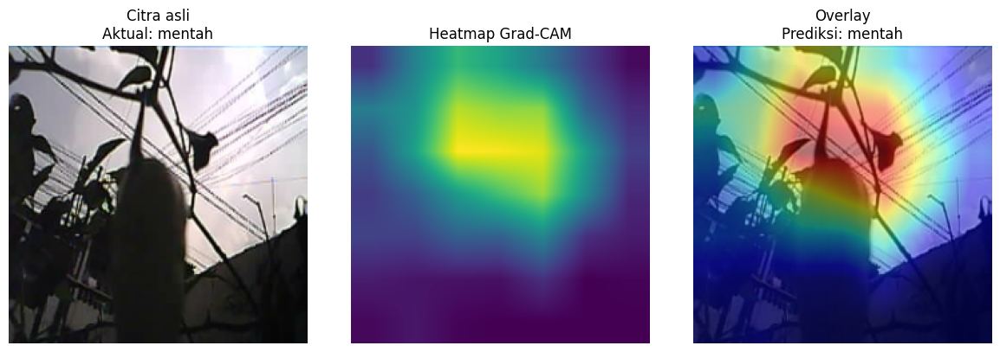

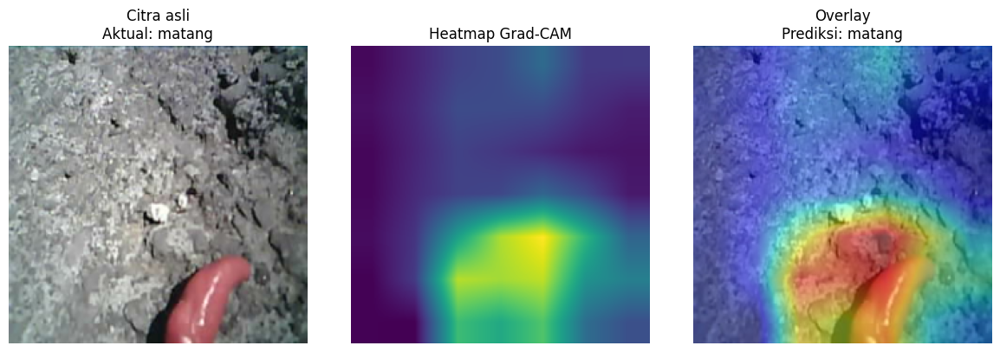

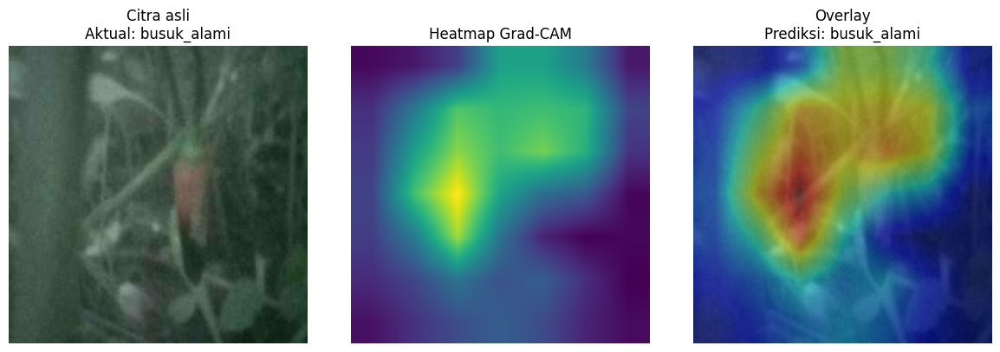

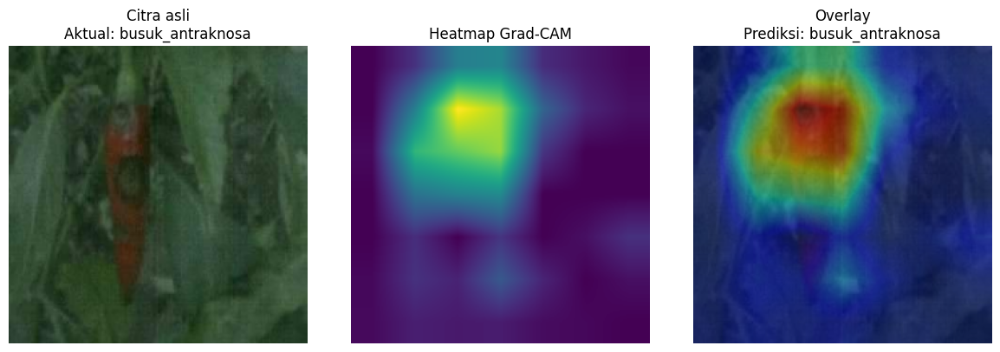

,image_path,actual_label,predicted_label,confidence,gradcam_path
0,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,mentah,0.999901,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
1,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,matang,matang,0.998202,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
2,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_alami,busuk_alami,0.982917,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
3,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_antraknosa,busuk_antraknosa,0.962550,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...


In [ ]:
# ============================================================
# TRACE 8 - GRAD-CAM UNTUK CITRA REPRESENTATIF SETIAP KELAS
# ============================================================

last_conv_layer_name = "out_relu"

if last_conv_layer_name not in {
    layer.name for layer in trace_backbone.layers
}:
    raise ValueError(
        f"Layer {last_conv_layer_name} tidak ditemukan."
    )

last_conv_extractor = tf.keras.Model(
    inputs=trace_backbone.input,
    outputs=trace_backbone.get_layer(
        last_conv_layer_name
    ).output,
)

raw_gradcam_input = tf.keras.Input(
    shape=IMG_SIZE + (3,),
    name="gradcam_raw_input"
)

normalized_gradcam_input = (
    raw_gradcam_input / 127.5
) - 1.0

conv_feature_tensor = last_conv_extractor(
    normalized_gradcam_input
)

gap_tensor = tf.keras.layers.GlobalAveragePooling2D(
    name="gradcam_gap"
)(conv_feature_tensor)

dense_tensor = final_model.get_layer(
    "dense_128"
)(gap_tensor)

dropout_tensor = final_model.get_layer(
    "dropout_0_5"
)(
    dense_tensor,
    training=False
)

probability_tensor = final_model.get_layer(
    "output_softmax"
)(dropout_tensor)

gradcam_model = tf.keras.Model(
    inputs=raw_gradcam_input,
    outputs=[
        conv_feature_tensor,
        probability_tensor,
    ],
)


def make_gradcam_heatmap(
    raw_batch: np.ndarray,
    class_index: int | None = None
):
    raw_tensor = tf.convert_to_tensor(
        raw_batch,
        dtype=tf.float32
    )

    with tf.GradientTape() as tape:
        conv_outputs, probabilities = gradcam_model(
            raw_tensor,
            training=False
        )

        if class_index is None:
            class_index = int(
                tf.argmax(
                    probabilities[0]
                ).numpy()
            )

        class_score = probabilities[
            :,
            class_index,
        ]

    gradients = tape.gradient(
        class_score,
        conv_outputs
    )

    pooled_gradients = tf.reduce_mean(
        gradients,
        axis=(0, 1, 2)
    )

    weighted_features = (
        conv_outputs[0]
        * pooled_gradients
    )

    heatmap = tf.reduce_sum(
        weighted_features,
        axis=-1
    )

    heatmap = tf.maximum(
        heatmap,
        0
    )

    maximum_value = tf.reduce_max(
        heatmap
    )

    heatmap = tf.where(
        maximum_value > 0,
        heatmap / maximum_value,
        heatmap,
    )

    return (
        heatmap.numpy(),
        probabilities.numpy()[0],
        class_index,
    )


gradcam_summary_rows = []

for _, row in representative_df.iterrows():
    image_path = Path(row["image_path"])
    actual_label = str(row["actual_label"])

    raw_batch = load_raw_image_batch(
        image_path
    )

    heatmap, probabilities, predicted_index = (
        make_gradcam_heatmap(
            raw_batch,
            class_index=None
        )
    )

    original_image = np.clip(
        raw_batch[0],
        0,
        255
    ).astype(np.uint8)

    resized_heatmap = tf.image.resize(
        heatmap[..., np.newaxis],
        IMG_SIZE,
    ).numpy()[..., 0]

    fig, axes = plt.subplots(
        1,
        3,
        figsize=(12, 4)
    )

    axes[0].imshow(original_image)
    axes[0].set_title(
        f"Citra asli\nAktual: {actual_label}"
    )
    axes[0].axis("off")

    axes[1].imshow(
        resized_heatmap
    )
    axes[1].set_title("Heatmap Grad-CAM")
    axes[1].axis("off")

    axes[2].imshow(original_image)
    axes[2].imshow(
        resized_heatmap,
        alpha=0.45,
        cmap="jet",
    )
    axes[2].set_title(
        "Overlay\n"
        f"Prediksi: {CLASS_NAMES[predicted_index]}"
    )
    axes[2].axis("off")

    plt.tight_layout()

    output_path = (
        TRACE_DIR
        / f"gradcam_{actual_label}.png"
    )

    plt.savefig(
        output_path,
        dpi=180,
        bbox_inches="tight"
    )
    plt.show()

    gradcam_summary_rows.append({
        "image_path": str(image_path),
        "actual_label": actual_label,
        "predicted_label": CLASS_NAMES[
            predicted_index
        ],
        "confidence": float(
            probabilities[predicted_index]
        ),
        "gradcam_path": str(output_path),
    })


gradcam_summary_df = pd.DataFrame(
    gradcam_summary_rows
)

gradcam_summary_df.to_csv(
    TRACE_DIR / "gradcam_summary.csv",
    index=False
)

display(gradcam_summary_df)

## Visualisasi perkembangan feature map

Grad-CAM menunjukkan area perhatian model, sedangkan visualisasi berikut menunjukkan perubahan aktivasi pada layer awal, tengah, dan akhir MobileNetV2. Visualisasi ini tidak merupakan bounding box dan tidak mengubah tugas model menjadi object detection.

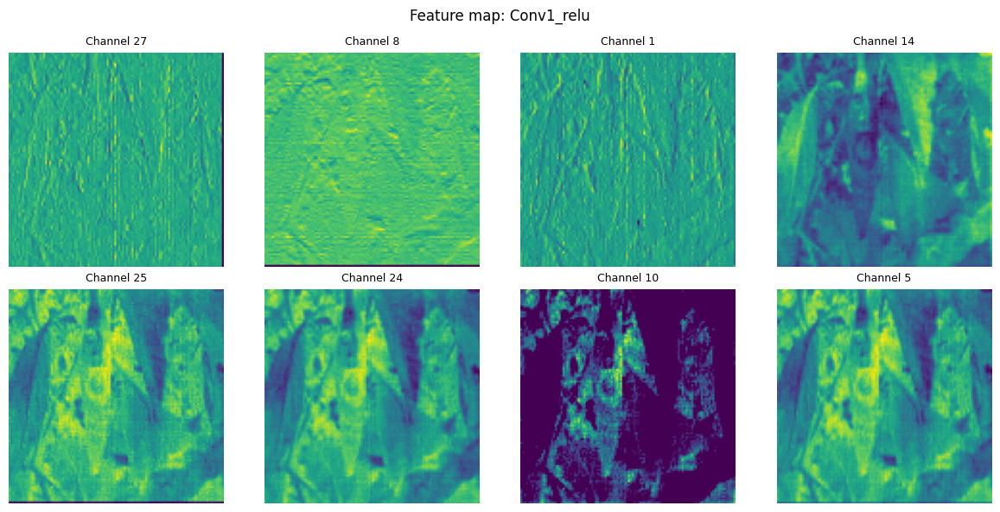

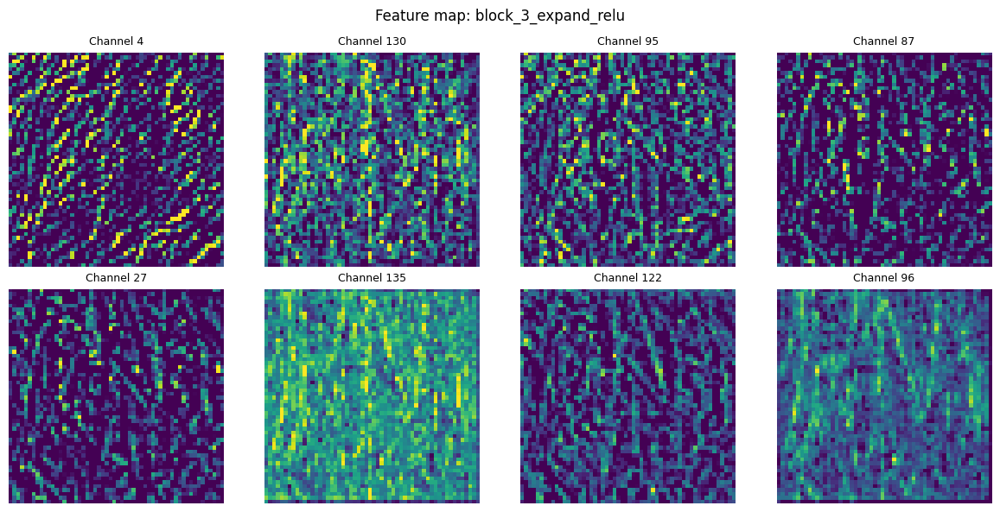

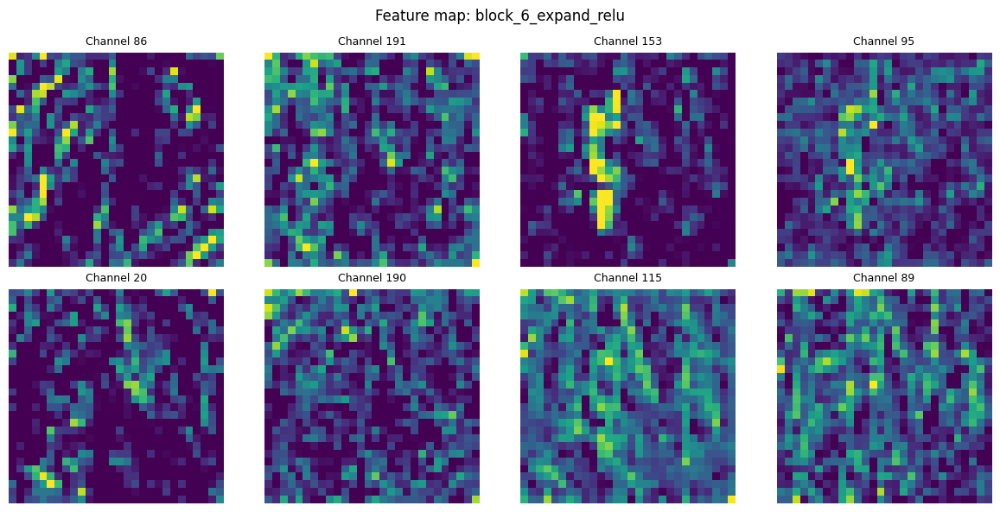

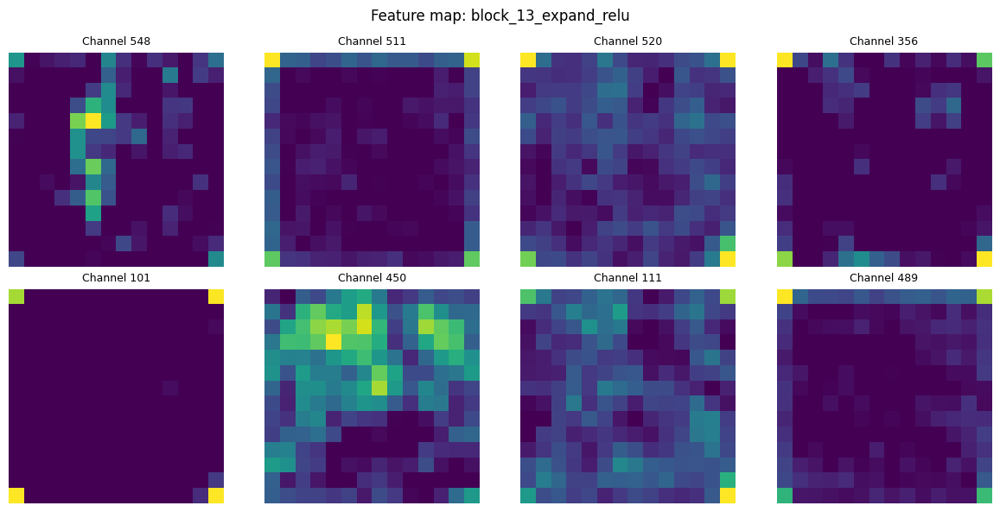

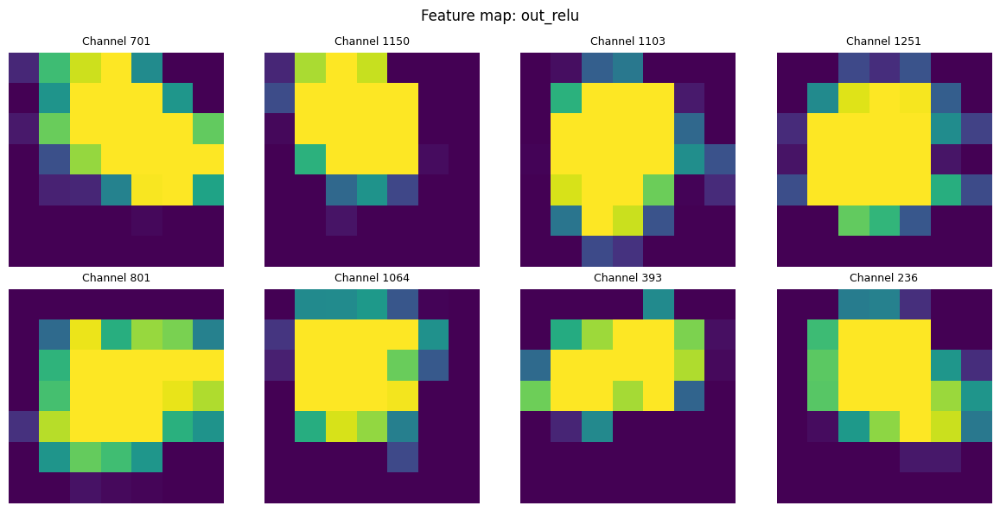

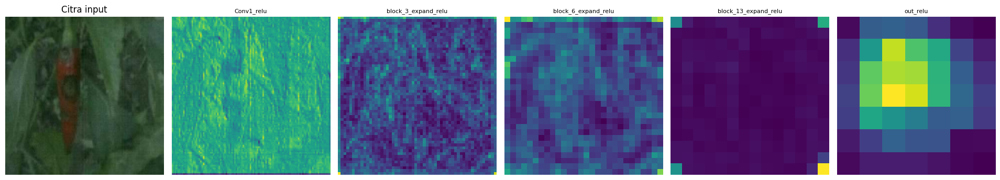

,layer_name,output_shape,height,width,channels,activation_min,activation_max,activation_mean,activation_std,selected_channels,figure_path
0,Conv1_relu,"(1, 112, 112, 32)",112,112,32,0.0,5.65452,1.636512,1.671553,"27, 8, 1, 14, 25, 24, 10, 5",/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
1,block_3_expand_relu,"(1, 56, 56, 144)",56,56,144,0.0,6.00000,0.784970,0.953099,"4, 130, 95, 87, 27, 135, 122, 96",/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
2,block_6_expand_relu,"(1, 28, 28, 192)",28,28,192,0.0,6.00000,0.512992,0.738517,"86, 191, 153, 95, 20, 190, 115, 89",/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
3,block_13_expand_relu,"(1, 14, 14, 576)",14,14,576,0.0,6.00000,0.240313,0.527584,"548, 511, 520, 356, 101, 450, 111, 489",/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
4,out_relu,"(1, 7, 7, 1280)",7,7,1280,0.0,6.00000,0.466503,1.238641,"701, 1150, 1103, 1251, 801, 1064, 393, 236",/content/drive/MyDrive/Skripsi_SmartFarming_Ca...


Visualisasi perkembangan feature map: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/mathematical_trace/feature_maps/feature_map_progression.png


In [ ]:
# ============================================================
# TRACE 8B - VISUALISASI FEATURE MAP AWAL, TENGAH, DAN AKHIR
# ============================================================

FEATURE_MAP_DIR = (
    TRACE_DIR
    / "feature_maps"
)

FEATURE_MAP_DIR.mkdir(
    parents=True,
    exist_ok=True
)

candidate_feature_layers = [
    "Conv1_relu",
    "block_3_expand_relu",
    "block_6_expand_relu",
    "block_13_expand_relu",
    "out_relu",
]

available_layer_names = {
    layer.name
    for layer in trace_backbone.layers
}

feature_layer_names = [
    layer_name
    for layer_name in candidate_feature_layers
    if layer_name in available_layer_names
]

if not feature_layer_names:
    raise ValueError(
        "Tidak ada layer feature map yang ditemukan."
    )

feature_map_model = tf.keras.Model(
    inputs=trace_backbone.input,
    outputs=[
        trace_backbone.get_layer(
            layer_name
        ).output
        for layer_name in feature_layer_names
    ],
    name="feature_map_visualization_model"
)

feature_outputs = feature_map_model(
    normalized_trace_batch,
    training=False
)

if not isinstance(
    feature_outputs,
    (list, tuple)
):
    feature_outputs = [
        feature_outputs
    ]

feature_map_summary_rows = []
progression_maps = []


def normalize_for_display(
    array: np.ndarray
) -> np.ndarray:
    minimum = float(
        np.min(array)
    )
    maximum = float(
        np.max(array)
    )

    if (
        maximum
        - minimum
        < 1e-12
    ):
        return np.zeros_like(
            array,
            dtype=np.float32
        )

    return (
        (array - minimum)
        / (maximum - minimum)
    ).astype(np.float32)


for layer_name, tensor in zip(
    feature_layer_names,
    feature_outputs
):
    feature_array = tensor.numpy()

    if feature_array.ndim != 4:
        continue

    one_feature_map = feature_array[0]

    channel_variances = np.var(
        one_feature_map,
        axis=(0, 1)
    )

    channel_count = min(
        FEATURE_MAP_CHANNELS_PER_LAYER,
        one_feature_map.shape[-1]
    )

    selected_channels = np.argsort(
        channel_variances
    )[-channel_count:][::-1]

    columns = 4
    rows = int(
        np.ceil(
            channel_count / columns
        )
    )

    fig, axes = plt.subplots(
        rows,
        columns,
        figsize=(
            columns * 3,
            rows * 3
        )
    )

    axes_array = np.atleast_1d(
        axes
    ).reshape(-1)

    for plot_index, channel_index in enumerate(
        selected_channels
    ):
        activation_map = (
            one_feature_map[
                :,
                :,
                channel_index,
            ]
        )

        axes_array[
            plot_index
        ].imshow(
            normalize_for_display(
                activation_map
            ),
            cmap="viridis"
        )

        axes_array[
            plot_index
        ].set_title(
            f"Channel {int(channel_index)}",
            fontsize=9
        )

        axes_array[
            plot_index
        ].axis("off")

    for remaining_axis in axes_array[
        channel_count:
    ]:
        remaining_axis.axis("off")

    fig.suptitle(
        f"Feature map: {layer_name}",
        fontsize=12
    )

    plt.tight_layout()

    output_path = (
        FEATURE_MAP_DIR
        / f"{layer_name}_top_channels.png"
    )

    plt.savefig(
        output_path,
        dpi=180,
        bbox_inches="tight"
    )

    plt.show()

    mean_absolute_map = np.mean(
        np.abs(one_feature_map),
        axis=-1
    )

    progression_maps.append(
        (
            layer_name,
            normalize_for_display(
                mean_absolute_map
            )
        )
    )

    feature_map_summary_rows.append({
        "layer_name": layer_name,
        "output_shape": str(
            feature_array.shape
        ),
        "height": int(
            feature_array.shape[1]
        ),
        "width": int(
            feature_array.shape[2]
        ),
        "channels": int(
            feature_array.shape[3]
        ),
        "activation_min": float(
            feature_array.min()
        ),
        "activation_max": float(
            feature_array.max()
        ),
        "activation_mean": float(
            feature_array.mean()
        ),
        "activation_std": float(
            feature_array.std()
        ),
        "selected_channels": (
            ", ".join(
                str(int(value))
                for value in selected_channels
            )
        ),
        "figure_path": str(
            output_path
        ),
    })

# ------------------------------------------------------------
# Gambar perkembangan rata-rata aktivasi
# ------------------------------------------------------------
figure_columns = (
    len(progression_maps)
    + 1
)

fig, axes = plt.subplots(
    1,
    figure_columns,
    figsize=(
        figure_columns * 3.2,
        3.5
    )
)

axes = np.atleast_1d(
    axes
)

axes[0].imshow(
    raw_trace_batch[0].astype(
        np.uint8
    )
)

axes[0].set_title(
    "Citra input"
)

axes[0].axis("off")

for axis_index, (
    layer_name,
    activation_map,
) in enumerate(
    progression_maps,
    start=1
):
    axes[
        axis_index
    ].imshow(
        activation_map,
        cmap="viridis"
    )

    axes[
        axis_index
    ].set_title(
        layer_name,
        fontsize=8
    )

    axes[
        axis_index
    ].axis("off")

plt.tight_layout()

progression_path = (
    FEATURE_MAP_DIR
    / "feature_map_progression.png"
)

plt.savefig(
    progression_path,
    dpi=180,
    bbox_inches="tight"
)

plt.show()

feature_map_summary_df = pd.DataFrame(
    feature_map_summary_rows
)

feature_map_summary_df.to_csv(
    FEATURE_MAP_DIR
    / "feature_map_summary.csv",
    index=False
)

display(feature_map_summary_df)

print(
    "Visualisasi perkembangan feature map:",
    progression_path
)


In [ ]:
# ============================================================
# TRACE 9 - RINGKASAN VERIFIKASI DAN DAFTAR OUTPUT BAB IV
# ============================================================

verification_frames = [
    (
        "normalisasi",
        float(
            normalization_df[
                "selisih_absolut"
            ].max()
        ),
    ),
    (
        "conv1",
        float(
            conv_verification_df[
                "selisih_absolut"
            ].max()
        ),
    ),
    (
        "batch_normalization",
        float(
            bn_verification_df[
                "selisih_absolut"
            ].max()
        ),
    ),
    (
        "relu6",
        float(
            relu6_verification_df[
                "selisih_absolut"
            ].max()
        ),
    ),
    (
        "expansion_1x1",
        float(
            expand_summary_df[
                "absolute_difference"
            ].max()
        ),
    ),
    (
        "depthwise_3x3",
        float(
            depthwise_summary_df[
                "absolute_difference"
            ].max()
        ),
    ),
    (
        "pointwise_1x1",
        float(
            project_summary_df[
                "absolute_difference"
            ].max()
        ),
    ),
    (
        "residual_connection",
        float(
            residual_verification_df[
                "absolute_difference"
            ].max()
        ),
    ),
    (
        "global_average_pooling",
        float(
            gap_summary_df[
                "selisih_absolut"
            ].max()
        ),
    ),
    (
        "dense_relu",
        float(
            dense_summary_df[
                "absolute_difference"
            ].max()
        ),
    ),
    (
        "softmax",
        float(
            softmax_verification_df[
                "absolute_difference"
            ].max()
        ),
    ),
    (
        "cross_entropy",
        float(
            cross_entropy_df[
                "absolute_difference"
            ].max()
        ),
    ),
]

trace_verification_summary_df = pd.DataFrame(
    verification_frames,
    columns=[
        "operasi",
        "maximum_absolute_difference",
    ],
)

trace_verification_summary_df[
    "tolerance"
] = TRACE_TOLERANCE

trace_verification_summary_df[
    "status"
] = np.where(
    trace_verification_summary_df[
        "maximum_absolute_difference"
    ] <= TRACE_TOLERANCE,
    "SESUAI",
    "PERIKSA_PEMBULATAN",
)

trace_verification_summary_df.to_csv(
    TRACE_DIR / "trace_verification_summary.csv",
    index=False
)

output_rows = []

for output_path in sorted(
    TRACE_DIR.glob("*")
):
    output_rows.append({
        "file_name": output_path.name,
        "path": str(output_path),
        "size_bytes": (
            output_path.stat().st_size
            if output_path.is_file()
            else None
        ),
    })

trace_output_index_df = pd.DataFrame(
    output_rows
)

trace_output_index_df.to_csv(
    TRACE_DIR / "trace_output_index.csv",
    index=False
)

display(trace_verification_summary_df)
display(trace_output_index_df)

print(
    "Seluruh output proses matematis Bab IV tersimpan di:",
    TRACE_DIR,
)

,operasi,maximum_absolute_difference,tolerance,status
0,normalisasi,8.882261e-09,0.00001,SESUAI
1,conv1,1.192093e-07,0.00001,SESUAI
2,batch_normalization,1.192093e-07,0.00001,SESUAI
3,relu6,0.000000e+00,0.00001,SESUAI
4,expansion_1x1,2.744317e-08,0.00001,SESUAI
5,depthwise_3x3,2.097918e-07,0.00001,SESUAI
6,pointwise_1x1,5.864652e-07,0.00001,SESUAI
7,residual_connection,0.000000e+00,0.00001,SESUAI
8,global_average_pooling,1.187227e-06,0.00001,SESUAI
9,dense_relu,0.000000e+00,0.00001,SESUAI


,file_name,path,size_bytes
0,best_vs_final_model_consistency.csv,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,110.0
1,dropout_inference_verification.csv,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,131.0
2,feature_maps,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,NaN
3,four_class_process_summary.csv,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,1903.0
4,gradcam_busuk_alami.png,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,674413.0
5,gradcam_busuk_antraknosa.png,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,686727.0
6,gradcam_matang.png,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,1014125.0
7,gradcam_mentah.png,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,924926.0
8,gradcam_summary.csv,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,1223.0
9,layer_inventory_full.csv,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,10232.0


Seluruh output proses matematis Bab IV tersimpan di: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/mathematical_trace


---

# CELL 22 — Fungsi inferensi citra tunggal

Untuk citra dari ESP32-CAM yang sudah disimpan ke Google Drive.

In [ ]:
# ============================================================
# CELL 22 - INFERENSI CITRA TUNGGAL DENGAN TIMING TERPISAH
# ============================================================

inference_model = tf.keras.models.load_model(
    str(keras_final_path),
    compile=False
)


def predict_image(
    image_path: Path,
    model=inference_model
):
    end_to_end_start = time.perf_counter()

    load_start = time.perf_counter()

    image_batch = load_image_consistent(
        image_path,
        add_batch_dimension=True
    )

    load_resize_ms = (
        time.perf_counter()
        - load_start
    ) * 1000

    model_start = time.perf_counter()

    probabilities = model(
        image_batch,
        training=False
    ).numpy()[0]

    model_inference_ms = (
        time.perf_counter()
        - model_start
    ) * 1000

    end_to_end_ms = (
        time.perf_counter()
        - end_to_end_start
    ) * 1000

    predicted_index = int(
        np.argmax(probabilities)
    )

    confidence = float(
        probabilities[predicted_index]
    )

    return {
        "timestamp": datetime.now().isoformat(
            timespec="seconds"
        ),
        "image_path": str(image_path),
        "predicted_label": CLASS_NAMES[
            predicted_index
        ],
        "confidence": confidence,
        "load_resize_ms": round(
            load_resize_ms,
            6
        ),
        "model_inference_ms": round(
            model_inference_ms,
            6
        ),
        "end_to_end_ms": round(
            end_to_end_ms,
            6
        ),
        # Alias kompatibilitas dengan cell lama.
        "latency_ms": round(
            end_to_end_ms,
            6
        ),
        "status": (
            "ok"
            if confidence >= MIN_CONFIDENCE
            else "low_confidence"
        ),
        "probabilities": {
            CLASS_NAMES[index]: float(
                probabilities[index]
            )
            for index in range(
                NUM_CLASSES
            )
        },
    }


print("Fungsi predict_image siap digunakan.")


Fungsi predict_image siap digunakan.


---

# CELL 23 — Batch inference dari folder `iot_capture/inbox`

Output:

```text
predictions_log.csv
iot_cnn_result.json
```

In [ ]:
# ============================================================
# CELL 23 - BATCH INFERENCE DARI FOLDER IOT_CAPTURE/INBOX
# Untuk Bab 4.7 Hasil Integrasi IoT-CNN
# ============================================================
import math
import numpy as np
import pandas as pd
import tensorflow as tf

def batch_predict_folder(input_dir: Path):
    rows = []
    image_paths = list_image_files(input_dir)

    print("Jumlah citra untuk inferensi:", len(image_paths))

    for image_path in image_paths:
        try:
            result = predict_image(image_path)
            rows.append(result)
        except Exception as e:
            rows.append({
                "timestamp": datetime.now().isoformat(timespec="seconds"),
                "image_path": str(image_path),
                "predicted_label": None,
                "confidence": None,
                "latency_ms": None,
                "status": "inference_failed",
                "error": str(e),
                "probabilities": None
            })

    predictions_df = pd.DataFrame(rows)

    out_csv = REPORT_DIR / "predictions_log.csv"
    predictions_df.to_csv(out_csv, index=False)

    if len(rows) > 0:
        with open(REPORT_DIR / "iot_cnn_result.json", "w", encoding="utf-8") as f:
            json.dump(rows[-1], f, indent=2, ensure_ascii=False)

    print("Log prediksi disimpan ke:", out_csv)

    return predictions_df

predictions_df = batch_predict_folder(IOT_INBOX_DIR)
display(predictions_df.head())

Jumlah citra untuk inferensi: 314
Log prediksi disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/predictions_log.csv


,timestamp,image_path,predicted_label,confidence,load_resize_ms,model_inference_ms,end_to_end_ms,latency_ms,status,probabilities
0,2026-07-17T09:18:02,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.999847,8.482318,290.067057,298.555676,298.555676,ok,"{'mentah': 0.9998469352722168, 'matang': 0.000..."
1,2026-07-17T09:18:02,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.999814,7.398269,180.938338,188.340837,188.340837,ok,"{'mentah': 0.999813973903656, 'matang': 0.0001..."
2,2026-07-17T09:18:02,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.999653,4.560450,179.405438,183.968827,183.968827,ok,"{'mentah': 0.9996532201766968, 'matang': 0.000..."
3,2026-07-17T09:18:03,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.999990,5.510509,479.767505,485.283844,485.283844,ok,"{'mentah': 0.9999904632568359, 'matang': 8.511..."
4,2026-07-17T09:18:03,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.999823,576.712137,209.037563,785.754760,785.754760,ok,"{'mentah': 0.9998226761817932, 'matang': 7.394..."


---

# CELL 24 — Visualisasi hasil prediksi batch

Output:

```text
prediction_distribution_bar.png
```

,predicted_label,jumlah
0,busuk_antraknosa,130
1,busuk_alami,100
2,matang,55
3,mentah,29


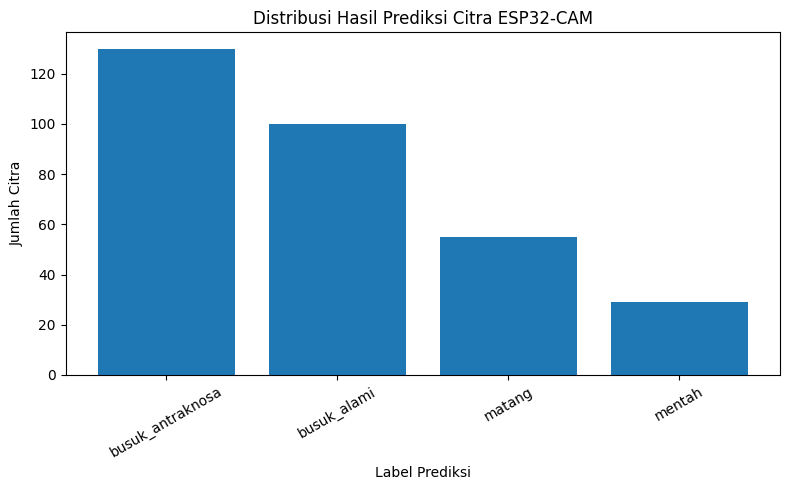

Visualisasi hasil prediksi disimpan ke: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/prediction_distribution_bar.png


In [ ]:
# ============================================================
# CELL 24 - VISUALISASI HASIL PREDIKSI BATCH
# Untuk Bab 4.7
# ============================================================

if "predictions_df" in globals() and len(predictions_df) > 0:
    pred_count = (
        predictions_df["predicted_label"]
        .fillna("gagal")
        .value_counts()
        .reset_index()
    )

    pred_count.columns = ["predicted_label", "jumlah"]

    display(pred_count)

    plt.figure(figsize=(8, 5))
    plt.bar(pred_count["predicted_label"], pred_count["jumlah"])
    plt.xlabel("Label Prediksi")
    plt.ylabel("Jumlah Citra")
    plt.title("Distribusi Hasil Prediksi Citra ESP32-CAM")
    plt.xticks(rotation=30)
    plt.tight_layout()

    out_path = REPORT_DIR / "prediction_distribution_bar.png"
    plt.savefig(out_path, dpi=160, bbox_inches="tight")
    plt.show()

    print("Visualisasi hasil prediksi disimpan ke:", out_path)
else:
    print("Belum ada hasil prediksi batch.")

---

# CELL 25 — Pengujian latency inferensi

Output:

```text
inference_latency.csv
inference_latency_summary.csv
```

In [ ]:
# ============================================================
# CELL 25 - PENGUJIAN LATENCY DENGAN WARM-UP
# ============================================================

LATENCY_WARMUP_RUNS = 10


def summarize_latency_series(
    series: pd.Series,
    prefix: str
) -> dict:
    clean = pd.to_numeric(
        series,
        errors="coerce"
    ).dropna()

    if clean.empty:
        return {
            f"{prefix}_mean_ms": None,
            f"{prefix}_std_ms": None,
            f"{prefix}_median_ms": None,
            f"{prefix}_min_ms": None,
            f"{prefix}_p90_ms": None,
            f"{prefix}_p95_ms": None,
            f"{prefix}_p99_ms": None,
            f"{prefix}_max_ms": None,
        }

    return {
        f"{prefix}_mean_ms": float(
            clean.mean()
        ),
        f"{prefix}_std_ms": float(
            clean.std(ddof=1)
        ),
        f"{prefix}_median_ms": float(
            clean.median()
        ),
        f"{prefix}_min_ms": float(
            clean.min()
        ),
        f"{prefix}_p90_ms": float(
            clean.quantile(0.90)
        ),
        f"{prefix}_p95_ms": float(
            clean.quantile(0.95)
        ),
        f"{prefix}_p99_ms": float(
            clean.quantile(0.99)
        ),
        f"{prefix}_max_ms": float(
            clean.max()
        ),
    }


def measure_inference_latency(
    input_dir: Path,
    repeat_per_image: int = 1
):
    image_paths = list_image_files(
        input_dir
    )

    if not image_paths:
        raise ValueError(
            f"Tidak ada citra pada folder: {input_dir}"
        )

    # Warm-up model tidak dimasukkan ke hasil.
    warmup_batch = load_image_consistent(
        image_paths[0],
        add_batch_dimension=True
    )

    for _ in range(
        LATENCY_WARMUP_RUNS
    ):
        _ = inference_model(
            warmup_batch,
            training=False
        ).numpy()

    rows = []

    for image_path in image_paths:
        for repeat_index in range(
            repeat_per_image
        ):
            try:
                result = predict_image(
                    image_path
                )

                rows.append({
                    "timestamp": result["timestamp"],
                    "image_path": result["image_path"],
                    "repeat": repeat_index + 1,
                    "predicted_label": result[
                        "predicted_label"
                    ],
                    "confidence": result[
                        "confidence"
                    ],
                    "load_resize_ms": result[
                        "load_resize_ms"
                    ],
                    "model_inference_ms": result[
                        "model_inference_ms"
                    ],
                    "end_to_end_ms": result[
                        "end_to_end_ms"
                    ],
                    "status": result["status"],
                })

            except Exception as error:
                rows.append({
                    "timestamp": datetime.now().isoformat(
                        timespec="seconds"
                    ),
                    "image_path": str(image_path),
                    "repeat": repeat_index + 1,
                    "predicted_label": None,
                    "confidence": None,
                    "load_resize_ms": None,
                    "model_inference_ms": None,
                    "end_to_end_ms": None,
                    "status": "failed",
                    "error": str(error),
                })

    latency_dataframe = pd.DataFrame(
        rows
    )

    latency_dataframe.to_csv(
        REPORT_DIR / "inference_latency.csv",
        index=False
    )

    successful = latency_dataframe[
        latency_dataframe["status"]
        != "failed"
    ].copy()

    summary = {
        "warmup_runs": LATENCY_WARMUP_RUNS,
        "total_images": len(image_paths),
        "repeat_per_image": repeat_per_image,
        "total_tests": len(
            latency_dataframe
        ),
        "success_tests": len(
            successful
        ),
        "failed_tests": int(
            (
                latency_dataframe["status"]
                == "failed"
            ).sum()
        ),
    }

    summary.update(
        summarize_latency_series(
            successful["load_resize_ms"],
            "load_resize"
        )
    )

    summary.update(
        summarize_latency_series(
            successful["model_inference_ms"],
            "model_inference"
        )
    )

    summary.update(
        summarize_latency_series(
            successful["end_to_end_ms"],
            "end_to_end"
        )
    )

    mean_model_latency = summary[
        "model_inference_mean_ms"
    ]

    summary[
        "model_throughput_images_per_second"
    ] = (
        1000.0 / mean_model_latency
        if mean_model_latency
        else None
    )

    summary_df = pd.DataFrame([
        summary
    ])

    summary_df.to_csv(
        REPORT_DIR
        / "inference_latency_summary.csv",
        index=False
    )

    display(summary_df)

    return latency_dataframe, summary_df


latency_df, latency_summary_df = (
    measure_inference_latency(
        IOT_INBOX_DIR,
        repeat_per_image=1
    )
)

display(latency_df.head())


,warmup_runs,total_images,repeat_per_image,total_tests,success_tests,failed_tests,load_resize_mean_ms,load_resize_std_ms,load_resize_median_ms,load_resize_min_ms,...,model_inference_max_ms,end_to_end_mean_ms,end_to_end_std_ms,end_to_end_median_ms,end_to_end_min_ms,end_to_end_p90_ms,end_to_end_p95_ms,end_to_end_p99_ms,end_to_end_max_ms,model_throughput_images_per_second
0,10,364,1,364,364,0,12.915259,85.725626,5.556589,4.292659,...,509.2633,227.374091,104.879818,206.204459,172.646799,297.354985,319.330443,376.063206,1887.790255,4.663003


,timestamp,image_path,repeat,predicted_label,confidence,load_resize_ms,model_inference_ms,end_to_end_ms,status
0,2026-07-17T09:21:40,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,1,mentah,0.999972,5.843839,214.974642,220.823671,ok
1,2026-07-17T09:21:41,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,1,mentah,0.999986,439.657313,219.104120,658.765923,ok
2,2026-07-17T09:21:41,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,1,mentah,1.000000,163.618603,204.038442,367.662365,ok
3,2026-07-17T09:21:42,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,1,mentah,0.999999,374.911332,509.263300,884.181942,ok
4,2026-07-17T09:21:44,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,1,mentah,0.999998,1533.743528,354.040287,1887.790255,ok


In [ ]:
# ============================================================
# CELL TAMBAHAN - PERBANDINGAN DENGAN PENILAIAN MANUAL DINONAKTIFKAN
# ============================================================
#
# Bagian ini sengaja tidak menghasilkan angka pembanding manual.
# Perbandingan hanya boleh dijalankan jika tersedia:
# 1. data pengamat yang sebenarnya;
# 2. waktu stopwatch setiap sampel;
# 3. label setiap pengamat;
# 4. prosedur pengujian yang terdokumentasi.
#
# Angka contoh tidak boleh dimasukkan ke Bab IV.

RUN_MANUAL_COMPARISON = False

if RUN_MANUAL_COMPARISON:
    raise NotImplementedError(
        "Masukkan data pengujian manual yang nyata terlebih dahulu. "
        "Jangan menggunakan angka contoh."
    )
else:
    print(
        "Perbandingan manual dinonaktifkan. "
        "Bab IV difokuskan pada performa model dan reliabilitas sistem."
    )

Perbandingan manual dinonaktifkan. Bab IV difokuskan pada performa model dan reliabilitas sistem.


---

# CELL 26 — Visualisasi latency inferensi

Output:

```text
inference_latency_plot.png
```

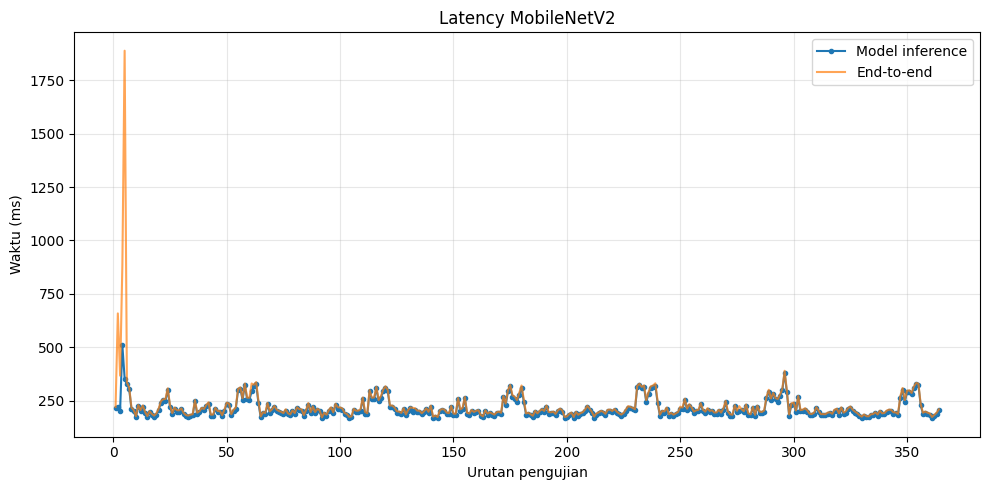

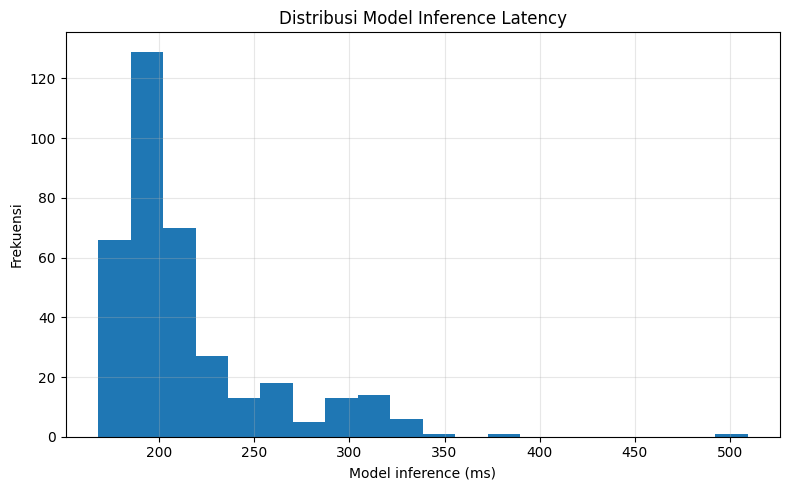

,urutan_pengujian,image_path,predicted_label,confidence,load_resize_ms,model_inference_ms,end_to_end_ms,status
4,5,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.999998,1533.743528,354.040287,1887.790255,ok
3,4,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.999999,374.911332,509.263300,884.181942,ok
1,2,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.999986,439.657313,219.104120,658.765923,ok
295,296,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_antraknosa,0.676582,8.157448,382.203823,390.367341,low_confidence
2,3,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,1.000000,163.618603,204.038442,367.662365,ok
62,63,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.999682,10.301349,327.122932,337.429490,ok
5,6,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.998993,8.839039,326.901702,335.746701,ok
353,354,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_antraknosa,0.992958,6.458029,327.211022,333.674521,ok
238,239,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,busuk_alami,0.528275,10.705688,321.102873,331.814031,low_confidence
60,61,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,mentah,0.997361,36.970863,293.746287,330.752811,ok


Grafik latency: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/inference_latency_plot.png
Histogram     : /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/inference_latency_histogram.png


In [ ]:
# ============================================================
# CELL 26 - VISUALISASI DISTRIBUSI LATENCY DAN OUTLIER
# ============================================================

if "latency_df" not in globals():
    raise RuntimeError(
        "latency_df belum tersedia. Jalankan CELL 25."
    )

latency_ok = latency_df[
    latency_df["status"] != "failed"
].reset_index(drop=True)

if latency_ok.empty:
    raise ValueError(
        "Tidak ada data latency yang valid."
    )

latency_ok["urutan_pengujian"] = (
    latency_ok.index + 1
)

# Grafik urutan model inference.
plt.figure(figsize=(10, 5))
plt.plot(
    latency_ok["urutan_pengujian"],
    latency_ok["model_inference_ms"],
    marker="o",
    markersize=3,
    label="Model inference"
)
plt.plot(
    latency_ok["urutan_pengujian"],
    latency_ok["end_to_end_ms"],
    alpha=0.7,
    label="End-to-end"
)
plt.xlabel("Urutan pengujian")
plt.ylabel("Waktu (ms)")
plt.title("Latency MobileNetV2")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()

latency_plot_path = (
    REPORT_DIR
    / "inference_latency_plot.png"
)

plt.savefig(
    latency_plot_path,
    dpi=180,
    bbox_inches="tight"
)
plt.show()

# Histogram model inference.
plt.figure(figsize=(8, 5))
plt.hist(
    latency_ok["model_inference_ms"],
    bins=20
)
plt.xlabel("Model inference (ms)")
plt.ylabel("Frekuensi")
plt.title("Distribusi Model Inference Latency")
plt.grid(True, alpha=0.3)
plt.tight_layout()

histogram_path = (
    REPORT_DIR
    / "inference_latency_histogram.png"
)

plt.savefig(
    histogram_path,
    dpi=180,
    bbox_inches="tight"
)
plt.show()

latency_outliers_df = (
    latency_ok
    .sort_values(
        "end_to_end_ms",
        ascending=False
    )
    .head(10)
)

latency_outliers_df.to_csv(
    REPORT_DIR
    / "inference_latency_top10.csv",
    index=False
)

display(
    latency_outliers_df[
        [
            "urutan_pengujian",
            "image_path",
            "predicted_label",
            "confidence",
            "load_resize_ms",
            "model_inference_ms",
            "end_to_end_ms",
            "status",
        ]
    ]
)

print("Grafik latency:", latency_plot_path)
print("Histogram     :", histogram_path)


---

# CELL 27 — Membaca master capture metrics dari ESP32-CAM

Cell ini dipakai kalau kamu sudah upload file:

```text
master_capture_metrics.xlsx
```

ke folder:

```text
Skripsi_SmartFarming_Cabai/iot_capture/logs/
```

Output:

```text
capture_metrics_summary_from_master.csv
capture_latency_plot.png
capture_status_distribution.png
```

,source_file,source_sheet,start_timestamp,end_timestamp,total_records,success_count,error_count,success_rate,error_rate,deadline_success_count_all_requests,...,save_seconds_p99,save_seconds_max,interval_seconds_mean,interval_seconds_std,interval_seconds_min,interval_seconds_median,interval_seconds_p90,interval_seconds_p95,interval_seconds_p99,interval_seconds_max
0,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,detail_all_sessions,None,None,1267,804,463,0.63457,0.36543,786,...,10.463228,16.973081,17.153163,3.099816,15.04609,15.797415,19.263565,20.933547,35.026113,41.754067


,error_category,jumlah,persentase_dari_seluruh_error
0,HTTP 500,368,0.794816
1,Lainnya,34,0.073434
2,Timeout,30,0.064795
3,Host unreachable,27,0.058315
4,Incomplete read,4,0.008639


,session_id,total_request,success_count,error_count,success_rate
0,20260426_134725,12,12,0,1.000000
1,20260503_103902,1,1,0,1.000000
2,20260503_104003,2,0,2,0.000000
3,20260503_104232,48,19,29,0.395833
4,20260503_105814,50,13,37,0.260000
5,20260503_112221,50,35,15,0.700000
6,20260503_113719,41,24,17,0.585366
7,20260503_115036,24,16,8,0.666667
8,20260503_121550,50,36,14,0.720000
9,20260503_124246,50,31,19,0.620000


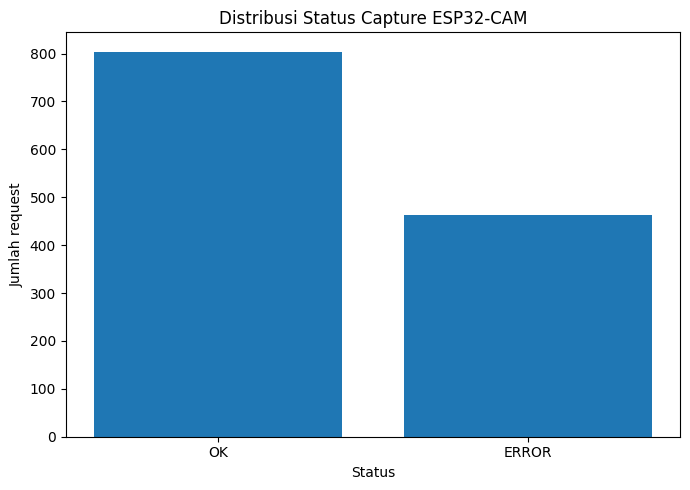

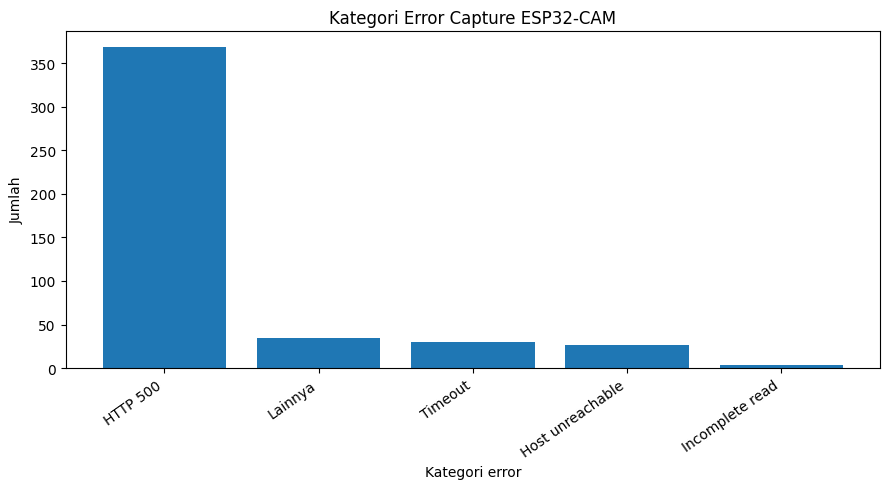

Gunakan hanya angka pada capture_metrics_summary_from_master.csv untuk memperbarui Bab IV.


In [ ]:
# ============================================================
# CELL 27 - ANALISIS MASTER CAPTURE METRICS SECARA LENGKAP
# ============================================================

capture_metrics_path = (
    IOT_LOG_DIR
    / "master_capture_metrics.xlsx"
)


def classify_capture_error(
    row: pd.Series
) -> str:
    text_columns = [
        "error",
        "error_message",
        "message",
        "detail",
        "response",
        "status",
    ]

    text = " ".join(
        str(row[column])
        for column in text_columns
        if (
            column in row.index
            and pd.notna(row[column])
        )
    ).lower()

    if "500" in text or "internal server" in text:
        return "HTTP 500"

    if "timeout" in text or "timed out" in text:
        return "Timeout"

    if (
        "unreachable" in text
        or "no route" in text
    ):
        return "Host unreachable"

    if (
        "connection reset" in text
        or "reset by peer" in text
    ):
        return "Connection reset"

    if (
        "incomplete read" in text
        or "incomplete" in text
    ):
        return "Incomplete read"

    if (
        "save" in text
        or "write" in text
    ):
        return "Gagal simpan"

    return "Lainnya"


def numeric_summary(
    dataframe: pd.DataFrame,
    column_name: str
) -> dict:
    values = pd.to_numeric(
        dataframe[column_name],
        errors="coerce"
    ).dropna()

    if values.empty:
        return {}

    return {
        f"{column_name}_mean": float(
            values.mean()
        ),
        f"{column_name}_std": float(
            values.std(ddof=1)
        ),
        f"{column_name}_min": float(
            values.min()
        ),
        f"{column_name}_median": float(
            values.median()
        ),
        f"{column_name}_p90": float(
            values.quantile(0.90)
        ),
        f"{column_name}_p95": float(
            values.quantile(0.95)
        ),
        f"{column_name}_p99": float(
            values.quantile(0.99)
        ),
        f"{column_name}_max": float(
            values.max()
        ),
    }


if not capture_metrics_path.exists():
    raise FileNotFoundError(
        f"File belum ditemukan: {capture_metrics_path}"
    )

excel_file = pd.ExcelFile(
    capture_metrics_path
)

sheet_name = (
    "detail_all_sessions"
    if "detail_all_sessions"
    in excel_file.sheet_names
    else excel_file.sheet_names[0]
)

capture_df = pd.read_excel(
    capture_metrics_path,
    sheet_name=sheet_name
)

capture_df.columns = [
    str(column).strip()
    for column in capture_df.columns
]

capture_df["status_normalized"] = (
    capture_df["status"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)

success_mask = (
    capture_df["status_normalized"]
    == "OK"
)

error_mask = ~success_mask

capture_df["error_category"] = ""

capture_df.loc[
    error_mask,
    "error_category"
] = capture_df.loc[
    error_mask
].apply(
    classify_capture_error,
    axis=1
)

total_records = len(capture_df)
success_count = int(
    success_mask.sum()
)
error_count = int(
    error_mask.sum()
)

success_rate = (
    success_count / total_records
    if total_records > 0
    else 0.0
)

error_rate = (
    error_count / total_records
    if total_records > 0
    else 0.0
)

# ------------------------------------------------------------
# Rentang waktu log
# ------------------------------------------------------------
timestamp_column = next(
    (
        column
        for column in [
            "timestamp",
            "captured_at",
            "created_at",
            "datetime",
            "time",
        ]
        if column in capture_df.columns
    ),
    None
)

start_timestamp = None
end_timestamp = None

if timestamp_column:
    parsed_timestamp = pd.to_datetime(
        capture_df[timestamp_column],
        errors="coerce"
    )

    if parsed_timestamp.notna().any():
        start_timestamp = str(
            parsed_timestamp.min()
        )
        end_timestamp = str(
            parsed_timestamp.max()
        )

# ------------------------------------------------------------
# Deadline success rate dari seluruh request
# ------------------------------------------------------------
deadline_success_count = None
deadline_success_rate = None

interval_column = next(
    (
        column
        for column in [
            "interval_seconds",
            "interval_actual_seconds",
            "actual_interval_seconds",
        ]
        if column in capture_df.columns
    ),
    None
)

if (
    "save_seconds" in capture_df.columns
    and interval_column is not None
):
    save_seconds = pd.to_numeric(
        capture_df["save_seconds"],
        errors="coerce"
    )

    interval_seconds = pd.to_numeric(
        capture_df[interval_column],
        errors="coerce"
    )

    deadline_success_mask = (
        success_mask
        & save_seconds.notna()
        & interval_seconds.notna()
        & (save_seconds <= interval_seconds)
    )

    deadline_success_count = int(
        deadline_success_mask.sum()
    )

    deadline_success_rate = (
        deadline_success_count
        / total_records
        if total_records > 0
        else 0.0
    )

    summary_interval_column = interval_column
else:
    summary_interval_column = None

summary = {
    "source_file": str(
        capture_metrics_path
    ),
    "source_sheet": sheet_name,
    "start_timestamp": start_timestamp,
    "end_timestamp": end_timestamp,
    "total_records": total_records,
    "success_count": success_count,
    "error_count": error_count,
    "success_rate": success_rate,
    "error_rate": error_rate,
    "deadline_success_count_all_requests": (
        deadline_success_count
    ),
    "deadline_success_rate_all_requests": (
        deadline_success_rate
    ),
    "deadline_interval_column": summary_interval_column,
}

successful_capture_df = capture_df[
    success_mask
].copy()

metric_candidates = [
    "transfer_seconds",
    "save_seconds",
    "interval_seconds",
    "interval_actual_seconds",
    "actual_interval_seconds",
]

for metric_column in metric_candidates:
    if metric_column in capture_df.columns:
        summary.update(
            numeric_summary(
                successful_capture_df,
                metric_column
            )
        )

capture_summary_df = pd.DataFrame([
    summary
])

capture_summary_df.to_csv(
    REPORT_DIR
    / "capture_metrics_summary_from_master.csv",
    index=False
)

error_category_df = (
    capture_df.loc[
        error_mask,
        "error_category"
    ]
    .value_counts(dropna=False)
    .rename_axis("error_category")
    .reset_index(name="jumlah")
)

if not error_category_df.empty:
    error_category_df[
        "persentase_dari_seluruh_error"
    ] = (
        error_category_df["jumlah"]
        / error_count
    )

error_category_df.to_csv(
    REPORT_DIR
    / "capture_error_categories.csv",
    index=False
)

# Ringkasan per sesi apabila kolom tersedia.
session_column = next(
    (
        column
        for column in [
            "session_id",
            "session",
            "capture_session",
        ]
        if column in capture_df.columns
    ),
    None
)

capture_session_summary_df = pd.DataFrame()

if session_column:
    capture_session_summary_df = (
        capture_df
        .groupby(session_column)
        .agg(
            total_request=(
                "status_normalized",
                "size"
            ),
            success_count=(
                "status_normalized",
                lambda values: int(
                    (values == "OK").sum()
                )
            ),
        )
        .reset_index()
    )

    capture_session_summary_df[
        "error_count"
    ] = (
        capture_session_summary_df[
            "total_request"
        ]
        - capture_session_summary_df[
            "success_count"
        ]
    )

    capture_session_summary_df[
        "success_rate"
    ] = (
        capture_session_summary_df[
            "success_count"
        ]
        / capture_session_summary_df[
            "total_request"
        ]
    )

capture_session_summary_df.to_csv(
    REPORT_DIR
    / "capture_session_summary.csv",
    index=False
)

capture_df.to_csv(
    REPORT_DIR
    / "capture_metrics_cleaned.csv",
    index=False
)

display(capture_summary_df)
display(error_category_df)

if not capture_session_summary_df.empty:
    display(
        capture_session_summary_df
    )

# Grafik status.
status_plot_df = pd.DataFrame({
    "status": ["OK", "ERROR"],
    "jumlah": [
        success_count,
        error_count,
    ],
})

plt.figure(figsize=(7, 5))
plt.bar(
    status_plot_df["status"],
    status_plot_df["jumlah"]
)
plt.xlabel("Status")
plt.ylabel("Jumlah request")
plt.title("Distribusi Status Capture ESP32-CAM")
plt.tight_layout()

status_plot_path = (
    REPORT_DIR
    / "capture_status_distribution.png"
)

plt.savefig(
    status_plot_path,
    dpi=180,
    bbox_inches="tight"
)
plt.show()

# Pareto kategori error.
if not error_category_df.empty:
    plt.figure(figsize=(9, 5))
    plt.bar(
        error_category_df[
            "error_category"
        ],
        error_category_df["jumlah"]
    )
    plt.xticks(rotation=35, ha="right")
    plt.xlabel("Kategori error")
    plt.ylabel("Jumlah")
    plt.title("Kategori Error Capture ESP32-CAM")
    plt.tight_layout()

    error_plot_path = (
        REPORT_DIR
        / "capture_error_categories.png"
    )

    plt.savefig(
        error_plot_path,
        dpi=180,
        bbox_inches="tight"
    )
    plt.show()

print(
    "Gunakan hanya angka pada "
    "capture_metrics_summary_from_master.csv "
    "untuk memperbarui Bab IV."
)


---

# CELL 28 — Template pengujian black box

Output:

```text
blackbox_test_template.csv
```

In [ ]:
# ============================================================
# CELL 28 - BLACK-BOX DAN READINESS PIPELINE FINAL
# ============================================================

def add_blackbox_row(
    rows: list,
    test_id: str,
    feature: str,
    expected: str,
    actual: str,
    status: str,
    evidence: Path | str,
):
    rows.append({
        "id_uji": test_id,
        "fitur": feature,
        "hasil_diharapkan": expected,
        "hasil_aktual": actual,
        "status": status,
        "bukti": str(evidence),
    })


blackbox_rows = []

# Dataset raw.
raw_ok = (
    "raw_df" in globals()
    and len(raw_df) == 750
)

add_blackbox_row(
    blackbox_rows,
    "BB-DATA-01",
    "Dataset raw",
    "750 citra terbaca.",
    (
        f"{len(raw_df)} citra terbaca."
        if "raw_df" in globals()
        else "raw_df belum tersedia."
    ),
    "PASS" if raw_ok else "FAIL",
    REPORT_DIR / "dataset_distribution.csv",
)

# Seleksi kualitas.
quality_ok = (
    "valid_df" in globals()
    and "rejected_copy_df" in globals()
    and len(rejected_copy_df) == 76
)

add_blackbox_row(
    blackbox_rows,
    "BB-DATA-02",
    "Seleksi kualitas",
    "Citra layak dan ditolak dapat ditelusuri.",
    (
        f"Data final={len(valid_df)}; "
        f"ditolak={len(rejected_copy_df)}."
        if quality_ok
        else "Output seleksi belum lengkap."
    ),
    "PASS" if quality_ok else "FAIL",
    REPORT_DIR / "tabel_kelayakan_citra_bab4.csv",
)

# Validasi label.
label_summary_path = (
    REPORT_DIR
    / "label_validation_summary.csv"
)

label_ok = (
    label_summary_path.exists()
)

label_status = (
    "PASS_DENGAN_BATASAN"
    if (
        label_ok
        and LABEL_VALIDATION_MODE
        == "visual_indication"
    )
    else (
        "PASS"
        if label_ok
        else "FAIL"
    )
)

add_blackbox_row(
    blackbox_rows,
    "BB-DATA-03",
    "Validasi label",
    (
        "Dasar label dan batasan diagnosis "
        "didokumentasikan."
    ),
    (
        "Label diperlakukan sebagai indikasi visual; "
        "bukan diagnosis laboratorium."
        if LABEL_VALIDATION_MODE
        == "visual_indication"
        else "Validasi dua reviewer digunakan."
    ),
    label_status,
    label_summary_path,
)

# Group split.
group_summary_path = (
    REPORT_DIR
    / "split_group_summary.csv"
)

group_ok = (
    group_summary_path.exists()
    and "split_df" in globals()
    and not (
        split_df
        .groupby("split_group_key")[
            "subset"
        ]
        .nunique()
        .gt(1)
        .any()
    )
)

add_blackbox_row(
    blackbox_rows,
    "BB-DATA-04",
    "Group split",
    (
        "Satu group_id hanya berada pada "
        "satu subset."
    ),
    (
        "Tidak ada group_id lintas subset."
        if group_ok
        else "Group split belum lulus."
    ),
    "PASS" if group_ok else "FAIL",
    group_summary_path,
)

# Leakage.
leakage_summary_path = (
    REPORT_DIR
    / "leakage_audit"
    / "leakage_audit_summary.csv"
)

leakage_ok = False
leakage_actual = (
    "Audit leakage belum tersedia."
)

if leakage_summary_path.exists():
    leakage_result = pd.read_csv(
        leakage_summary_path
    ).iloc[0]

    leakage_ok = (
        str(
            leakage_result["status"]
        ) == "LULUS"
    )

    leakage_actual = (
        "Exact duplicate lintas subset="
        f"{int(leakage_result['exact_duplicate_groups_cross_subset'])}; "
        "near-duplicate lintas subset="
        f"{int(leakage_result['near_duplicate_pairs_cross_subset'])}; "
        "group lintas subset="
        f"{int(leakage_result['group_ids_cross_subset'])}."
    )

add_blackbox_row(
    blackbox_rows,
    "BB-DATA-05",
    "Audit data leakage",
    (
        "Tidak ada exact duplicate, near-duplicate, "
        "specimen, session, atau group lintas subset."
    ),
    leakage_actual,
    "PASS" if leakage_ok else "FAIL",
    leakage_summary_path,
)

# Model dan efisiensi.
efficiency_path = (
    REPORT_DIR
    / "model_efficiency_summary.csv"
)

efficiency_ok = (
    efficiency_path.exists()
)

add_blackbox_row(
    blackbox_rows,
    "BB-MODEL-01",
    "Efisiensi model",
    (
        "Parameter, FLOPs/MACs, dan ukuran model "
        "tersedia."
    ),
    (
        "Ringkasan efisiensi tersedia."
        if efficiency_ok
        else "Ringkasan efisiensi belum tersedia."
    ),
    "PASS" if efficiency_ok else "FAIL",
    efficiency_path,
)

# Evaluasi konsisten.
evaluation_consistency_path = (
    REPORT_DIR
    / "evaluation_consistency.csv"
)

evaluation_ok = False
evaluation_actual = (
    "Evaluasi belum tersedia."
)

if evaluation_consistency_path.exists():
    evaluation_result = pd.read_csv(
        evaluation_consistency_path
    ).iloc[0]

    evaluation_ok = (
        str(
            evaluation_result[
                "status_accuracy"
            ]
        ) == "SESUAI"
    )

    evaluation_actual = (
        f"Accuracy test_ds="
        f"{float(evaluation_result['dataset_test_accuracy']):.6f}; "
        f"per-file="
        f"{float(evaluation_result['per_file_accuracy']):.6f}."
    )

add_blackbox_row(
    blackbox_rows,
    "BB-MODEL-02",
    "Evaluasi test set",
    (
        "Evaluasi dataset dan per-file konsisten."
    ),
    evaluation_actual,
    "PASS" if evaluation_ok else "FAIL",
    evaluation_consistency_path,
)

# Trace matematis.
trace_summary_path = (
    REPORT_DIR
    / "mathematical_trace"
    / "trace_verification_summary.csv"
)

trace_ok = False
trace_actual = (
    "Trace belum tersedia."
)

if trace_summary_path.exists():
    trace_result = pd.read_csv(
        trace_summary_path
    )

    trace_ok = bool(
        (
            trace_result["status"]
            == "SESUAI"
        ).all()
    )

    trace_actual = (
        f"{int((trace_result['status'] == 'SESUAI').sum())} "
        f"dari {len(trace_result)} operasi sesuai."
    )

add_blackbox_row(
    blackbox_rows,
    "BB-MODEL-03",
    "Verifikasi matematis",
    (
        "Hitungan manual sesuai TensorFlow."
    ),
    trace_actual,
    "PASS" if trace_ok else "FAIL",
    trace_summary_path,
)

# Feature map.
feature_map_path = (
    REPORT_DIR
    / "mathematical_trace"
    / "feature_maps"
    / "feature_map_progression.png"
)

feature_map_ok = (
    feature_map_path.exists()
)

add_blackbox_row(
    blackbox_rows,
    "BB-MODEL-04",
    "Visualisasi feature map",
    (
        "Feature map awal, tengah, dan akhir tersedia."
    ),
    (
        "Feature map tersedia."
        if feature_map_ok
        else "Feature map belum tersedia."
    ),
    "PASS" if feature_map_ok else "FAIL",
    feature_map_path,
)

# Latency.
latency_path = (
    REPORT_DIR
    / "inference_latency_summary.csv"
)

latency_ok = (
    latency_path.exists()
)

add_blackbox_row(
    blackbox_rows,
    "BB-MODEL-05",
    "Latency inferensi",
    (
        "Mean, SD, median, p90, p95, p99, "
        "dan throughput tersedia."
    ),
    (
        "Ringkasan latency tersedia."
        if latency_ok
        else "Ringkasan latency belum tersedia."
    ),
    "PASS" if latency_ok else "FAIL",
    latency_path,
)

# Sistem eksternal.
add_blackbox_row(
    blackbox_rows,
    "BB-SYS-01",
    "Endpoint backend prediksi",
    (
        "JPEG diterima dan menghasilkan label/confidence."
    ),
    (
        "Harus diuji saat backend benar-benar berjalan."
    ),
    "BELUM_DIUJI",
    "",
)

add_blackbox_row(
    blackbox_rows,
    "BB-SYS-02",
    "Dashboard monitoring",
    (
        "Sensor, citra, label, dan confidence tampil."
    ),
    (
        "Harus diuji pada dashboard yang berjalan."
    ),
    "BELUM_DIUJI",
    "",
)

blackbox_df = pd.DataFrame(
    blackbox_rows
)

blackbox_path = (
    REPORT_DIR
    / "blackbox_test_results.csv"
)

blackbox_df.to_csv(
    blackbox_path,
    index=False
)

display(blackbox_df)

print(
    "Black-box final:",
    blackbox_path
)


,id_uji,fitur,hasil_diharapkan,hasil_aktual,status,bukti
0,BB-DATA-01,Dataset raw,750 citra terbaca.,750 citra terbaca.,PASS,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
1,BB-DATA-02,Seleksi kualitas,Citra layak dan ditolak dapat ditelusuri.,Output seleksi belum lengkap.,FAIL,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
2,BB-DATA-03,Validasi label,Dasar label dan batasan diagnosis didokumentas...,Label diperlakukan sebagai indikasi visual; bu...,PASS_DENGAN_BATASAN,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
3,BB-DATA-04,Group split,Satu group_id hanya berada pada satu subset.,Tidak ada group_id lintas subset.,PASS,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
4,BB-DATA-05,Audit data leakage,"Tidak ada exact duplicate, near-duplicate, spe...",Exact duplicate lintas subset=0; near-duplicat...,PASS,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
5,BB-MODEL-01,Efisiensi model,"Parameter, FLOPs/MACs, dan ukuran model tersedia.",Ringkasan efisiensi tersedia.,PASS,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
6,BB-MODEL-02,Evaluasi test set,Evaluasi dataset dan per-file konsisten.,Accuracy test_ds=0.980000; per-file=0.980000.,PASS,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
7,BB-MODEL-03,Verifikasi matematis,Hitungan manual sesuai TensorFlow.,12 dari 12 operasi sesuai.,PASS,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
8,BB-MODEL-04,Visualisasi feature map,"Feature map awal, tengah, dan akhir tersedia.",Feature map tersedia.,PASS,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...
9,BB-MODEL-05,Latency inferensi,"Mean, SD, median, p90, p95, p99, dan throughpu...",Ringkasan latency tersedia.,PASS,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...


Black-box final: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/blackbox_test_results.csv


---

# CELL 29 — Ringkasan semua output Bab 4

In [ ]:
# ============================================================
# CELL 29 - PAKET BUKTI DAN INDEKS PENULISAN BAB IV
# ============================================================

evidence_rows = [
    {
        "subbab": "Hasil akuisisi dataset",
        "bukti": REPORT_DIR / "dataset_distribution.csv",
        "jenis": "Tabel",
        "keterangan": "Distribusi 750 citra raw per kelas.",
    },
    {
        "subbab": "Seleksi kualitas citra",
        "bukti": REPORT_DIR / "tabel_kelayakan_citra_bab4.csv",
        "jenis": "Tabel",
        "keterangan": "Jumlah layak, ditolak, dan alasan penolakan.",
    },
    {
        "subbab": "Validasi label",
        "bukti": REPORT_DIR / "label_validation_summary.csv",
        "jenis": "Tabel",
        "keterangan": (
            "Mode validasi, Cohen's kappa bila tersedia, "
            "dan batasan diagnosis."
        ),
    },
    {
        "subbab": "Definisi operasional kelas",
        "bukti": REPORT_DIR / "label_operational_definition.csv",
        "jenis": "Tabel",
        "keterangan": (
            "Terminologi empat kelas untuk Bab III dan Bab IV."
        ),
    },
    {
        "subbab": "Group split",
        "bukti": REPORT_DIR / "split_distribution.csv",
        "jenis": "Tabel",
        "keterangan": (
            "Jumlah train, validation, dan test aktual."
        ),
    },
    {
        "subbab": "Perbandingan target dan group split",
        "bukti": REPORT_DIR / "split_target_comparison.csv",
        "jenis": "Tabel",
        "keterangan": (
            "Perbedaan target lama dan distribusi aktual."
        ),
    },
    {
        "subbab": "Audit data leakage",
        "bukti": (
            REPORT_DIR
            / "leakage_audit"
            / "leakage_audit_summary.csv"
        ),
        "jenis": "Tabel",
        "keterangan": (
            "Exact duplicate, near-duplicate, specimen, "
            "session, dan group lintas subset."
        ),
    },
    {
        "subbab": "Preprocessing dan augmentasi",
        "bukti": REPORT_DIR / "preprocessing_preview.png",
        "jenis": "Gambar",
        "keterangan": (
            "Resize, normalisasi, dan augmentasi on-the-fly."
        ),
    },
    {
        "subbab": "Arsitektur MobileNetV2",
        "bukti": REPORT_DIR / "model_architecture.xlsx",
        "jenis": "Tabel",
        "keterangan": (
            "Layer, output shape, parameter, dan status trainable."
        ),
    },
    {
        "subbab": "Efisiensi MobileNetV2",
        "bukti": REPORT_DIR / "model_efficiency_summary.csv",
        "jenis": "Tabel",
        "keterangan": (
            "Parameter, FLOPs, MACs, ukuran Keras/TFLite."
        ),
    },
    {
        "subbab": "Hasil pelatihan",
        "bukti": REPORT_DIR / "training_curve.png",
        "jenis": "Gambar",
        "keterangan": (
            "Kurva accuracy dan loss serta checkpoint val_loss."
        ),
    },
    {
        "subbab": "Evaluasi test set",
        "bukti": REPORT_DIR / "test_summary_metrics.csv",
        "jenis": "Tabel",
        "keterangan": (
            "Accuracy, test loss, macro metrics, dan confidence interval."
        ),
    },
    {
        "subbab": "Confusion matrix",
        "bukti": REPORT_DIR / "confusion_matrix.png",
        "jenis": "Gambar",
        "keterangan": (
            "Prediksi seluruh citra test terhadap label aktual."
        ),
    },
    {
        "subbab": "Salah klasifikasi",
        "bukti": REPORT_DIR / "misclassified_samples.csv",
        "jenis": "Tabel",
        "keterangan": (
            "Citra salah, confidence, dan probabilitas kelas aktual."
        ),
    },
    {
        "subbab": "Proses matematis MobileNetV2",
        "bukti": (
            REPORT_DIR
            / "mathematical_trace"
            / "trace_verification_summary.csv"
        ),
        "jenis": "Tabel",
        "keterangan": (
            "Normalisasi, Conv1, BN, ReLU6, inverted residual, "
            "GAP, Dense, softmax, dan cross-entropy."
        ),
    },
    {
        "subbab": "Perkembangan feature map",
        "bukti": (
            REPORT_DIR
            / "mathematical_trace"
            / "feature_maps"
            / "feature_map_progression.png"
        ),
        "jenis": "Gambar",
        "keterangan": (
            "Aktivasi layer awal, tengah, dan akhir."
        ),
    },
    {
        "subbab": "Grad-CAM",
        "bukti": (
            REPORT_DIR
            / "mathematical_trace"
            / "gradcam_summary.csv"
        ),
        "jenis": "Gambar/Tabel",
        "keterangan": (
            "Area perhatian model; bukan bounding box."
        ),
    },
    {
        "subbab": "Latency inferensi",
        "bukti": REPORT_DIR / "inference_latency_summary.csv",
        "jenis": "Tabel",
        "keterangan": (
            "Load-resize, model inference, end-to-end, dan throughput."
        ),
    },
    {
        "subbab": "Reliabilitas ESP32-CAM",
        "bukti": (
            REPORT_DIR
            / "capture_metrics_summary_from_master.csv"
        ),
        "jenis": "Tabel",
        "keterangan": (
            "Success rate, error rate, deadline success, dan waktu capture."
        ),
    },
    {
        "subbab": "Black-box",
        "bukti": REPORT_DIR / "blackbox_test_results.csv",
        "jenis": "Tabel",
        "keterangan": (
            "Status pipeline CNN serta pengujian backend/dashboard."
        ),
    },
]

evidence_index_df = pd.DataFrame(
    evidence_rows
)

evidence_index_df["bukti"] = (
    evidence_index_df["bukti"].astype(str)
)

evidence_index_df["tersedia"] = (
    evidence_index_df["bukti"].apply(
        lambda value: Path(value).exists()
    )
)

evidence_index_df["size_bytes"] = (
    evidence_index_df["bukti"].apply(
        lambda value: (
            Path(value).stat().st_size
            if Path(value).exists()
            and Path(value).is_file()
            else None
        )
    )
)

evidence_index_df.to_csv(
    REPORT_DIR / "bab4_evidence_index.csv",
    index=False
)

with pd.ExcelWriter(
    REPORT_DIR / "bab4_evidence_index.xlsx"
) as writer:
    evidence_index_df.to_excel(
        writer,
        sheet_name="Indeks_Bukti",
        index=False
    )

# ------------------------------------------------------------
# Readiness final
# ------------------------------------------------------------
def read_single_status(
    path: Path,
    column: str,
    expected: str
) -> bool:
    if not path.exists():
        return False

    dataframe = pd.read_csv(path)

    if dataframe.empty or column not in dataframe.columns:
        return False

    return str(
        dataframe.iloc[0][column]
    ) == expected


readiness_rows = [
    {
        "komponen": "Master manifest tersedia",
        "status": (
            "LULUS"
            if MASTER_MANIFEST_PATH.exists()
            else "BELUM"
        ),
    },
    {
        "komponen": "Group split bebas overlap",
        "status": (
            "LULUS"
            if read_single_status(
                REPORT_DIR
                / "leakage_audit"
                / "leakage_audit_summary.csv",
                "status",
                "LULUS"
            )
            else "BELUM"
        ),
    },
    {
        "komponen": "Validasi label didokumentasikan",
        "status": (
            "LULUS_DENGAN_BATASAN"
            if (
                LABEL_VALIDATION_MODE
                == "visual_indication"
                and (
                    REPORT_DIR
                    / "label_validation_summary.csv"
                ).exists()
            )
            else (
                "LULUS"
                if (
                    REPORT_DIR
                    / "label_validation_summary.csv"
                ).exists()
                else "BELUM"
            )
        ),
    },
    {
        "komponen": "FLOPs/MAC dan ukuran model",
        "status": (
            "LULUS"
            if (
                REPORT_DIR
                / "model_efficiency_summary.csv"
            ).exists()
            else "BELUM"
        ),
    },
    {
        "komponen": "Feature map",
        "status": (
            "LULUS"
            if (
                REPORT_DIR
                / "mathematical_trace"
                / "feature_maps"
                / "feature_map_progression.png"
            ).exists()
            else "BELUM"
        ),
    },
    {
        "komponen": "Evaluasi utama konsisten",
        "status": (
            "LULUS"
            if read_single_status(
                REPORT_DIR
                / "evaluation_consistency.csv",
                "status_accuracy",
                "SESUAI"
            )
            else "BELUM"
        ),
    },
    {
        "komponen": "Trace matematis tersedia",
        "status": (
            "LULUS"
            if (
                REPORT_DIR
                / "mathematical_trace"
                / "trace_verification_summary.csv"
            ).exists()
            else "BELUM"
        ),
    },
    {
        "komponen": "Backend prediksi diuji",
        "status": "BELUM_DIUJI",
    },
    {
        "komponen": "Dashboard diuji",
        "status": "BELUM_DIUJI",
    },
]

final_readiness_df = pd.DataFrame(
    readiness_rows
)

final_readiness_df.to_csv(
    REPORT_DIR / "final_readiness_check.csv",
    index=False
)

# ------------------------------------------------------------
# Markdown index untuk membantu penulisan
# ------------------------------------------------------------
markdown_lines = [
    "# Indeks Bukti Bab IV",
    "",
    (
        "Gunakan hanya angka dan gambar yang berstatus tersedia "
        "serta berasal dari run final setelah group split."
    ),
    "",
]

for _, row in evidence_index_df.iterrows():
    marker = (
        "TERSEDIA"
        if row["tersedia"]
        else "BELUM"
    )

    markdown_lines.extend([
        f"## {row['subbab']}",
        f"- Status: {marker}",
        f"- Jenis: {row['jenis']}",
        f"- Bukti: `{row['bukti']}`",
        f"- Keterangan: {row['keterangan']}",
        "",
    ])

with open(
    REPORT_DIR / "BAB4_EVIDENCE_INDEX.md",
    "w",
    encoding="utf-8"
) as file:
    file.write(
        "\n".join(markdown_lines)
    )

display(evidence_index_df)
display(final_readiness_df)

print(
    "Indeks bukti Bab IV:",
    REPORT_DIR / "bab4_evidence_index.xlsx"
)

print(
    "Readiness akhir:",
    REPORT_DIR / "final_readiness_check.csv"
)


,subbab,bukti,jenis,keterangan,tersedia,size_bytes
0,Hasil akuisisi dataset,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Tabel,Distribusi 750 citra raw per kelas.,True,118
1,Seleksi kualitas citra,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Tabel,"Jumlah layak, ditolak, dan alasan penolakan.",True,242
2,Validasi label,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Tabel,"Mode validasi, Cohen's kappa bila tersedia, da...",True,263
3,Definisi operasional kelas,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Tabel,Terminologi empat kelas untuk Bab III dan Bab IV.,True,844
4,Group split,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Tabel,"Jumlah train, validation, dan test aktual.",True,130
5,Perbandingan target dan group split,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Tabel,Perbedaan target lama dan distribusi aktual.,True,303
6,Audit data leakage,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Tabel,"Exact duplicate, near-duplicate, specimen, ses...",True,216
7,Preprocessing dan augmentasi,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Gambar,"Resize, normalisasi, dan augmentasi on-the-fly.",True,1319145
8,Arsitektur MobileNetV2,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Tabel,"Layer, output shape, parameter, dan status tra...",True,13625
9,Efisiensi MobileNetV2,/content/drive/MyDrive/Skripsi_SmartFarming_Ca...,Tabel,"Parameter, FLOPs, MACs, ukuran Keras/TFLite.",True,499


,komponen,status
0,Master manifest tersedia,LULUS
1,Group split bebas overlap,LULUS
2,Validasi label didokumentasikan,LULUS_DENGAN_BATASAN
3,FLOPs/MAC dan ukuran model,LULUS
4,Feature map,LULUS
5,Evaluasi utama konsisten,LULUS
6,Trace matematis tersedia,LULUS
7,Backend prediksi diuji,BELUM_DIUJI
8,Dashboard diuji,BELUM_DIUJI


Indeks bukti Bab IV: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/bab4_evidence_index.xlsx
Readiness akhir: /content/drive/MyDrive/Skripsi_SmartFarming_Cabai_Lattest_1/reports/bab4/final_readiness_check.csv


---

## Output visual yang akan muncul

| Visual | File | Digunakan untuk |
|---|---|---|
| Distribusi dataset | `dataset_distribution_bar.png` | Bab 4.4 |
| Contoh citra per kelas | `sample_dataset.png` | Bab 4.4 |
| Pembagian train/val/test | `split_distribution_bar.png` | Bab 4.5 |
| Preview augmentasi | `preprocessing_preview.png` | Bab 4.5 |
| Diagram arsitektur model | `mobilenetv2_architecture.png` | Bab 4.6.1 |
| Grafik accuracy/loss | `training_curve.png` | Bab 4.6.3 |
| Confusion matrix | `confusion_matrix.png` | Bab 4.6.4 |
| Preview salah klasifikasi | `misclassified_samples_preview.png` | Bab 4.6.4 |
| Distribusi prediksi IoT-CNN | `prediction_distribution_bar.png` | Bab 4.7 |
| Grafik latency inferensi | `inference_latency_plot.png` | Bab 4.8 |
| Distribusi status capture | `capture_status_distribution.png` | Bab 4.8 |
| Grafik latency capture | `capture_latency_plot.png` | Bab 4.8 |

---

## Output tabel yang akan muncul

| Tabel/File | Digunakan untuk |
|---|---|
| `dataset_distribution.csv` | Tabel jumlah dataset tiap kelas |
| `split_distribution.csv` | Tabel pembagian train, validation, testing |
| `training_history.csv` | Tabel hasil training per epoch |
| `best_epoch_summary.csv` | Tabel epoch terbaik |
| `overfitting_analysis.csv` | Tabel analisis overfitting/underfitting |
| `classification_report.csv` | Precision, recall, f1-score |
| `test_summary_metrics.csv` | Ringkasan metrik test |
| `confusion_matrix.csv` | Confusion matrix versi tabel |
| `misclassified_samples.csv` | Data citra yang salah prediksi |
| `predictions_log.csv` | Log prediksi citra ESP32-CAM |
| `inference_latency_summary.csv` | Ringkasan latency inferensi |
| `capture_metrics_summary_from_master.csv` | Ringkasan hasil capture ESP32-CAM |
| `blackbox_test_template.csv` | Tabel pengujian black box |

---

## Catatan penting untuk skripsi

Google Colab **jangan ditulis sebagai bagian real-time lokal ESP32-CAM**, karena Colab berjalan di cloud dan umumnya tidak bisa langsung mengakses IP lokal ESP32-CAM. Alur yang paling aman adalah: gambar diambil oleh ESP32-CAM melalui laptop lokal, disimpan ke folder lokal/Google Drive, lalu dipakai di Colab untuk training, evaluasi, dan inferensi. Ini juga sesuai dengan catatan bahwa Colab dan Drive dipakai setelah sesi pengambilan data selesai, bukan sebagai jalur real-time utama.